### Importing all the necessary libraries

In [3]:
# loading packages
# basic + dates
import numpy as np
import pandas as pd
# from pandas import datetime
from datetime import datetime

# data visualization
import matplotlib.pyplot as plt
import matplotlib.style
import seaborn as sns # advanced vizs
sns.set_style('darkgrid')
# plt.style.use('seaborn')
from pylab import rcParams
from sklearn import metrics #model performance metrics
import seaborn as sns # advanced vizs
%matplotlib inline

# statistics
from statsmodels.distributions.empirical_distribution import ECDF

# time series analysis
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

import warnings
warnings.filterwarnings("ignore")

# Problem 2: Sparkling Wine

For this particular assignment, the data of different types of wine sales in the 20th century is to be analysed. Both of these data are from the same company but of different wines. As an analyst in the ABC Estate Wines, you are tasked to analyse and forecast Wine Sales in the 20th century.

In [5]:
df = pd.read_csv('Sparkling.csv')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   YearMonth  187 non-null    object
 1   Sparkling  187 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 3.1+ KB


In [7]:
df.shape

(187, 2)

In [8]:
df.head()

,YearMonth,Sparkling
0,1980-01,1686
1,1980-02,1591
2,1980-03,2304
3,1980-04,1712
4,1980-05,1471


In [9]:
df.tail(5)

,YearMonth,Sparkling
182,1995-03,1897
183,1995-04,1862
184,1995-05,1670
185,1995-06,1688
186,1995-07,2031


## 1. Read the data as an appropriate Time Series data and plot the data.

In [10]:
Time_Stamp= pd.date_range(start='1/1/1980',end='8/1/1995',freq='M')
Time_Stamp

DatetimeIndex(['1980-01-31', '1980-02-29', '1980-03-31', '1980-04-30',
               '1980-05-31', '1980-06-30', '1980-07-31', '1980-08-31',
               '1980-09-30', '1980-10-31',
               ...
               '1994-10-31', '1994-11-30', '1994-12-31', '1995-01-31',
               '1995-02-28', '1995-03-31', '1995-04-30', '1995-05-31',
               '1995-06-30', '1995-07-31'],
              dtype='datetime64[ns]', length=187, freq='ME')

In [11]:
df['Time_Stamp'] = Time_Stamp
df.head()

,YearMonth,Sparkling,Time_Stamp
0,1980-01,1686,1980-01-31
1,1980-02,1591,1980-02-29
2,1980-03,2304,1980-03-31
3,1980-04,1712,1980-04-30
4,1980-05,1471,1980-05-31


In [12]:
df.set_index(keys='Time_Stamp', inplace=True)
df.drop(['YearMonth'], axis=1, inplace=True)
df.head()

,Sparkling
Time_Stamp,
1980-01-31,1686
1980-02-29,1591
1980-03-31,2304
1980-04-30,1712
1980-05-31,1471


In [13]:
df.tail()

,Sparkling
Time_Stamp,
1995-03-31,1897
1995-04-30,1862
1995-05-31,1670
1995-06-30,1688
1995-07-31,2031


### Renaming the column

In [14]:
df.rename(columns={'Sparkling':'Sparkling_Wine_Sales'}, inplace=True)
df.head()

,Sparkling_Wine_Sales
Time_Stamp,
1980-01-31,1686
1980-02-29,1591
1980-03-31,2304
1980-04-30,1712
1980-05-31,1471


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-31 to 1995-07-31
Data columns (total 1 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   Sparkling_Wine_Sales  187 non-null    int64
dtypes: int64(1)
memory usage: 2.9 KB


### Checking for missing values

In [17]:
df.isnull().sum()

,0
Sparkling_Wine_Sales,0


No missing values present

### Plot the Time Series to understand the behaviour of the data.

Text(0, 0.5, 'Wine Units Sold')

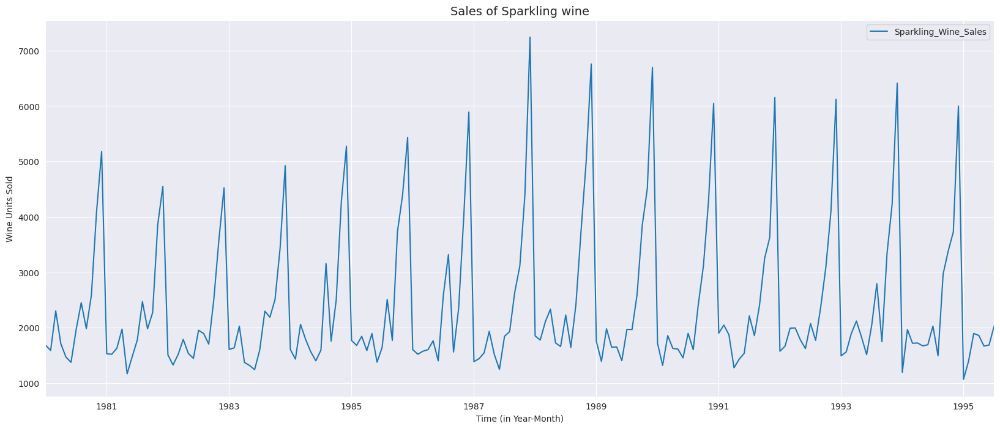

In [18]:
rcParams['figure.figsize'] = 20,8
df.plot(grid=True);
plt.title('Sales of Sparkling wine', fontsize=14)
plt.xlabel('Time (in Year-Month)',fontsize=10)
plt.ylabel('Wine Units Sold',fontsize=10)


## 2.2. Perform appropriate Exploratory Data Analysis to understand the data and also perform decomposition.

In [19]:
df.head()

,Sparkling_Wine_Sales
Time_Stamp,
1980-01-31,1686
1980-02-29,1591
1980-03-31,2304
1980-04-30,1712
1980-05-31,1471


### Check the basic measures of descriptive statistics

In [20]:
df.describe()

,Sparkling_Wine_Sales
count,187.000000
mean,2402.417112
std,1295.111540
min,1070.000000
25%,1605.000000
50%,1874.000000
75%,2549.000000
max,7242.000000


1. The average sales of Sparkling wine is around 2402 units
2. The minimuim quantity of sales recorded is 1070 and the max is 7242 units
3. Around 50% of the sales recorded in a month are around 1874 units
4. Only 25% of the sales recorded in a month are above 2549 units

### Plot a boxplot to understand the spread of sales across different years and within different months across years.

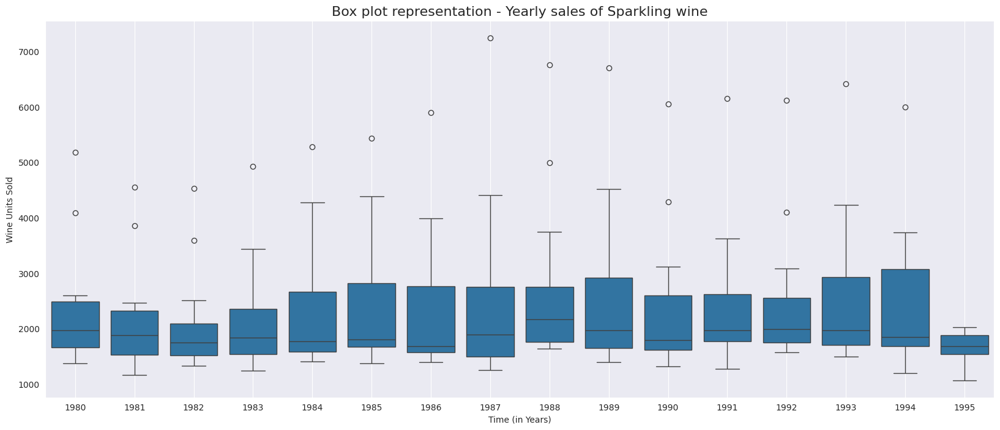

In [21]:
_, ax = plt.subplots(figsize=(20,8))
sns.boxplot(x = df.index.year,y = df.values[:,0],ax=ax)
plt.title('Box plot representation - Yearly sales of Sparkling wine', fontsize=16)
plt.xlabel('Time (in Years)')
plt.ylabel('Wine Units Sold')
plt.grid();

1. The sales of sparkling wine have gradually maintained within a range over the years
2. The maximum sales were in the year 1988

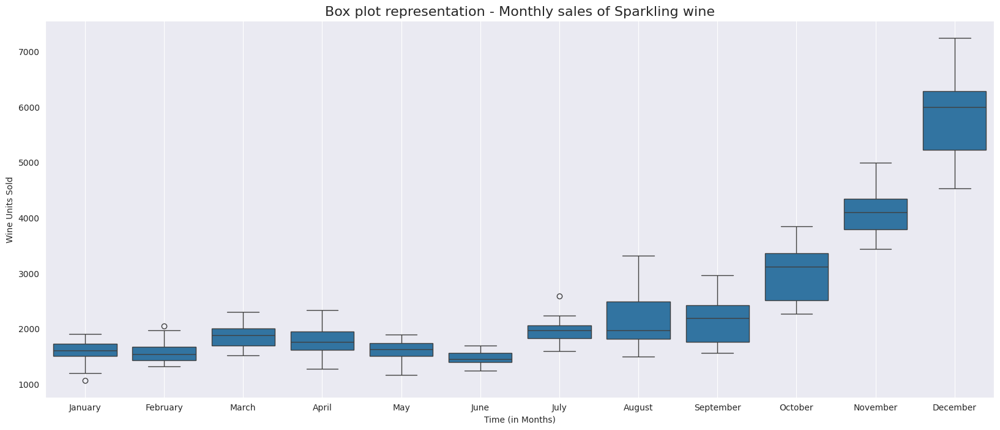

In [22]:
_, ax = plt.subplots(figsize=(20,8))
sns.boxplot(x = df.index.month_name(),y = df.values[:,0],ax=ax)
plt.title('Box plot representation - Monthly sales of Sparkling wine', fontsize=16)
plt.xlabel('Time (in Months)')
plt.ylabel('Wine Units Sold')
plt.grid();

1. December month records the highest average sales
2. The sales seems to usually pick in the last 4 months

Average order is greater in december and lowest in June

### Plot the empirical cumulative Distribution function

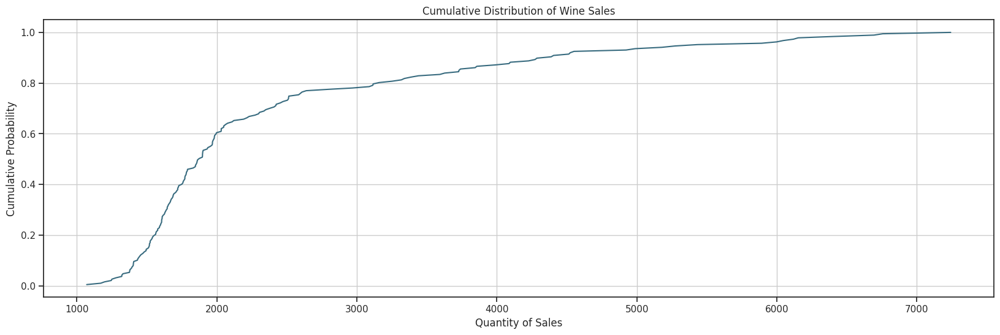

In [23]:
## Plot ECDF: Empirical Cumulative Distribution Function
#ECDF - Adds up the number of observations that are there for a certain value.
sns.set(style = "ticks")# to format into seaborn
c = '#386B7F' # basic color for plots
plt.figure(figsize = (20, 20))


plt.subplot(312)
cdf = ECDF(df['Sparkling_Wine_Sales'])
plt.plot(cdf.x, cdf.y, label = "statmodels", color = c)
plt.title('Cumulative Distribution of Wine Sales')
plt.xlabel('Quantity of Sales');
plt.ylabel('Cumulative Probability')
plt.grid(True)
plt.show()

Read properly and give observations in report

### Monthly sales across years.

In [24]:
monthly_sales_across_years = pd.pivot_table(df, values = 'Sparkling_Wine_Sales', columns = df.index.month_name(), index = df.index.year)
monthly_sales_across_years

Time_Stamp,April,August,December,February,January,July,June,March,May,November,October,September
Time_Stamp,,,,,,,,,,,,
1980,1712.0,2453.0,5179.0,1591.0,1686.0,1966.0,1377.0,2304.0,1471.0,4087.0,2596.0,1984.0
1981,1976.0,2472.0,4551.0,1523.0,1530.0,1781.0,1480.0,1633.0,1170.0,3857.0,2273.0,1981.0
1982,1790.0,1897.0,4524.0,1329.0,1510.0,1954.0,1449.0,1518.0,1537.0,3593.0,2514.0,1706.0
1983,1375.0,2298.0,4923.0,1638.0,1609.0,1600.0,1245.0,2030.0,1320.0,3440.0,2511.0,2191.0
1984,1789.0,3159.0,5274.0,1435.0,1609.0,1597.0,1404.0,2061.0,1567.0,4273.0,2504.0,1759.0
1985,1589.0,2512.0,5434.0,1682.0,1771.0,1645.0,1379.0,1846.0,1896.0,4388.0,3727.0,1771.0
1986,1605.0,3318.0,5891.0,1523.0,1606.0,2584.0,1403.0,1577.0,1765.0,3987.0,2349.0,1562.0
1987,1935.0,1930.0,7242.0,1442.0,1389.0,1847.0,1250.0,1548.0,1518.0,4405.0,3114.0,2638.0
1988,2336.0,1645.0,6757.0,1779.0,1853.0,2230.0,1661.0,2108.0,1728.0,4988.0,3740.0,2421.0


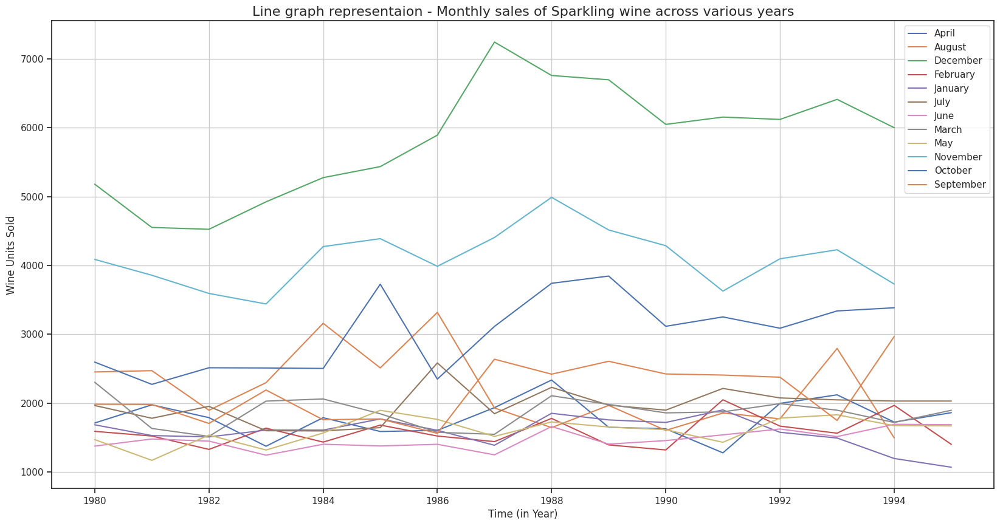

In [25]:
monthly_sales_across_years.plot(figsize=(20,10))
plt.grid();
plt.title('Line graph representaion - Monthly sales of Sparkling wine across various years', fontsize=16)
plt.xlabel('Time (in Year)')
plt.ylabel('Wine Units Sold')
plt.legend(loc='best');

1. December performed the best in terms of overall and average sales

### Resampling monthly data into a quarterly and yearly format

### Yearly plot

Let us try to resample or aggregate the Time Series from an annual perspective and sum up the observations of each month.

In [26]:
df_yearly_sum = df.resample('A').sum()
df_yearly_sum

,Sparkling_Wine_Sales
Time_Stamp,
1980-12-31,28406
1981-12-31,26227
1982-12-31,25321
1983-12-31,26180
1984-12-31,28431
1985-12-31,29640
1986-12-31,29170
1987-12-31,30258
1988-12-31,33246


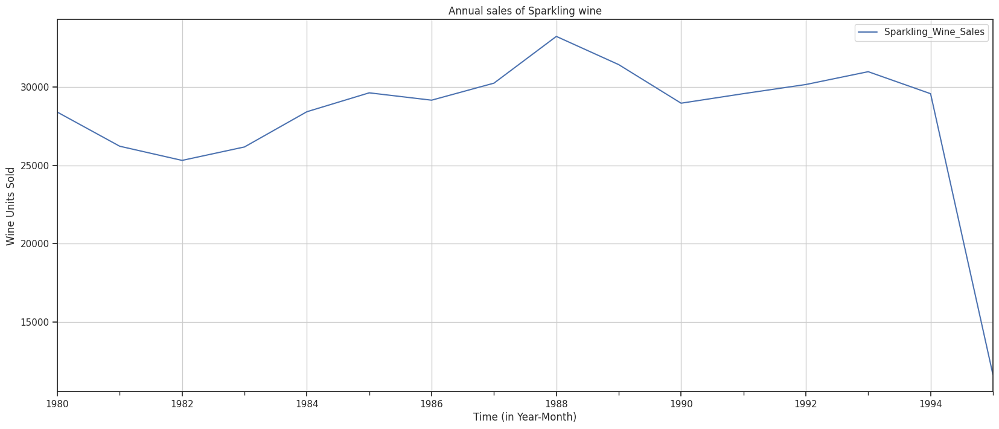

In [27]:
df_yearly_sum.plot();
plt.grid()
plt.title('Annual sales of Sparkling wine');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold');

Let us try to resample or aggregate the Time Series from an annual perspective and take the mean of the observations of the year considering each month as an observation.

### Quarterly Plot

In [28]:
df_quarterly_sum = df.resample('Q').sum()
df_quarterly_sum.head(10)

,Sparkling_Wine_Sales
Time_Stamp,
1980-03-31,5581
1980-06-30,4560
1980-09-30,6403
1980-12-31,11862
1981-03-31,4686
1981-06-30,4626
1981-09-30,6234
1981-12-31,10681
1982-03-31,4357


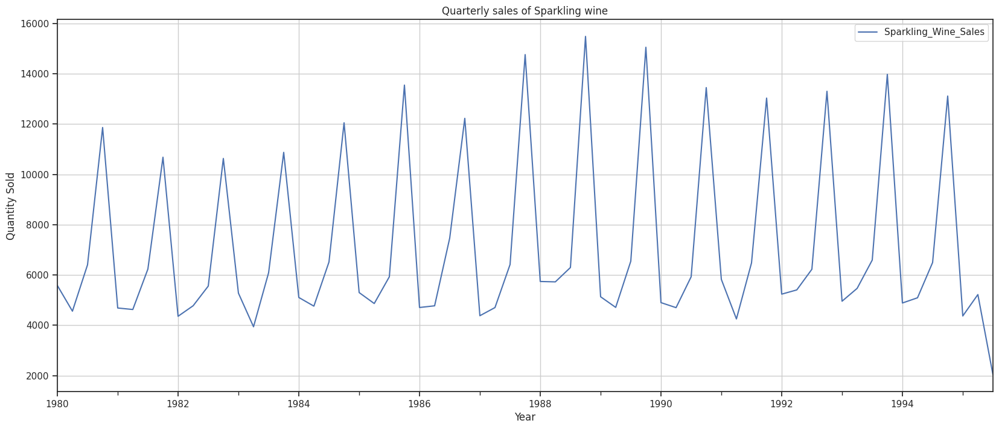

In [29]:
df_quarterly_sum.plot();
plt.grid()
plt.title('Quarterly sales of Sparkling wine');
plt.xlabel('Year')
plt.ylabel('Quantity Sold');

### Month plot of times series

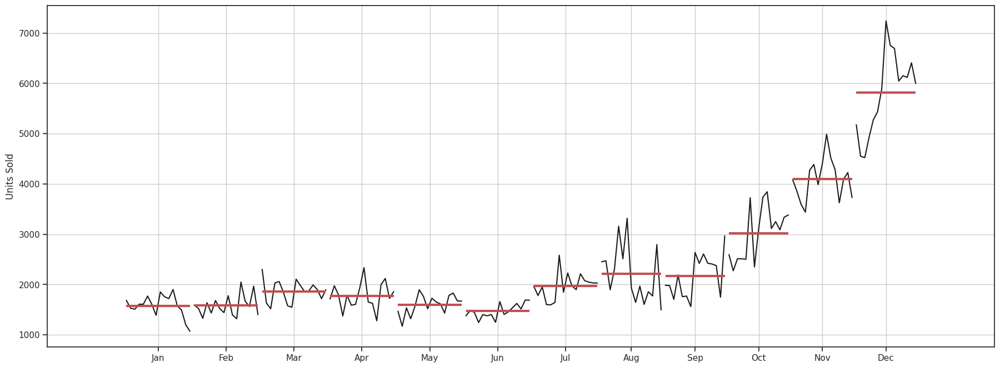

In [30]:
from statsmodels.graphics.tsaplots import month_plot

fig, ax = plt.subplots(figsize=(22,8))

month_plot(df,ylabel='Units Sold',ax=ax)
plt.grid();

1. The sales are incresingly high in Q3 and Q4

### Plot the average sales per month and the month on month percentage change of sales.

In [31]:
df.groupby(by=df.index)["Sparkling_Wine_Sales"].mean()

,Sparkling_Wine_Sales
Time_Stamp,
1980-01-31,1686.0
1980-02-29,1591.0
1980-03-31,2304.0
1980-04-30,1712.0
1980-05-31,1471.0
...,...
1995-03-31,1897.0
1995-04-30,1862.0
1995-05-31,1670.0


In [32]:
df.groupby(by=df.index)["Sparkling_Wine_Sales"].sum().pct_change()

,Sparkling_Wine_Sales
Time_Stamp,
1980-01-31,NaN
1980-02-29,-0.056346
1980-03-31,0.448146
1980-04-30,-0.256944
1980-05-31,-0.140771
...,...
1995-03-31,0.353067
1995-04-30,-0.018450
1995-05-31,-0.103115


Text(0, 0.5, '% Change')

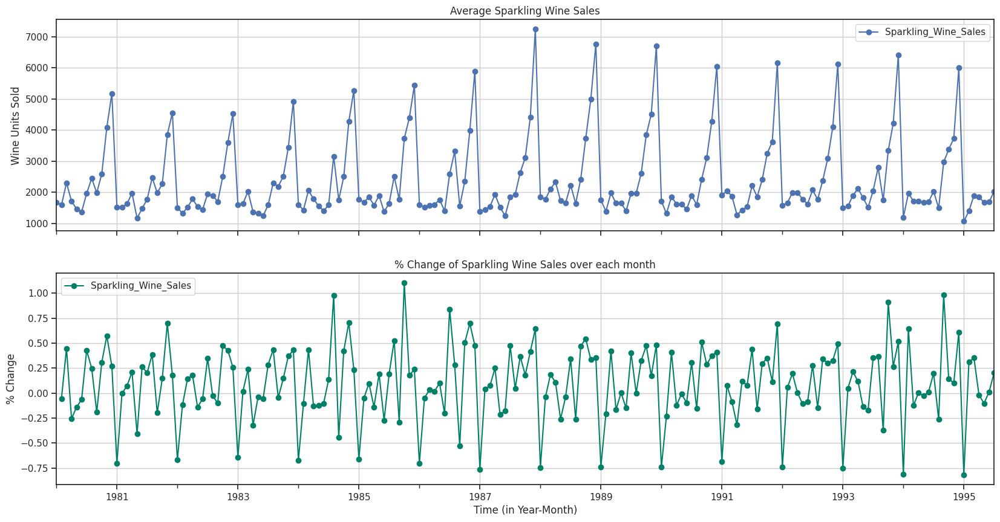

In [33]:
# group by date and get average RetailSales, and percent change
average    = df.groupby(by=df.index)["Sparkling_Wine_Sales"].mean()
pct_change = df.groupby(by=df.index)["Sparkling_Wine_Sales"].sum().pct_change()

fig, (axis1,axis2) = plt.subplots(2,1,sharex=True,figsize=(20,10))
# plot average RetailSales over time(year-month)
ax1 = average.plot(legend=True,ax=axis1,marker='o',title="Average Sparkling Wine Sales",grid=True)
ax1.set_xticks(range(len(average)))
ax1.set_xticklabels(average.index.tolist())
ax1.set_ylabel('Wine Units Sold')
# plot precent change for RetailSales over time(year-month)
ax2 = pct_change.plot(legend=True,ax=axis2,marker='o',colormap="summer",title="% Change of Sparkling Wine Sales over each month",grid=True)
plt.xlabel('Time (in Year-Month)')
ax2.set_ylabel('% Change')


1. Average Sparkling wine sales graph shows us a no trend however yearly seasonality present in it
2. % change graph shows us the seasonality of the change in sales to be constant throghout the lifetime of sales

### Decomposition of the Time Series

### Additive decomposition

<Figure size 2000x800 with 0 Axes>

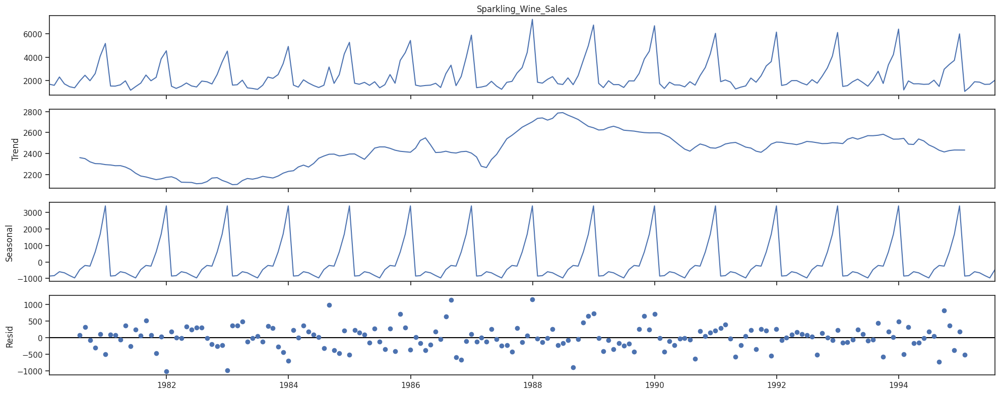

In [34]:
plt.figure(figsize=(20,8))
decomposition = seasonal_decompose(df['Sparkling_Wine_Sales'],model='additive')
decomposition.plot();
plt.show()

In [35]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 Time_Stamp
1980-01-31            NaN
1980-02-29            NaN
1980-03-31            NaN
1980-04-30            NaN
1980-05-31            NaN
1980-06-30            NaN
1980-07-31    2360.666667
1980-08-31    2351.333333
1980-09-30    2320.541667
1980-10-31    2303.583333
1980-11-30    2302.041667
1980-12-31    2293.791667
Name: trend, dtype: float64 

Seasonality 
 Time_Stamp
1980-01-31    -854.260599
1980-02-29    -830.350678
1980-03-31    -592.356630
1980-04-30    -658.490559
1980-05-31    -824.416154
1980-06-30    -967.434011
1980-07-31    -465.502265
1980-08-31    -214.332821
1980-09-30    -254.677265
1980-10-31     599.769957
1980-11-30    1675.067179
1980-12-31    3386.983846
Name: seasonal, dtype: float64 

Residual 
 Time_Stamp
1980-01-31           NaN
1980-02-29           NaN
1980-03-31           NaN
1980-04-30           NaN
1980-05-31           NaN
1980-06-30           NaN
1980-07-31     70.835599
1980-08-31    315.999487
1980-09-30    -81.864401
1980-10-31   -307.3532

### Multiplicative Decomposition

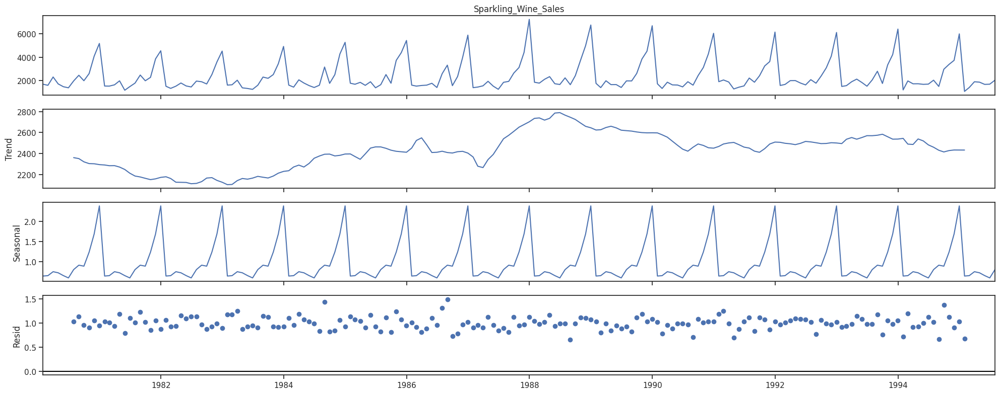

In [36]:
decomposition = seasonal_decompose(df['Sparkling_Wine_Sales'],model='multiplicative')
decomposition.plot();

In [37]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 Time_Stamp
1980-01-31            NaN
1980-02-29            NaN
1980-03-31            NaN
1980-04-30            NaN
1980-05-31            NaN
1980-06-30            NaN
1980-07-31    2360.666667
1980-08-31    2351.333333
1980-09-30    2320.541667
1980-10-31    2303.583333
1980-11-30    2302.041667
1980-12-31    2293.791667
Name: trend, dtype: float64 

Seasonality 
 Time_Stamp
1980-01-31    0.649843
1980-02-29    0.659214
1980-03-31    0.757440
1980-04-30    0.730351
1980-05-31    0.660609
1980-06-30    0.603468
1980-07-31    0.809164
1980-08-31    0.918822
1980-09-30    0.894367
1980-10-31    1.241789
1980-11-30    1.690158
1980-12-31    2.384776
Name: seasonal, dtype: float64 

Residual 
 Time_Stamp
1980-01-31         NaN
1980-02-29         NaN
1980-03-31         NaN
1980-04-30         NaN
1980-05-31         NaN
1980-06-30         NaN
1980-07-31    1.029230
1980-08-31    1.135407
1980-09-30    0.955954
1980-10-31    0.907513
1980-11-30    1.050423
1980-12-31    0.946770
Name: r

## 3. Split the data into training and test. The test data should start in 1991.

### Splitting the data into training and testing

In [38]:
train = df[df.index.year < 1991]
test = df[df.index.year >= 1991]

In [39]:
from IPython.display import display

In [40]:
print('First few rows of Training Data')
display(train.head(10))
print('Last few rows of Training Data')
display(train.tail(10))

First few rows of Training Data


,Sparkling_Wine_Sales
Time_Stamp,
1980-01-31,1686
1980-02-29,1591
1980-03-31,2304
1980-04-30,1712
1980-05-31,1471
1980-06-30,1377
1980-07-31,1966
1980-08-31,2453
1980-09-30,1984


Last few rows of Training Data


,Sparkling_Wine_Sales
Time_Stamp,
1990-03-31,1859
1990-04-30,1628
1990-05-31,1615
1990-06-30,1457
1990-07-31,1899
1990-08-31,1605
1990-09-30,2424
1990-10-31,3116
1990-11-30,4286


In [41]:
print('First few rows of Test Data')
display(test.head(10))
print('Last few rows of Test Data')
display(test.tail(10))

First few rows of Test Data


,Sparkling_Wine_Sales
Time_Stamp,
1991-01-31,1902
1991-02-28,2049
1991-03-31,1874
1991-04-30,1279
1991-05-31,1432
1991-06-30,1540
1991-07-31,2214
1991-08-31,1857
1991-09-30,2408


Last few rows of Test Data


,Sparkling_Wine_Sales
Time_Stamp,
1994-10-31,3385
1994-11-30,3729
1994-12-31,5999
1995-01-31,1070
1995-02-28,1402
1995-03-31,1897
1995-04-30,1862
1995-05-31,1670
1995-06-30,1688


In [42]:
print('-------------------------------------')
print('Number of observations in Train data   :  ',train.shape)
print('Number of observations in Test data    :  ',test.shape)
print('Total Observations                     :  ',test.shape[0]+train.shape[0])
print('-------------------------------------')

-------------------------------------
Number of observations in Train data   :   (132, 1)
Number of observations in Test data    :   (55, 1)
Total Observations                     :   187
-------------------------------------


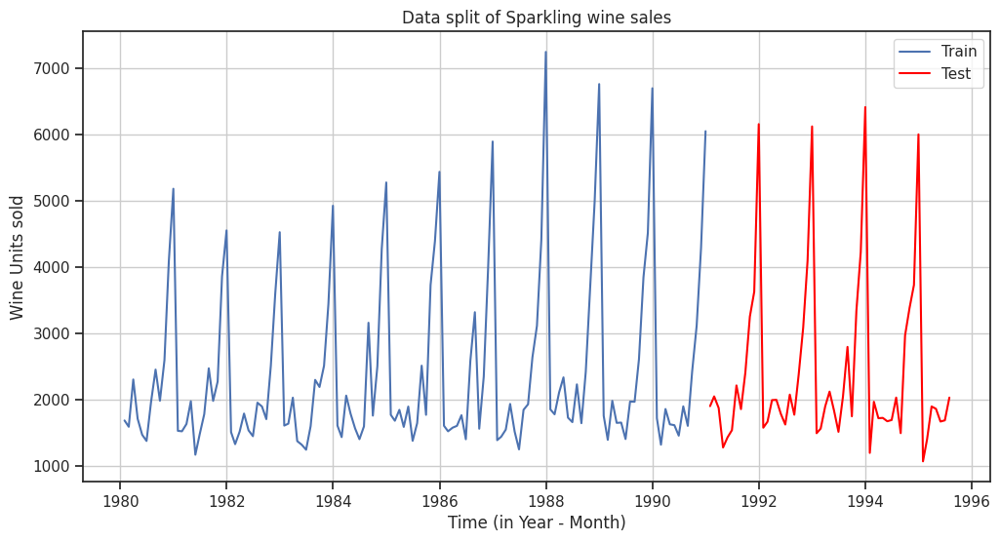

In [43]:
plt.figure(figsize = (12, 6))
plt.plot(train['Sparkling_Wine_Sales'], label = 'Train')
plt.plot(test['Sparkling_Wine_Sales'], label = 'Test', color='Red')
plt.legend(loc='best')
plt.xlabel('Time (in Year - Month)')
plt.ylabel('Wine Units sold')
plt.title('Data split of Sparkling wine sales', fontsize = 12)
plt.show;
plt.grid();


## 4. Build all the exponential smoothing models on the training data and evaluate the model using RMSE on the test data. Other models such as regression,naïve forecast models and simple average models. should also be built on the training data and check the performance on the test data using RMSE.

## Model 1: Linear Regression

In [44]:
train_time = [i+1 for i in range(len(train))]
test_time = [i+len(train)+1 for i in range(len(test))]
print('Training Time instance','\n',train_time)
print('\n')
print('Test Time instance','\n',test_time)

Training Time instance 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132]


Test Time instance 
 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


We see that we have successfully the generated the numerical time instance order for both the training and test set. Now we will add these values in the training and test set.

In [45]:
LinearRegression_train = train.copy()
LinearRegression_test = test.copy()

In [46]:
LinearRegression_train['Time'] = train_time
LinearRegression_test['Time'] = test_time

print('First few rows of Training Data','\n',LinearRegression_train.head(),'\n')
print('Last few rows of Training Data','\n',LinearRegression_train.tail(),'\n')
print('First few rows of Test Data','\n',LinearRegression_test.head(),'\n')
print('Last few rows of Test Data','\n',LinearRegression_test.tail(),'\n')

First few rows of Training Data 
             Sparkling_Wine_Sales  Time
Time_Stamp                            
1980-01-31                  1686     1
1980-02-29                  1591     2
1980-03-31                  2304     3
1980-04-30                  1712     4
1980-05-31                  1471     5 

Last few rows of Training Data 
             Sparkling_Wine_Sales  Time
Time_Stamp                            
1990-08-31                  1605   128
1990-09-30                  2424   129
1990-10-31                  3116   130
1990-11-30                  4286   131
1990-12-31                  6047   132 

First few rows of Test Data 
             Sparkling_Wine_Sales  Time
Time_Stamp                            
1991-01-31                  1902   133
1991-02-28                  2049   134
1991-03-31                  1874   135
1991-04-30                  1279   136
1991-05-31                  1432   137 

Last few rows of Test Data 
             Sparkling_Wine_Sales  Time
Time_Stamp

Now that our training and test data has been modified, let us go ahead use $\underline{Linear Regression}$ to build the model on the training data and test the model on the test data.

In [47]:
from sklearn.linear_model import LinearRegression

In [48]:
lr = LinearRegression()

In [49]:
lr.fit(LinearRegression_train[['Time']],LinearRegression_train['Sparkling_Wine_Sales'].values)

LinearRegression()

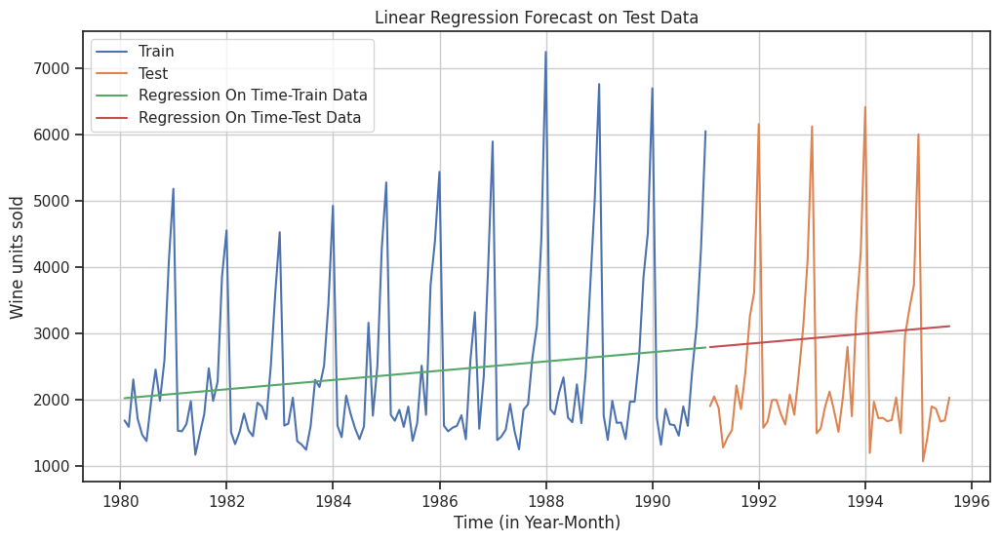

In [50]:
test_predictions_model1 = lr.predict(LinearRegression_test[['Time']])
LinearRegression_test['RegOnTime'] = test_predictions_model1

train_predictions_model1 = lr.predict(LinearRegression_train[['Time']])
LinearRegression_train['RegOnTime'] = train_predictions_model1

plt.figure(figsize=(12,6))
plt.title('Linear Regression Forecast on Test Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine units sold')
plt.plot( train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')
plt.plot(LinearRegression_train['RegOnTime'], label='Regression On Time-Train Data')
plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Time-Test Data')
plt.legend(loc='best')
plt.grid();

### Model evaluation - Linear Regression

In [53]:
# Test Data - RMSE

# rmse_LR_test = metrics.mean_squared_error(test['Sparkling_Wine_Sales'],LinearRegression_test['RegOnTime'],squared=False)
# The 'squared' argument is removed and the function is replaced with root_mean_squared_error
rmse_LR_test = metrics.root_mean_squared_error(test['Sparkling_Wine_Sales'], LinearRegression_test['RegOnTime'])
print("For RegressionOnTime forecast on the Test Data,  RMSE is %3.3f" %(rmse_LR_test))

For RegressionOnTime forecast on the Test Data,  RMSE is 1389.135


In [54]:
resultsDf = pd.DataFrame({'Test RMSE': [rmse_LR_test]},index=['Linear Regression'])
resultsDf

,Test RMSE
Linear Regression,1389.135175


## Model 2: Naive Forecast ($\hat{y}_{t+1} = y_t$)

#### For this particular naive model, we say that the prediction for tomorrow is the same as today and the prediction for day after tomorrow is tomorrow and since the prediction of tomorrow is same as today,therefore the prediction for day after tomorrow is also today.

In [55]:
NaiveModel_train = train.copy()
NaiveModel_test = test.copy()

In [56]:
#Taking the last value in the train data
NaiveModel_test['naive'] = np.asarray(train['Sparkling_Wine_Sales'])[len(np.asarray(train['Sparkling_Wine_Sales']))-1]
NaiveModel_test['naive'].head()

,naive
Time_Stamp,
1991-01-31,6047
1991-02-28,6047
1991-03-31,6047
1991-04-30,6047
1991-05-31,6047


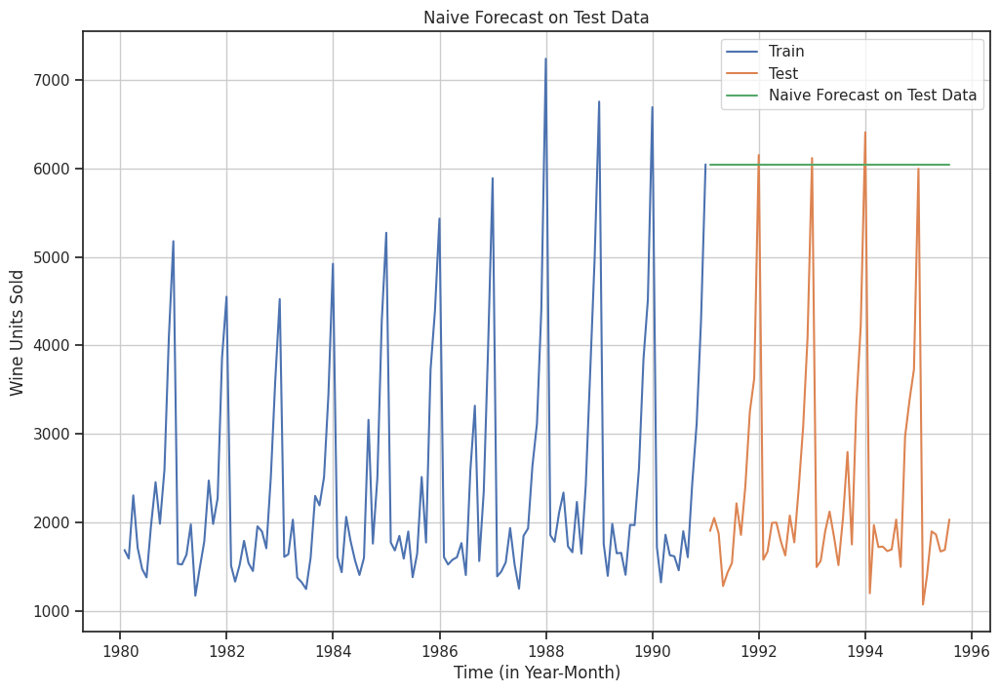

In [57]:
plt.figure(figsize=(12,8))
plt.title('Naive Forecast on Test Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.plot(NaiveModel_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')
plt.plot(NaiveModel_test['naive'], label='Naive Forecast on Test Data')
plt.legend(loc='best')
plt.grid();

### Model Evauation - Naive Forecast Model

In [67]:
# Testing Data - RMSE and MAPE

rmse_Naive_test = metrics.mean_squared_error(test['Sparkling_Wine_Sales'],NaiveModel_test['naive'])
print("For Naive forecast on the Testing Data:  RMSE is %3.3f " %(rmse_Naive_test))


For Naive forecast on the Testing Data:  RMSE is 14932654.909 


In [68]:
resultsDf2 = pd.DataFrame({'Test RMSE': [rmse_Naive_test]},index=['Naive Model'])

resultsDf = pd.concat([resultsDf, resultsDf2])
resultsDf

,Test RMSE
Linear Regression,1.389135e+03
Naive Model,1.493265e+07


## Method 3: Simple Average

### For this particular simple average method, we will forecast by using the average of the training values.

In [69]:
SimpleAverage_train = train.copy()
SimpleAverage_test = test.copy()

In [70]:
SimpleAverage_test['mean_forecast'] = train['Sparkling_Wine_Sales'].mean()
SimpleAverage_test.head()

,Sparkling_Wine_Sales,mean_forecast
Time_Stamp,,
1991-01-31,1902,2403.780303
1991-02-28,2049,2403.780303
1991-03-31,1874,2403.780303
1991-04-30,1279,2403.780303
1991-05-31,1432,2403.780303


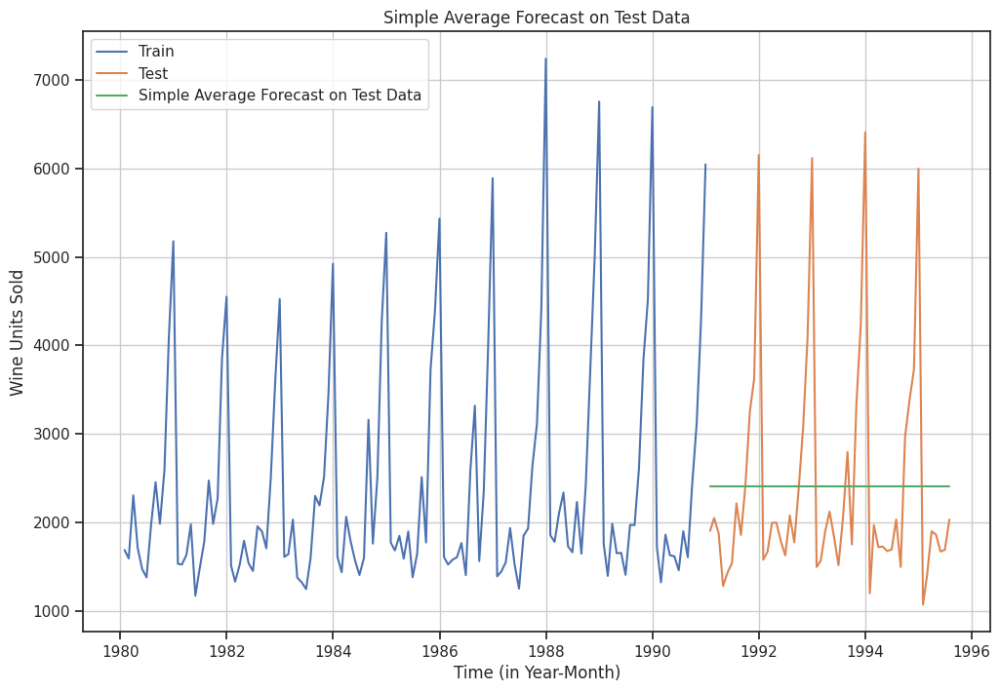

In [71]:
plt.figure(figsize=(12,8))
plt.title('Simple Average Forecast on Test Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.plot(SimpleAverage_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(SimpleAverage_test['Sparkling_Wine_Sales'], label='Test')
plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average Forecast on Test Data')
plt.legend(loc='best')
plt.grid();

### Model Evauation - Simple Average Model

In [102]:
## Test Data - RMSE

rmse_simple_average_test = metrics.mean_squared_error(test['Sparkling_Wine_Sales'],SimpleAverage_test['mean_forecast'])
print("For Simple Average forecast on the Test Data,  RMSE is %3.3f" %(rmse_simple_average_test))

For Simple Average forecast on the Test Data,  RMSE is 1625833.606


In [103]:
resultsDf3 = pd.DataFrame({'Test RMSE': [rmse_simple_average_test]},index=['Simple Average'])

resultsDf = pd.concat([resultsDf, resultsDf3])
resultsDf

,Test RMSE
Linear Regression,1.389135e+03
Naive Model,1.493265e+07
Simple Average,1.625834e+06


## Model 4: Moving Average (MA)

### For the moving average model, we are going to calculate rolling means (or moving averages) for different intervals. The best interval can be determined by the maximum accuracy (or the minimum error) over here.

#### For Moving Average, we are going to average over the entire data.

In [104]:
MovingAverage = df.copy()
MovingAverage.head()

,Sparkling_Wine_Sales
Time_Stamp,
1980-01-31,1686
1980-02-29,1591
1980-03-31,2304
1980-04-30,1712
1980-05-31,1471


#### Trailing moving averages

In [105]:
MovingAverage['Trailing_2'] = MovingAverage['Sparkling_Wine_Sales'].rolling(2).mean()
MovingAverage['Trailing_4'] = MovingAverage['Sparkling_Wine_Sales'].rolling(4).mean()
MovingAverage['Trailing_6'] = MovingAverage['Sparkling_Wine_Sales'].rolling(6).mean()
MovingAverage['Trailing_9'] = MovingAverage['Sparkling_Wine_Sales'].rolling(9).mean()

MovingAverage.head(9)

,Sparkling_Wine_Sales,Trailing_2,Trailing_4,Trailing_6,Trailing_9
Time_Stamp,,,,,
1980-01-31,1686,NaN,NaN,NaN,NaN
1980-02-29,1591,1638.5,NaN,NaN,NaN
1980-03-31,2304,1947.5,NaN,NaN,NaN
1980-04-30,1712,2008.0,1823.25,NaN,NaN
1980-05-31,1471,1591.5,1769.50,NaN,NaN
1980-06-30,1377,1424.0,1716.00,1690.166667,NaN
1980-07-31,1966,1671.5,1631.50,1736.833333,NaN
1980-08-31,2453,2209.5,1816.75,1880.500000,NaN
1980-09-30,1984,2218.5,1945.00,1827.166667,1838.222222


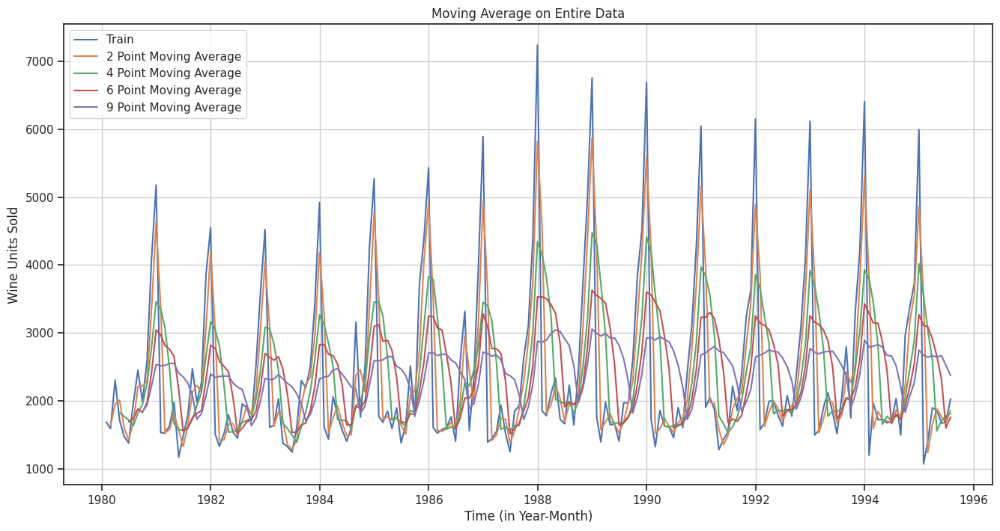

In [106]:
#Plotting on the whole data

plt.figure(figsize=(16,8))
plt.plot(MovingAverage['Sparkling_Wine_Sales'], label='Train')
plt.plot(MovingAverage['Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage['Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage['Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage['Trailing_9'],label = '9 Point Moving Average')
plt.title('Moving Average on Entire Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

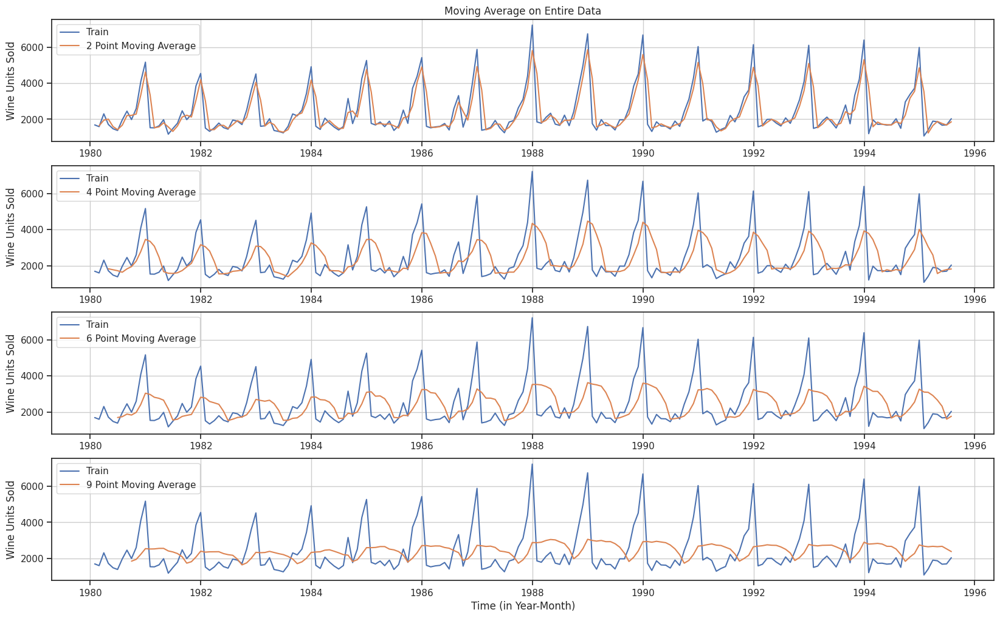

In [107]:
#Plotting on the whole data separately

plt.figure(figsize=(20,12))


plt.subplot(4,1,1)
plt.plot(MovingAverage['Sparkling_Wine_Sales'], label='Train')
plt.plot(MovingAverage['Trailing_2'], label='2 Point Moving Average')
plt.title('Moving Average on Entire Data')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

plt.subplot(4,1,2)
plt.plot(MovingAverage['Sparkling_Wine_Sales'], label='Train')
plt.plot(MovingAverage['Trailing_4'], label='4 Point Moving Average')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

plt.subplot(4,1,3)
plt.plot(MovingAverage['Sparkling_Wine_Sales'], label='Train')
plt.plot(MovingAverage['Trailing_6'],label = '6 Point Moving Average')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

plt.subplot(4,1,4)
plt.plot(MovingAverage['Sparkling_Wine_Sales'], label='Train')
plt.plot(MovingAverage['Trailing_9'],label = '9 Point Moving Average')
plt.ylabel('Wine Units Sold')
plt.xlabel('Time (in Year-Month)')
plt.legend(loc = 'best')

plt.grid();

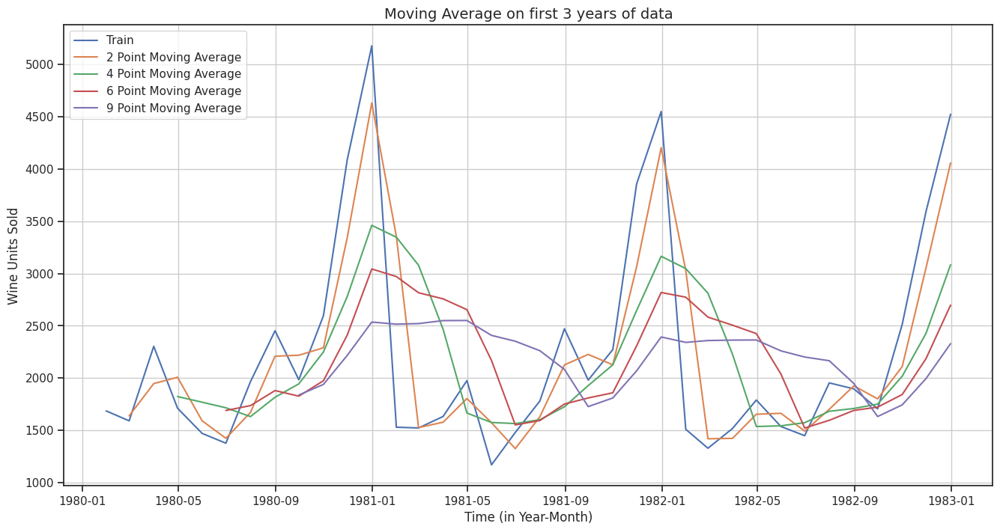

In [108]:
#Plotting on the first 3 years of data

plt.figure(figsize=(16,8))
plt.plot(MovingAverage['Sparkling_Wine_Sales'].iloc[:-151], label='Train')
plt.plot(MovingAverage['Trailing_2'].iloc[:-151], label='2 Point Moving Average')
plt.plot(MovingAverage['Trailing_4'].iloc[:-151], label='4 Point Moving Average')
plt.plot(MovingAverage['Trailing_6'].iloc[:-151],label = '6 Point Moving Average')
plt.plot(MovingAverage['Trailing_9'].iloc[:-151],label = '9 Point Moving Average')
plt.title('Moving Average on first 3 years of data',fontsize=14)
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

In [109]:
#Creating train and test set
trailing_MovingAverage_train = MovingAverage[MovingAverage.index.year < 1991]
trailing_MovingAverage_test = MovingAverage[MovingAverage.index.year >= 1991]

Text(0.5, 1.0, 'Trailing Moving Average Forecast on Sparkling Wine Sales')

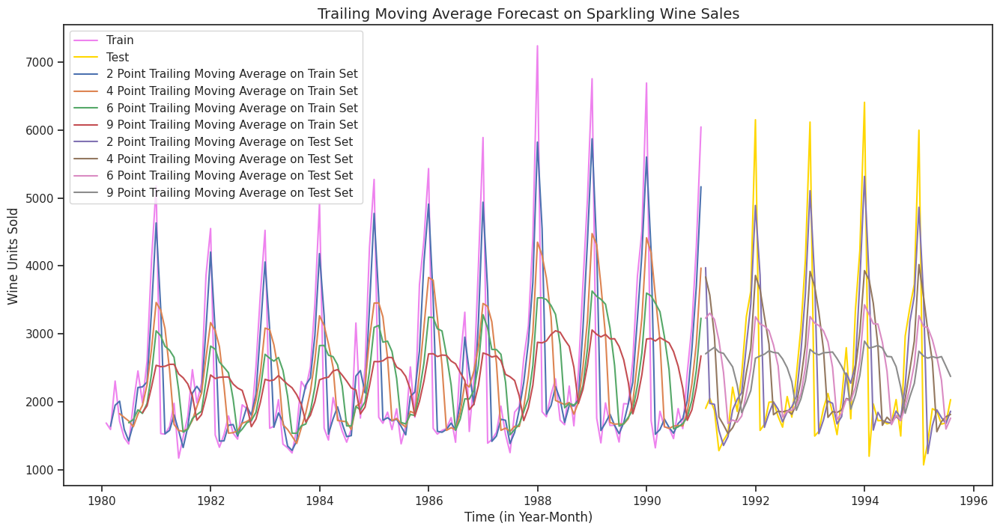

In [110]:
# Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(trailing_MovingAverage_train['Sparkling_Wine_Sales'], label='Train', color = 'violet')
plt.plot(trailing_MovingAverage_test['Sparkling_Wine_Sales'], label='Test', color = 'gold')

plt.plot(trailing_MovingAverage_train['Trailing_2'], label='2 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Trailing_4'], label='4 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Trailing_6'],label = '6 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Trailing_9'],label = '9 Point Trailing Moving Average on Train Set')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.legend(loc = 'best')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

plt.title("Trailing Moving Average Forecast on Sparkling Wine Sales", fontsize=14)

### Model Evauation - Moving Average

In [112]:
## Test Data - RMSE --> 2 point Trailing MA

rmse_MA_test_2 = metrics.mean_squared_error(test['Sparkling_Wine_Sales'],trailing_MovingAverage_test['Trailing_2'])
print("For 2 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_MA_test_2))

## Test Data - RMSE --> 4 point Trailing MA

rmse_MA_test_4 = metrics.mean_squared_error(test['Sparkling_Wine_Sales'],trailing_MovingAverage_test['Trailing_4'])
print("For 4 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_MA_test_4))

## Test Data - RMSE --> 6 point Trailing MA

rmse_MA_test_6 = metrics.mean_squared_error(test['Sparkling_Wine_Sales'],trailing_MovingAverage_test['Trailing_6'])
print("For 6 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_MA_test_6))

## Test Data - RMSE --> 9 point Trailing MA

rmse_MA_test_9 = metrics.mean_squared_error(test['Sparkling_Wine_Sales'],trailing_MovingAverage_test['Trailing_9'])
print("For 9 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_MA_test_9))

For 2 point Moving Average Model forecast on the Training Data,  RMSE is 661620.673
For 4 point Moving Average Model forecast on the Training Data,  RMSE is 1337699.720
For 6 point Moving Average Model forecast on the Training Data,  RMSE is 1648469.640
For 9 point Moving Average Model forecast on the Training Data,  RMSE is 1812465.303


In [113]:
resultsDf4 = pd.DataFrame({'Test RMSE': [rmse_MA_test_2,rmse_MA_test_4
                                          ,rmse_MA_test_6,rmse_MA_test_9]
                            }
                           ,index=['2 point TMA','4 point TMA'
                                   ,'6 point TMA','9 point TMA'])

resultsDf = pd.concat([resultsDf, resultsDf4])
resultsDf

,Test RMSE
Linear Regression,1.389135e+03
Naive Model,1.493265e+07
Simple Average,1.625834e+06
2 point TMA,6.616207e+05
4 point TMA,1.337700e+06
6 point TMA,1.648470e+06
9 point TMA,1.812465e+06


### Before we go on to build the various Exponential Smoothing models, let us plot all the models and compare the Time Series plots.

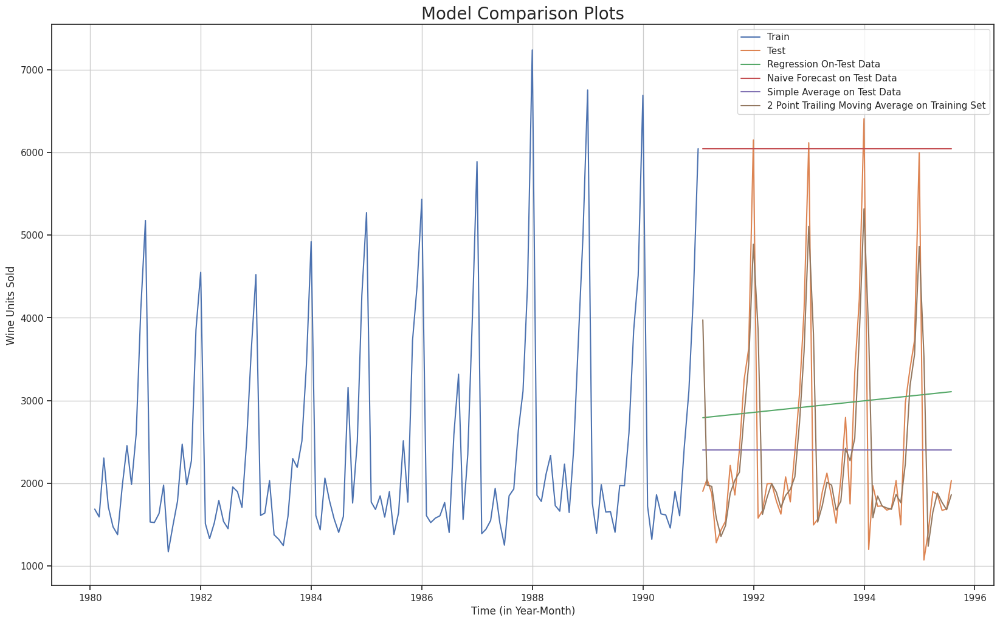

In [114]:
## Plotting on both Training and Test data

plt.figure(figsize=(20,12))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(LinearRegression_test['RegOnTime'], label='Regression On-Test Data')

plt.plot(NaiveModel_test['naive'], label='Naive Forecast on Test Data')

plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average on Test Data')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Training Set')


plt.legend(loc='best')
plt.title("Model Comparison Plots",fontsize=20)
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

## Model 5: Simple Exponential Smoothing

In [116]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

In [117]:
SES_train = train.copy()
SES_test = test.copy()

In [118]:
model_SES = SimpleExpSmoothing(SES_train['Sparkling_Wine_Sales'])

In [119]:
# Fitting the Simple Exponential Smoothing model and asking python to choose the optimal parameters
model_SES_autofit = model_SES.fit(optimized=True)

In [120]:
model_SES_autofit.params

{'smoothing_level': np.float64(0.03953488372093023),
 'smoothing_trend': np.float64(nan),
 'smoothing_seasonal': np.float64(nan),
 'damping_trend': nan,
 'initial_level': np.float64(1686.0),
 'initial_trend': np.float64(nan),
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [121]:
SES_test['predict'] = model_SES_autofit.forecast(steps=len(test))
SES_test.head()

,Sparkling_Wine_Sales,predict
Time_Stamp,,
1991-01-31,1902,2676.676366
1991-02-28,2049,2676.676366
1991-03-31,1874,2676.676366
1991-04-30,1279,2676.676366
1991-05-31,1432,2676.676366


Text(0, 0.5, 'Wine Units Sold')

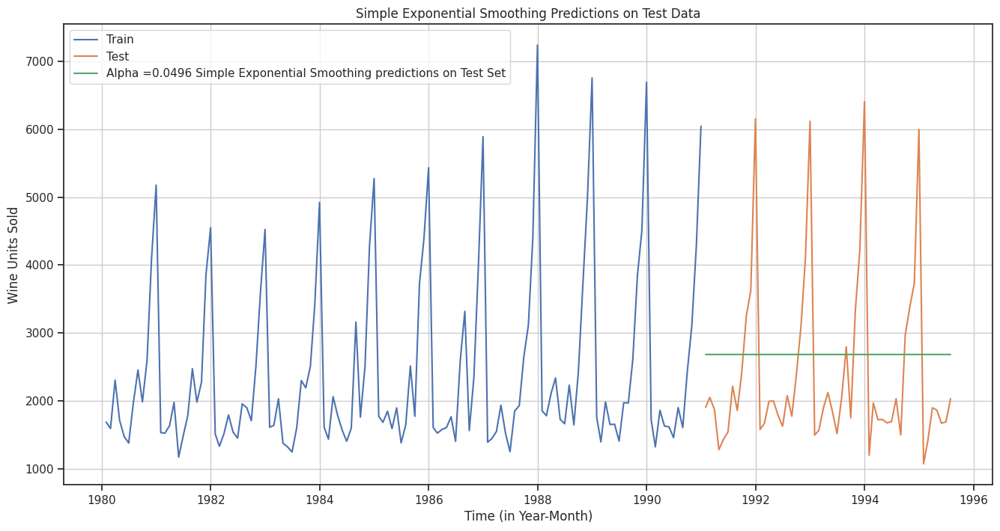

In [122]:
## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(SES_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(SES_test['Sparkling_Wine_Sales'], label='Test')

plt.plot(SES_test['predict'], label='Alpha =0.0496 Simple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple Exponential Smoothing Predictions on Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

### Model Evaluation for $\alpha$ = 0.0496 : Simple Exponential Smoothing

In [136]:
## Test Data

rmse_model5_test_1 = metrics.mean_squared_error(SES_test['Sparkling_Wine_Sales'],SES_test['predict'])
print("For Alpha =0.0496 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is %3.3f" %(rmse_model5_test_1))


For Alpha =0.0496 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is 1702835.531


In [ ]:
resultsDf_5 = pd.DataFrame({'Test RMSE': [rmse_model5_test_1]},index=['Alpha =0.0496,SimpleExponentialSmoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_5])
resultsDf

#### Setting different alpha values.

###### Remember, the higher the alpha value more weightage is given to the more recent observation. That means, what happened recently will happen again.


#### We will run a loop with different alpha values to understand which particular value works best for alpha on the test set.

In [137]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_6 = pd.DataFrame({'Alpha Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_6

,Alpha Values,Train RMSE,Test RMSE


In [139]:
for i in np.arange(0.1,1,0.05):
    model_SES_alpha_i = model_SES.fit(smoothing_level=i,optimized=False,use_brute=True)
    SES_train['predict',i] = model_SES_alpha_i.fittedvalues
    SES_test['predict',i] = model_SES_alpha_i.forecast(steps=len(test))

    rmse_model5_train_i = metrics.mean_squared_error(SES_train['Sparkling_Wine_Sales'],SES_train['predict',i])

    rmse_model5_test_i = metrics.mean_squared_error(SES_test['Sparkling_Wine_Sales'],SES_test['predict',i])

resultsDf_6 = pd.concat([resultsDf_6, pd.DataFrame([{'Alpha Values': i, 'Train RMSE': rmse_model5_train_i, 'Test RMSE': rmse_model5_test_i}])], ignore_index=True)

In [140]:
resultsDf_6.sort_values(by=['Test RMSE'],ascending=True)

,Alpha Values,Train RMSE,Test RMSE
0,0.95,1.859367e+06,1.427655e+07


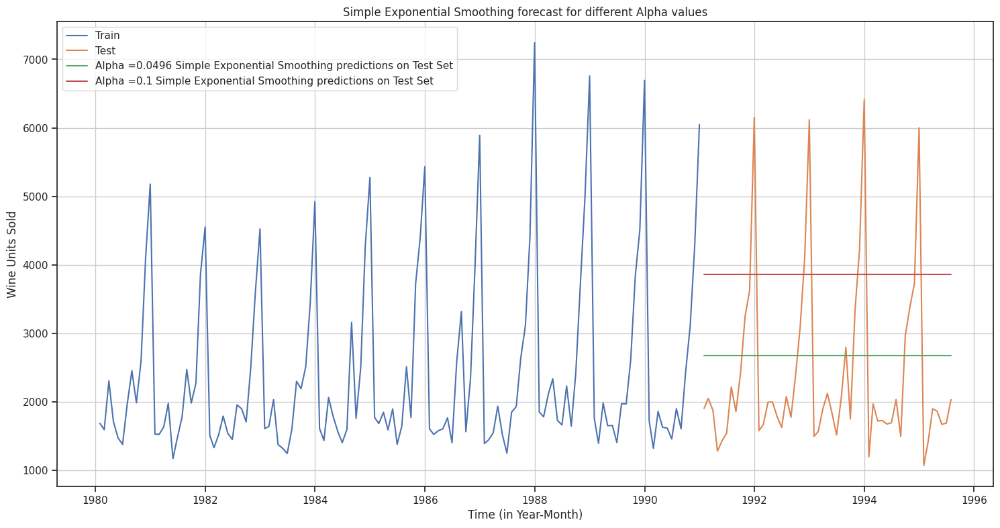

In [141]:
## Plotting on both the Training and Test data
model_SES_alpha_i = model_SES.fit(smoothing_level=0.3,optimized=False,use_brute=True)
SES_train['predict',0.1] = model_SES_alpha_i.fittedvalues
SES_test['predict',0.1] = model_SES_alpha_i.forecast(steps=len(test))

plt.figure(figsize=(18,9))
plt.plot(SES_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(SES_test['Sparkling_Wine_Sales'], label='Test')

plt.plot(SES_test['predict'], label='Alpha =0.0496 Simple Exponential Smoothing predictions on Test Set')

plt.plot(SES_test['predict',0.1], label='Alpha =0.1 Simple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.title('Simple Exponential Smoothing forecast for different Alpha values')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

## Method 6: Double Exponential Smoothing (Holt's Model)

### Two parameters $\alpha$ and $\beta$ are estimated in this model. Level and Trend are accounted for in this model.

In [143]:
DES_train = train.copy()
DES_test = test.copy()

In [144]:
# Initializing the Double Exponential Smoothing Model
model_DES = Holt(DES_train)
# Fitting the model
model_DES = model_DES.fit(optimized=True, use_brute=True)

In [145]:
model_DES.params

{'smoothing_level': np.float64(0.6885714285714285),
 'smoothing_trend': np.float64(9.999999999999999e-05),
 'smoothing_seasonal': np.float64(nan),
 'damping_trend': nan,
 'initial_level': np.float64(1686.0),
 'initial_trend': np.float64(-95.0),
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [146]:
# Forecasting using this model for the test set
DES_test['predict'] =  model_DES.forecast(len(test))
DES_test['predict']

,predict
Time_Stamp,
1991-01-31,5221.278699
1991-02-28,5127.886554
1991-03-31,5034.494409
1991-04-30,4941.102264
1991-05-31,4847.710119
1991-06-30,4754.317974
1991-07-31,4660.925829
1991-08-31,4567.533684
1991-09-30,4474.141539


Text(0, 0.5, 'Wine Units Sold')

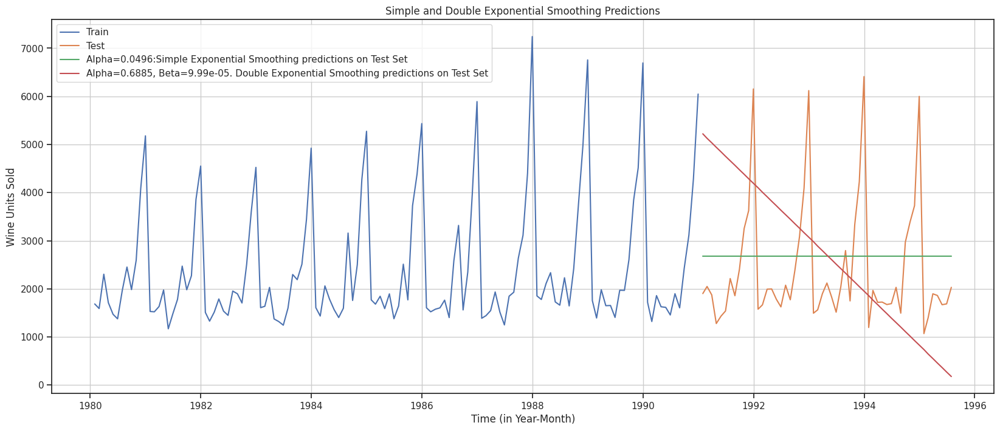

In [147]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(DES_train, label='Train')
plt.plot(DES_test['Sparkling_Wine_Sales'], label='Test')

plt.plot(SES_test['predict'], label='Alpha=0.0496:Simple Exponential Smoothing predictions on Test Set')
plt.plot(DES_test['predict'], label='Alpha=0.6885, Beta=9.99e-05. Double Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple and Double Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

### Model Evaluation - Double Exponential Smoothing(Holt's Model)

In [156]:
rmse_DES_test = metrics.mean_squared_error(DES_test['Sparkling_Wine_Sales'],DES_test['predict'])
print("For DES forecast on the Sparkling Testing Data:  RMSE is %3.3f" %(rmse_DES_test))

For DES forecast on the Sparkling Testing Data:  RMSE is 4029006.499


In [157]:
resultsDf_6 = pd.DataFrame({'Test RMSE': [rmse_DES_test]},index=['Alpha=0.6885, Beta=9.99e-05, Double Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_6])
resultsDf

,Test RMSE
Linear Regression,1.389135e+03
Naive Model,1.493265e+07
Simple Average,1.625834e+06
2 point TMA,6.616207e+05
4 point TMA,1.337700e+06
6 point TMA,1.648470e+06
9 point TMA,1.812465e+06
"Alpha=0.6885, Beta=9.99e-05, Double Exponential Smoothing",4.029006e+06


In [158]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_6 = pd.DataFrame({'Alpha':[],'Beta':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_6

,Alpha,Beta,Train RMSE,Test RMSE


In [160]:
model_DES = Holt(DES_train['Sparkling_Wine_Sales'])
results_list = []  # Create an empty list to store results
for i in np.arange(0.05, 1.05, 0.05):
    for j in np.arange(0.05, 1.05, 0.05):
        model_DES_alpha_i_j = model_DES.fit(
            smoothing_level=i, smoothing_trend=j, optimized=False, use_brute=True
        )
        DES_train['predict', i, j] = model_DES_alpha_i_j.fittedvalues
        DES_test['predict', i, j] = model_DES_alpha_i_j.forecast(len(test))

        rmse_model6_train = metrics.mean_squared_error(
            DES_train['Sparkling_Wine_Sales'], DES_train['predict', i, j]
        )

        rmse_model6_test = metrics.mean_squared_error(
            DES_test['Sparkling_Wine_Sales'], DES_test['predict', i, j]
        )

        # Append results to the list
        results_list.append(
            {'Alpha': i, 'Beta': j, 'Train RMSE': rmse_model6_train, 'Test RMSE': rmse_model6_test}
        )

# Create DataFrame from the list of results
resultsDf_6 = pd.DataFrame(results_list)

In [161]:
resultsDf_6

,Alpha,Beta,Train RMSE,Test RMSE
0,0.05,0.05,2.044973e+06,2.011880e+06
1,0.05,0.10,1.919391e+06,2.151795e+06
2,0.05,0.15,1.902089e+06,2.122970e+06
3,0.05,0.20,1.912043e+06,2.082536e+06
4,0.05,0.25,1.933233e+06,2.403810e+06
...,...,...,...,...
395,1.00,0.80,3.617656e+06,3.073846e+09
396,1.00,0.85,3.774276e+06,3.212297e+09
397,1.00,0.90,3.941688e+06,3.343520e+09
398,1.00,0.95,4.121730e+06,3.467853e+09


In [162]:
resultsDf_6.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Train RMSE,Test RMSE
0,0.05,0.05,2.044973e+06,2.011880e+06
3,0.05,0.20,1.912043e+06,2.082536e+06
2,0.05,0.15,1.902089e+06,2.122970e+06
1,0.05,0.10,1.919391e+06,2.151795e+06
6,0.05,0.35,2.000036e+06,2.393279e+06


We can see that alpha=0.05, beta=0.05 model has given us lower test RMSE than the previous model built.

Text(0, 0.5, 'Wine Units Sold')

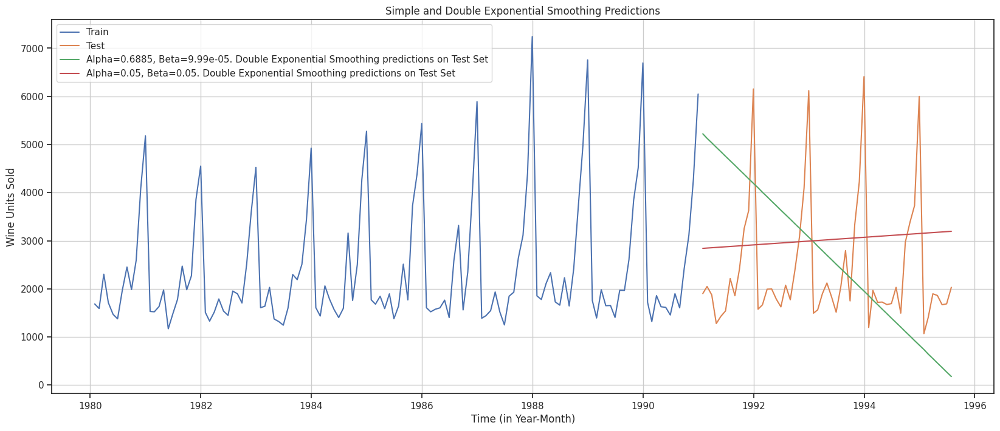

In [163]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(DES_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(DES_test['Sparkling_Wine_Sales'], label='Test')

plt.plot(DES_test['predict'], label='Alpha=0.6885, Beta=9.99e-05. Double Exponential Smoothing predictions on Test Set')
plt.plot(DES_test['predict',0.05,0.05], label='Alpha=0.05, Beta=0.05. Double Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple and Double Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [164]:
DES_Model2_rmse = float(resultsDf_6[(resultsDf_6['Alpha']==0.05) & (resultsDf_6['Beta']==0.05)]['Test RMSE'])
DES_Model2_rmse

2011880.3132099581

In [165]:
resultsDf_6 = pd.DataFrame({'Test RMSE': [DES_Model2_rmse]},index=['Alpha=0.05, Beta=0.05, Double Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_6])
resultsDf

,Test RMSE
Linear Regression,1.389135e+03
Naive Model,1.493265e+07
Simple Average,1.625834e+06
2 point TMA,6.616207e+05
4 point TMA,1.337700e+06
6 point TMA,1.648470e+06
9 point TMA,1.812465e+06
"Alpha=0.6885, Beta=9.99e-05, Double Exponential Smoothing",4.029006e+06
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",2.011880e+06


## Method 7: Triple Exponential Smoothing (Holt - Winter's Model)

##### Three parameters $\alpha$, $\beta$ and $\gamma$ are estimated in this model. Level, Trend and Seasonality are accounted for in this model.

In [166]:
TES_train = train.copy()
TES_test = test.copy()

In [167]:
model_TES = ExponentialSmoothing(TES_train['Sparkling_Wine_Sales'],trend='additive',seasonal='multiplicative',freq='M')

In [168]:
model_TES_autofit = model_TES.fit(optimized=True)

The above fit of the model is by the best parameters that Python thinks for the model. It uses a brute force method to choose the parameters.

In [169]:
model_TES_autofit.params

{'smoothing_level': np.float64(0.11119949831569428),
 'smoothing_trend': np.float64(0.049430920023313805),
 'smoothing_seasonal': np.float64(0.3620525701498937),
 'damping_trend': nan,
 'initial_level': np.float64(2356.5264391986907),
 'initial_trend': np.float64(-9.443690175376352),
 'initial_seasons': array([0.71325627, 0.68332509, 0.90537798, 0.80561841, 0.65639659,
        0.65451508, 0.88690241, 1.13423953, 0.91927727, 1.21396745,
        1.86941738, 2.3734461 ]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [170]:
## Prediction on the test data

TES_test['auto_predict'] = model_TES_autofit.forecast(steps=len(test))
TES_test.head()

,Sparkling_Wine_Sales,auto_predict
Time_Stamp,,
1991-01-31,1902,1587.685845
1991-02-28,2049,1356.590237
1991-03-31,1874,1763.121866
1991-04-30,1279,1656.379813
1991-05-31,1432,1542.186697


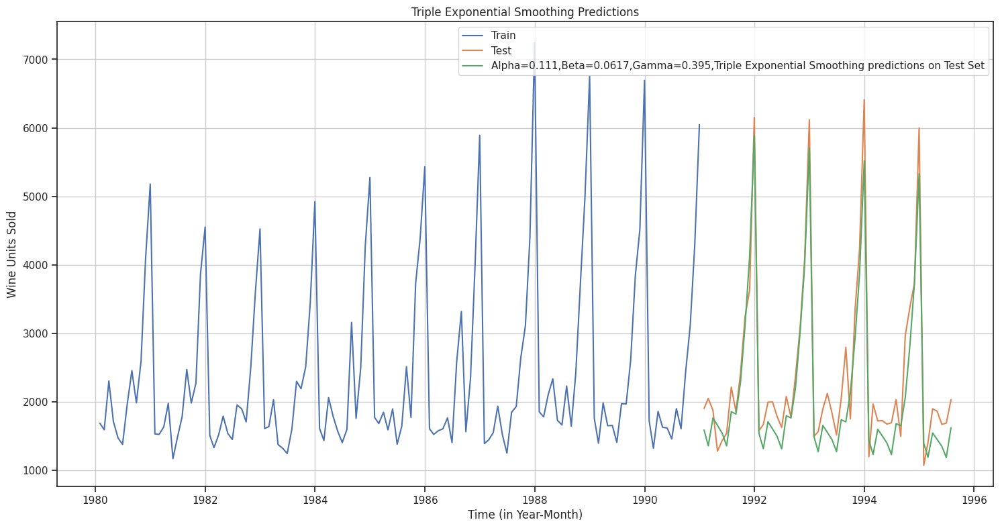

In [171]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(TES_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(TES_test['Sparkling_Wine_Sales'], label='Test')

plt.plot(TES_test['auto_predict'], label='Alpha=0.111,Beta=0.0617,Gamma=0.395,Triple Exponential Smoothing predictions on Test Set')


plt.legend(loc='best')
plt.title('Triple Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

In [173]:
## Test Data

rmse_tes_test = metrics.mean_squared_error(TES_test['Sparkling_Wine_Sales'],TES_test['auto_predict'])
print("For Alpha=0.111,Beta=0.0617,Gamma=0.395, Triple Exponential Smoothing Model forecast on the Test Data,  RMSE is %3.3f" %(rmse_tes_test))

For Alpha=0.111,Beta=0.0617,Gamma=0.395, Triple Exponential Smoothing Model forecast on the Test Data,  RMSE is 162978.718


In [174]:
resultsDf_7 = pd.DataFrame({'Test RMSE': [rmse_tes_test]}
                           ,index=['Alpha=0.111,Beta=0.0617,Gamma=0.395,Triple Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_7])
resultsDf

,Test RMSE
Linear Regression,1.389135e+03
Naive Model,1.493265e+07
Simple Average,1.625834e+06
2 point TMA,6.616207e+05
4 point TMA,1.337700e+06
6 point TMA,1.648470e+06
9 point TMA,1.812465e+06
"Alpha=0.6885, Beta=9.99e-05, Double Exponential Smoothing",4.029006e+06
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",2.011880e+06
"Alpha=0.111,Beta=0.0617,Gamma=0.395,Triple Exponential Smoothing",1.629787e+05


Calculating the performance metrics for different values of alpha, beta and gamma

In [175]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_8_2 = pd.DataFrame({'Alpha':[],'Beta':[],'Gamma':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_8_2

,Alpha,Beta,Gamma,Train RMSE,Test RMSE


In [178]:
for i in np.arange(0.1,1.05,0.05):
    for j in np.arange(0.1,1.05,0.05):
        for k in np.arange(0.1,1.05,0.05):
            model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=i,smoothing_trend=j,smoothing_seasonal=k,optimized=False,use_brute=True)
            TES_train['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
            TES_test['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=len(test))

            rmse_model8_train = metrics.mean_squared_error(TES_train['Sparkling_Wine_Sales'],TES_train['predict',i,j,k])

            rmse_model8_test = metrics.mean_squared_error(TES_test['Sparkling_Wine_Sales'],TES_test['predict',i,j,k])

            # Accumulate results in a list instead of appending to DataFrame
            results_list.append({'Alpha': i, 'Beta': j, 'Gamma': k,
                                  'Train RMSE': rmse_model8_train, 'Test RMSE': rmse_model8_test})

# Create DataFrame from the list of results after the loop
resultsDf_8_2 = pd.DataFrame(results_list)

In [179]:
resultsDf_8_2

,Alpha,Beta,Train RMSE,Test RMSE,Gamma
0,0.05,0.05,2.044973e+06,2.011880e+06,NaN
1,0.05,0.10,1.919391e+06,2.151795e+06,NaN
2,0.05,0.15,1.902089e+06,2.122970e+06,NaN
3,0.05,0.20,1.912043e+06,2.082536e+06,NaN
4,0.05,0.25,1.933233e+06,2.403810e+06,NaN
...,...,...,...,...,...
7254,1.00,1.00,1.214235e+12,7.292351e+10,0.80
7255,1.00,1.00,5.576932e+09,1.197698e+12,0.85
7256,1.00,1.00,5.922391e+09,6.111778e+10,0.90
7257,1.00,1.00,9.353720e+10,1.622860e+12,0.95


In [180]:
resultsDf_8_2.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Train RMSE,Test RMSE,Gamma
2568,0.40,0.1,147815.419530,100764.536088,0.20
2206,0.35,0.1,147808.300559,103091.328081,0.15
1522,0.25,0.2,153146.471427,105598.919694,0.15
2930,0.45,0.1,150864.894513,106182.790991,0.25
2569,0.40,0.1,146727.527183,106440.185829,0.25


In [ ]:
## Plotting on both the Training and Test data using brute force alpha, beta and gamma determination
model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=0.35,smoothing_trend=0.10,smoothing_seasonal=0.20,optimized=False,use_brute=True)
TES_train['predict',0.35,0.10,0.20] = model_TES_alpha_i_j_k.fittedvalues
TES_test['predict',0.35,0.10,0.20] = model_TES_alpha_i_j_k.forecast(steps=len(test))
rmse_tes_test_lowest = metrics.mean_squared_error(TES_test['Sparkling_Wine_Sales'],TES_test['predict',0.35,0.10,0.20],squared=False)

plt.figure(figsize=(18,9))
plt.plot(TES_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(TES_test['Sparkling_Wine_Sales'], label='Test')

#The value of alpha and beta is taken like that by python
plt.plot(TES_test['predict', 0.35,0.10,0.20], label='Alpha=0.35,Beta=0.10,Gamma=0.20,Triple Exponential Smoothing predictions on Test Set')


plt.legend(loc='best')
plt.title('Triple Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();
plt.grid();

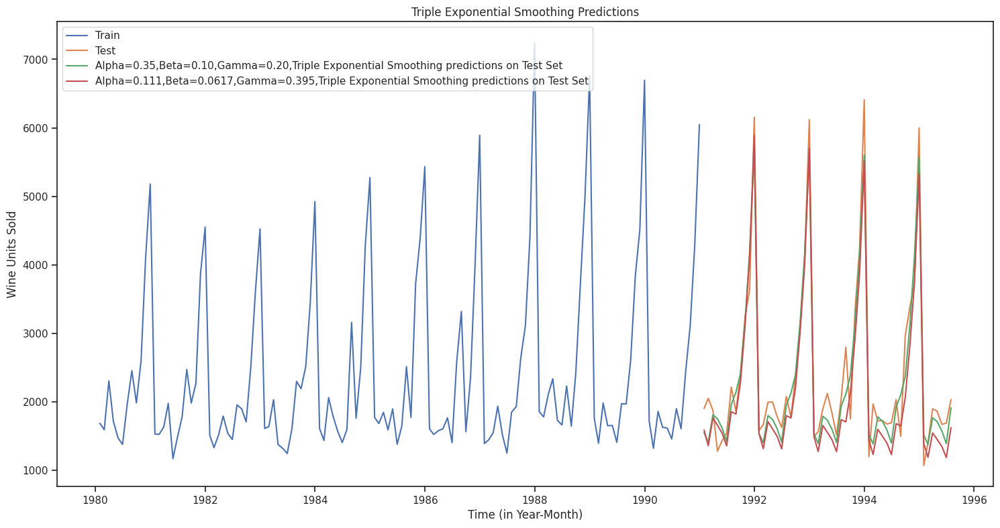

In [182]:
## Plotting on both the Training and Test data using brute force alpha, beta and gamma determination
model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=0.35,smoothing_trend=0.10,smoothing_seasonal=0.20,optimized=False,use_brute=True)
TES_train['predict',0.35,0.10,0.20] = model_TES_alpha_i_j_k.fittedvalues
TES_test['predict',0.35,0.10,0.20] = model_TES_alpha_i_j_k.forecast(steps=len(test))
rmse_tes_test_lowest = metrics.mean_squared_error(TES_test['Sparkling_Wine_Sales'],TES_test['predict',0.35,0.10,0.20])

plt.figure(figsize=(18,9))
plt.plot(TES_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(TES_test['Sparkling_Wine_Sales'], label='Test')

#The value of alpha and beta is taken like that by python
plt.plot(TES_test['predict', 0.35,0.10,0.20], label='Alpha=0.35,Beta=0.10,Gamma=0.20,Triple Exponential Smoothing predictions on Test Set')
plt.plot(TES_test['auto_predict'], label='Alpha=0.111,Beta=0.0617,Gamma=0.395,Triple Exponential Smoothing predictions on Test Set')


plt.legend(loc='best')
plt.title('Triple Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();
plt.grid();

In [183]:
resultsDf_8 = pd.DataFrame({'Test RMSE': [rmse_tes_test_lowest]}
                           ,index=['Alpha=0.35,Beta=0.10,Gamma=0.20,Triple Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_8])
resultsDf

,Test RMSE
Linear Regression,1.389135e+03
Naive Model,1.493265e+07
Simple Average,1.625834e+06
2 point TMA,6.616207e+05
4 point TMA,1.337700e+06
6 point TMA,1.648470e+06
9 point TMA,1.812465e+06
"Alpha=0.6885, Beta=9.99e-05, Double Exponential Smoothing",4.029006e+06
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",2.011880e+06
"Alpha=0.111,Beta=0.0617,Gamma=0.395,Triple Exponential Smoothing",1.629787e+05


In [184]:
print('Sorted by RMSE values on the Test Data:','\n',)
resultsDf.sort_values(by=['Test RMSE'])

Sorted by RMSE values on the Test Data: 



,Test RMSE
Linear Regression,1.389135e+03
"Alpha=0.35,Beta=0.10,Gamma=0.20,Triple Exponential Smoothing",1.095860e+05
"Alpha=0.111,Beta=0.0617,Gamma=0.395,Triple Exponential Smoothing",1.629787e+05
2 point TMA,6.616207e+05
4 point TMA,1.337700e+06
Simple Average,1.625834e+06
6 point TMA,1.648470e+06
9 point TMA,1.812465e+06
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",2.011880e+06
"Alpha=0.6885, Beta=9.99e-05, Double Exponential Smoothing",4.029006e+06


For this data, we had both trend and seasonality so by definition Triple Exponential Smoothing is supposed to work better than the Simple Exponential Smoothing as well as the Double Exponential Smoothing. However, since this was a model building exercise we had gone on to build different models on the data and have compared these model with the best RMSE value on the test data.

### We see that the best model is the Triple Exponential Smoothing with multiplicative seasonality with the parameters $\alpha$ = 0.35, $\beta$ = 0.10 and $\gamma$ = 0.20.

Text(0, 0.5, 'Wine Units Sold')

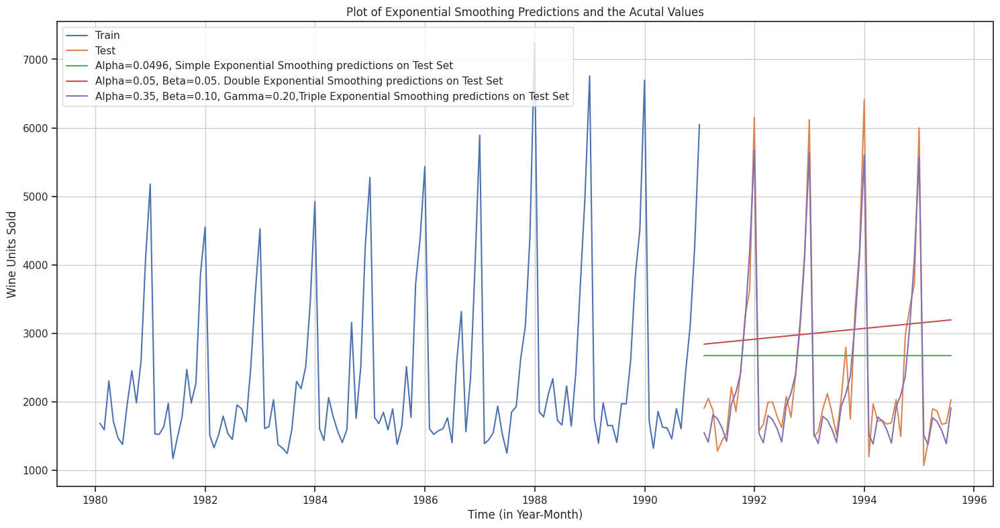

In [185]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(SES_test['predict'], label='Alpha=0.0496, Simple Exponential Smoothing predictions on Test Set')

plt.plot(DES_test['predict',0.05,0.05], label='Alpha=0.05, Beta=0.05. Double Exponential Smoothing predictions on Test Set')

plt.plot(TES_test['predict', 0.35,0.10,0.20], label='Alpha=0.35, Beta=0.10, Gamma=0.20,Triple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Exponential Smoothing Predictions and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

## 5. Check for the stationarity of the data on which the model is being built on using appropriate statistical tests and also mention the hypothesis for the statistical test. If the data is found to be non-stationary, take appropriate steps to make it stationary. Check the new data for stationarity and comment. Note: Stationarity should be checked at alpha = 0.05.

### Check for stationarity of the whole Time Series data.

The Augmented Dickey-Fuller test is an unit root test which determines whether there is a unit root and subsequently whether the series is non-stationary.

The hypothesis in a simple form for the ADF test is:
* $H_0$ : The Time Series has a unit root and is thus non-stationary.
* $H_1$ : The Time Series does not have a unit root and is thus stationary.

We would want the series to be stationary for building ARIMA models and thus we would want the p-value of this test to be less than the $\alpha$ value.

In [186]:
from statsmodels.tsa.stattools import adfuller

In [187]:
print('Results of Dicky-Fuller Test')
dftest = adfuller(df,regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

Results of Dicky-Fuller Test
DF test statistic is -1.798
DF test p-value is 0.7055958459932758
Number of lags used 12


We see that at 5% significant level the Time Series is non-stationary.Let us take one level of differencing to see whether the series becomes stationary.

In [188]:
print('Results of Dicky-Fuller Test with differencing')
dftest = adfuller(df.diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

Results of Dicky-Fuller Test with differencing
DF test statistic is -44.912
DF test p-value is 0.0
Number of lags used 10


Now, let us go ahead and plot the stationary series.

Text(0.5, 0, 'Time (in Year-Month)')

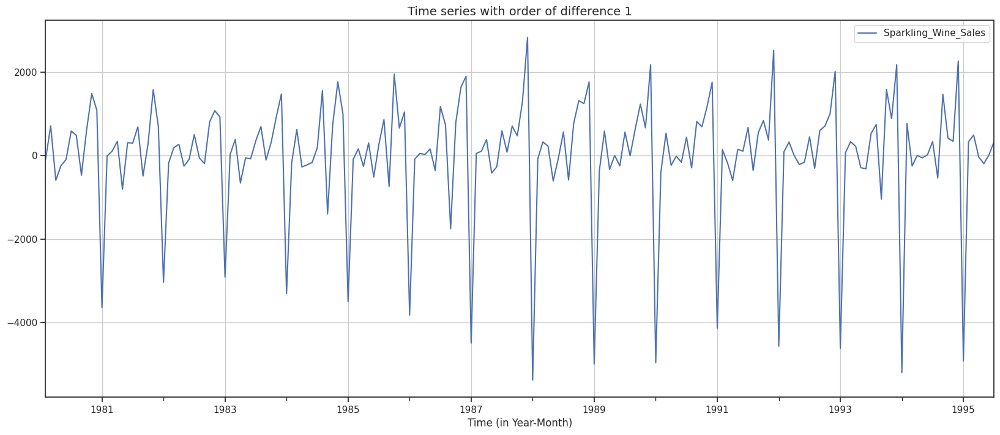

In [189]:
df.diff().dropna().plot(grid=True);
plt.title('Time series with order of difference 1', fontsize=14)
plt.xlabel('Time (in Year-Month)')

### Plot the Autocorrelation and the Partial Autocorrelation function plots on the whole data.

### ACF plot

Text(0, 0.5, 'Correlation')

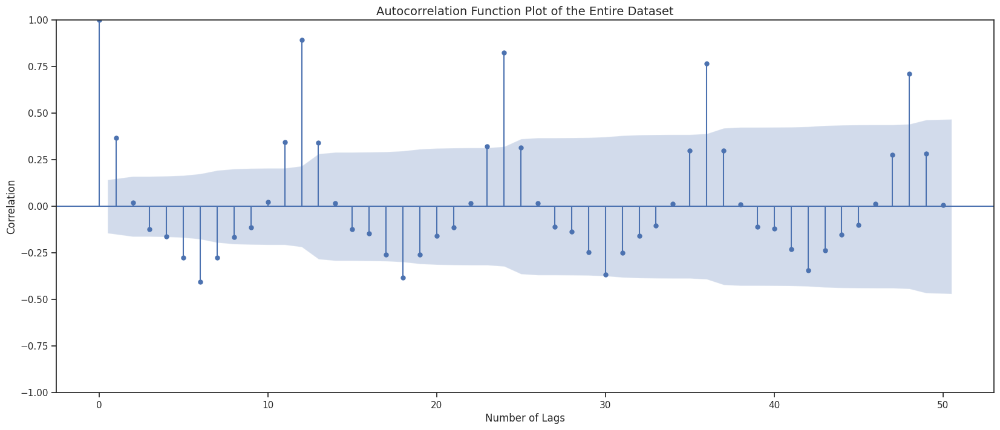

In [190]:
plot_acf(df,alpha=0.05,lags=50);
plt.title('Autocorrelation Function Plot of the Entire Dataset', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

Text(0, 0.5, 'Correlation')

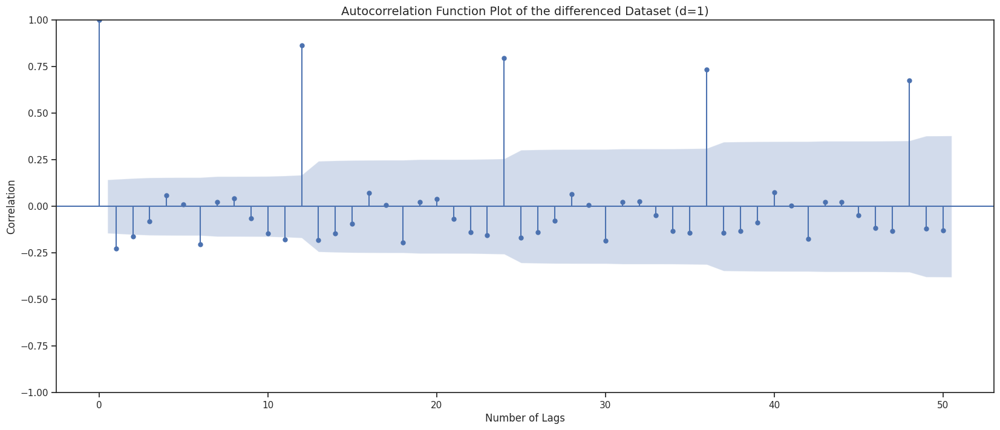

In [191]:
plot_acf(df.diff().dropna(),alpha=0.05,lags=50);
plt.title('Autocorrelation Function Plot of the differenced Dataset (d=1)', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

### PACF plot

Text(0, 0.5, 'Correlation')

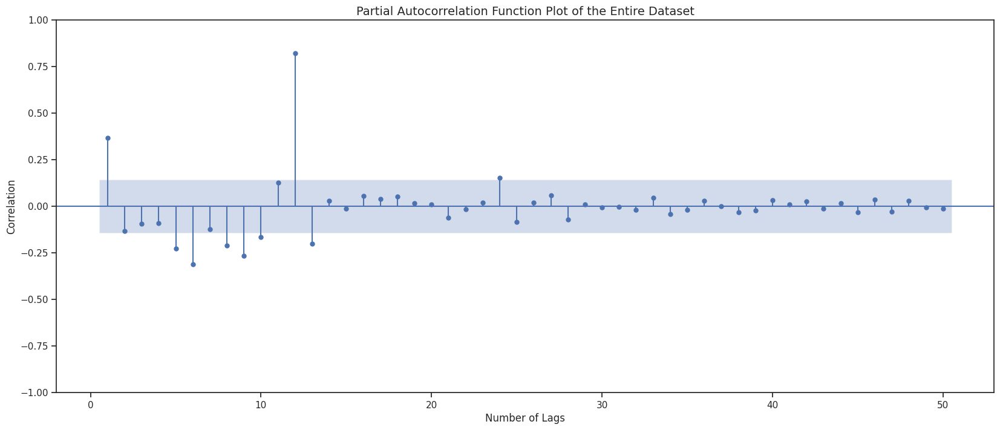

In [192]:
plot_pacf(df,zero=False,alpha=0.05,lags=50, method='ywmle');
plt.title('Partial Autocorrelation Function Plot of the Entire Dataset', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

Text(0, 0.5, 'Correlation')

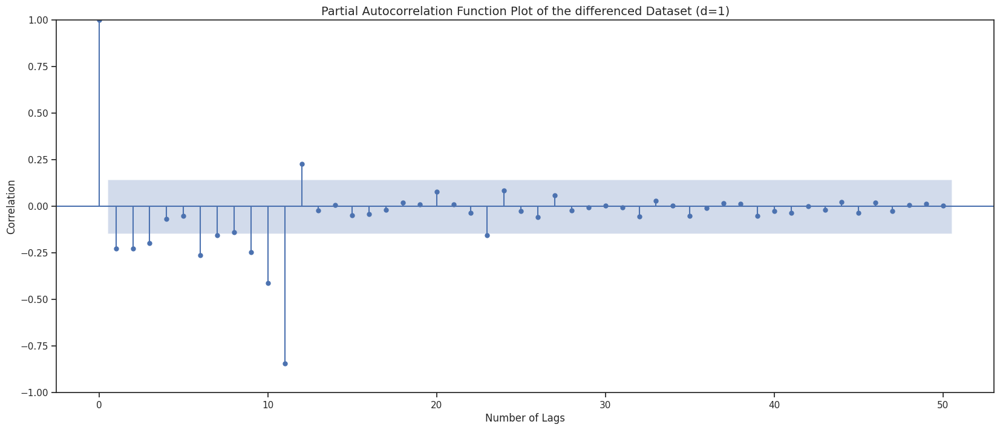

In [193]:
plot_pacf(df.diff().dropna(),alpha=0.05,lags=50,method='ywmle');
plt.title('Partial Autocorrelation Function Plot of the differenced Dataset (d=1)', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

From the above plots, we can say that there seems to be a seasonality in the data.

In [194]:
print('First few rows of Training Data')
display(train.head())
print('Last few rows of Training Data')
display(train.tail())
print('First few rows of Test Data')
display(test.head())
print('Last few rows of Test Data')
display(test.tail())

First few rows of Training Data


,Sparkling_Wine_Sales
Time_Stamp,
1980-01-31,1686
1980-02-29,1591
1980-03-31,2304
1980-04-30,1712
1980-05-31,1471


Last few rows of Training Data


,Sparkling_Wine_Sales
Time_Stamp,
1990-08-31,1605
1990-09-30,2424
1990-10-31,3116
1990-11-30,4286
1990-12-31,6047


First few rows of Test Data


,Sparkling_Wine_Sales
Time_Stamp,
1991-01-31,1902
1991-02-28,2049
1991-03-31,1874
1991-04-30,1279
1991-05-31,1432


Last few rows of Test Data


,Sparkling_Wine_Sales
Time_Stamp,
1995-03-31,1897
1995-04-30,1862
1995-05-31,1670
1995-06-30,1688
1995-07-31,2031


### Check for stationarity of the Training Data Time Series.

Let us plot the training data once.

Text(0, 0.5, 'Wine units sold')

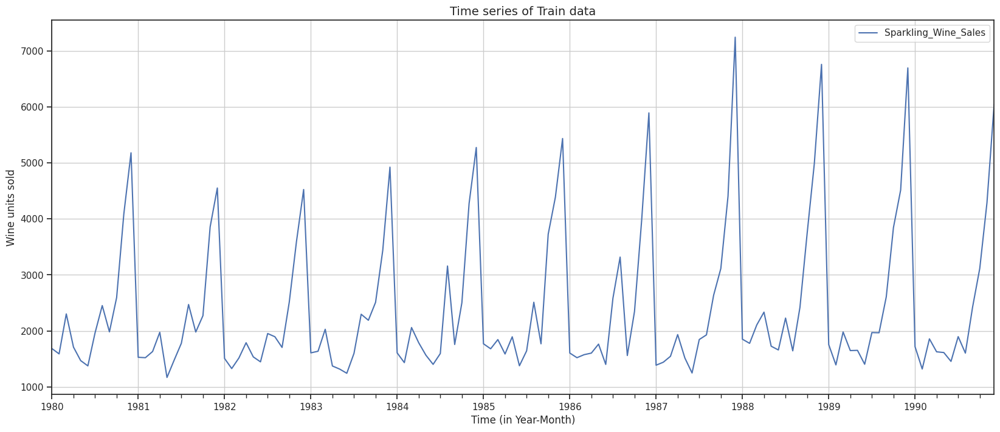

In [195]:
train.plot(grid=True);
plt.title('Time series of Train data', fontsize=14)
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine units sold')

In [196]:
print('Results of Dicky-Fuller Test on Train data')
dftest = adfuller(train,regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

Results of Dicky-Fuller Test on Train data
DF test statistic is -2.062
DF test p-value is 0.5674110388593714
Number of lags used 12


The training data is non-stationary at 95% confidence level. Let us take a first level of differencing to stationarize the Time Series.

In [198]:
print('Results of Dicky-Fuller Test on Train data with differencing')
dftest = adfuller(train.diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

Results of Dicky-Fuller Test on Train data with differencing
DF test statistic is -7.968
DF test p-value is 8.4792106555143e-11
Number of lags used 11


Now, let us go ahead and plot the differenced training data.

Text(0, 0.5, 'Wine units sold')

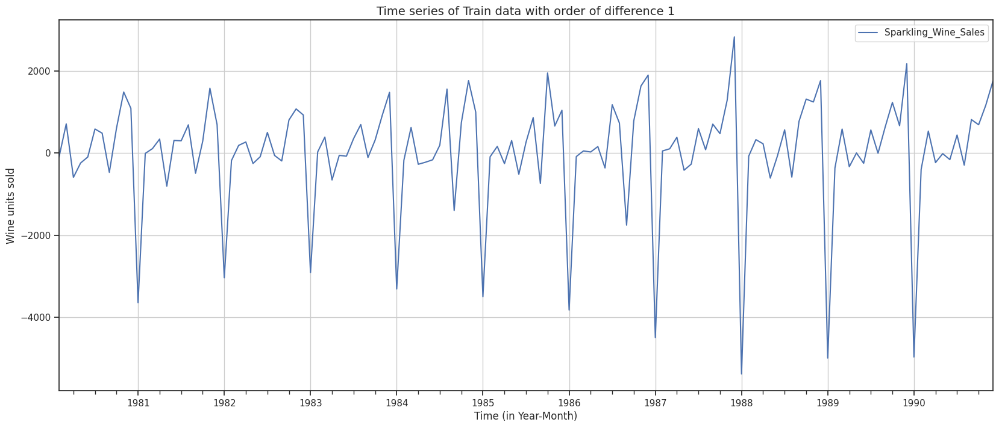

In [199]:
train.diff().dropna().plot(grid=True);
plt.title('Time series of Train data with order of difference 1', fontsize=14)
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine units sold')

In [200]:
train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 132 entries, 1980-01-31 to 1990-12-31
Data columns (total 1 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   Sparkling_Wine_Sales  132 non-null    int64
dtypes: int64(1)
memory usage: 2.1 KB


Text(0, 0.5, 'Correlation')

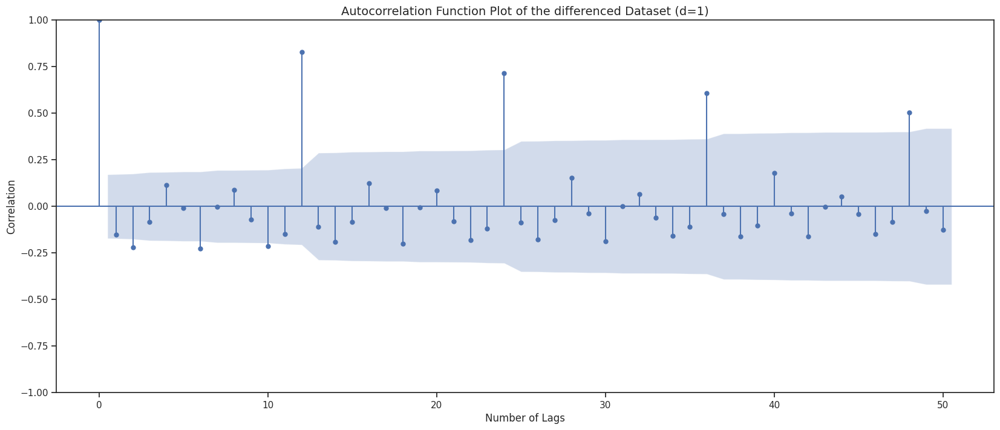

In [201]:
plot_acf(train.diff().dropna(),alpha=0.05,lags=50);
plt.title('Autocorrelation Function Plot of the differenced Dataset (d=1)', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

Text(0, 0.5, 'Correlation')

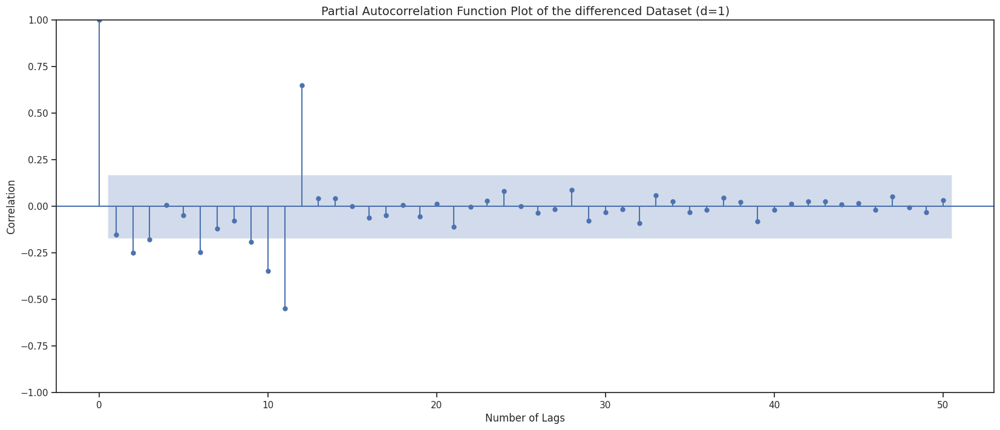

In [202]:
plot_pacf(train.diff().dropna(),alpha=0.05,lags=50,method='ywmle');
plt.title('Partial Autocorrelation Function Plot of the differenced Dataset (d=1)', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

## 6. Build an automated version of the ARIMA/SARIMA model in which the parameters are selected using the lowest Akaike Information Criteria (AIC) on the training data and evaluate this model on the test data using RMSE.

### ARIMA Model

In [203]:
## The following loop helps us in getting a combination of different parameters of p and q in the range of 0 and 5
## We have kept the value of d as 1 as we need to take a difference of the series to make it stationary.

import itertools
p = q = range(0, 5)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Examples of the parameter combinations for the Model')
for i in range(0,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Examples of the parameter combinations for the Model
Model: (0, 1, 0)
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (0, 1, 3)
Model: (0, 1, 4)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (1, 1, 3)
Model: (1, 1, 4)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)
Model: (2, 1, 3)
Model: (2, 1, 4)
Model: (3, 1, 0)
Model: (3, 1, 1)
Model: (3, 1, 2)
Model: (3, 1, 3)
Model: (3, 1, 4)
Model: (4, 1, 0)
Model: (4, 1, 1)
Model: (4, 1, 2)
Model: (4, 1, 3)
Model: (4, 1, 4)


In [204]:
# Creating an empty Dataframe with column names only
ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC

,param,AIC


In [206]:
from statsmodels.tsa.arima.model import ARIMA

for param in pdq:# running a loop within the pdq parameters defined by itertools
    ARIMA_model = ARIMA(train['Sparkling_Wine_Sales'].values,order=param).fit()#fitting the ARIMA model
    #using the parameters from the loop
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_model.aic))#printing the parameters and the AIC
    #from the fitted models
    # Instead of append, use concat to add a new row to the DataFrame
    ARIMA_AIC = pd.concat([ARIMA_AIC, pd.DataFrame([{'param':param, 'AIC': ARIMA_model.aic}])], ignore_index=True)
    #appending the AIC values and the model parameters to the previously created data frame
    #for easier understanding and sorting of the AIC values

ARIMA(0, 1, 0) - AIC:2267.6630357855465
ARIMA(0, 1, 1) - AIC:2263.0600155921866
ARIMA(0, 1, 2) - AIC:2234.408323120734
ARIMA(0, 1, 3) - AIC:2233.9948577541245
ARIMA(0, 1, 4) - AIC:2235.173736467903
ARIMA(1, 1, 0) - AIC:2266.6085393190097
ARIMA(1, 1, 1) - AIC:2235.7550946796027
ARIMA(1, 1, 2) - AIC:2234.5272004515336
ARIMA(1, 1, 3) - AIC:2235.6078158404553
ARIMA(1, 1, 4) - AIC:2227.736976993675
ARIMA(2, 1, 0) - AIC:2260.36574396809
ARIMA(2, 1, 1) - AIC:2233.777626365689
ARIMA(2, 1, 2) - AIC:2213.509213363836
ARIMA(2, 1, 3) - AIC:2232.840420804614
ARIMA(2, 1, 4) - AIC:2222.921832386571
ARIMA(3, 1, 0) - AIC:2257.72337899794
ARIMA(3, 1, 1) - AIC:2235.500537802189
ARIMA(3, 1, 2) - AIC:2231.362623820294
ARIMA(3, 1, 3) - AIC:2221.455952727806
ARIMA(3, 1, 4) - AIC:2219.755248268896
ARIMA(4, 1, 0) - AIC:2259.7418413992673
ARIMA(4, 1, 1) - AIC:2237.073057362976
ARIMA(4, 1, 2) - AIC:2233.05038330569
ARIMA(4, 1, 3) - AIC:2222.9040965361364
ARIMA(4, 1, 4) - AIC:2213.920168444504


In [207]:
## Sort the above AIC values in the ascending order to get the parameters for the minimum AIC value

ARIMA_AIC.sort_values(by='AIC',ascending=True).head()

,param,AIC
12,"(2, 1, 2)",2213.509213
24,"(4, 1, 4)",2213.920168
19,"(3, 1, 4)",2219.755248
18,"(3, 1, 3)",2221.455953
23,"(4, 1, 3)",2222.904097


In [208]:
auto_ARIMA = ARIMA(train, order=(4,1,4))

results_auto_ARIMA = auto_ARIMA.fit()

print(results_auto_ARIMA.summary())

                                SARIMAX Results                                 
Dep. Variable:     Sparkling_Wine_Sales   No. Observations:                  132
Model:                   ARIMA(4, 1, 4)   Log Likelihood               -1097.960
Date:                  Sat, 03 May 2025   AIC                           2213.920
Time:                          10:52:08   BIC                           2239.797
Sample:                      01-31-1980   HQIC                          2224.435
                           - 12-31-1990                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4654      0.117     -3.976      0.000      -0.695      -0.236
ar.L2         -0.4749      0.072     -6.637      0.000      -0.615      -0.335
ar.L3         -0.4571      0.095    

#### Diagnostics plot

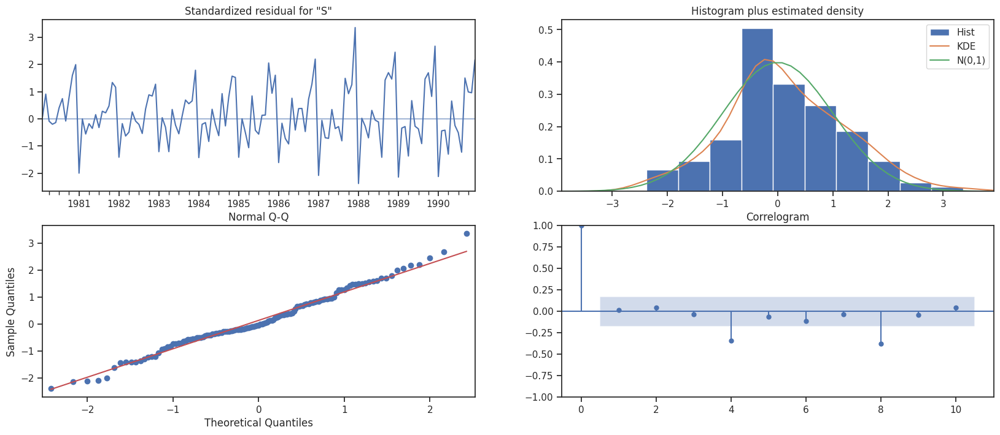

In [209]:
results_auto_ARIMA.plot_diagnostics();

#### Predict on the Test Set using this model and evaluate the model.

In [210]:
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(test))

In [211]:
predicted_auto_ARIMA

,predicted_mean
1991-01-31,3415.712611
1991-02-28,2710.539326
1991-03-31,3087.420295
1991-04-30,3385.965698
1991-05-31,2010.017385
1991-06-30,1966.421289
1991-07-31,2701.375730
1991-08-31,3165.625698
1991-09-30,1898.630992
1991-10-31,1909.009933


Text(0, 0.5, 'Wine Units Sold')

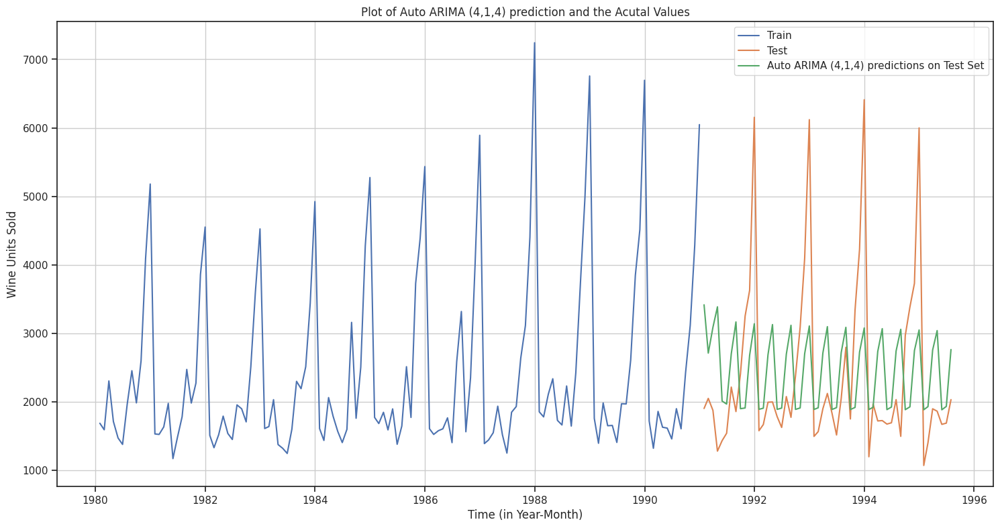

In [212]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(predicted_auto_ARIMA, label='Auto ARIMA (4,1,4) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Auto ARIMA (4,1,4) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [213]:
## Mean Absolute Percentage Error (MAPE) - Function Definition

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean((np.abs(y_true-y_pred))/(y_true))*100

## Importing the mean_squared_error function from sklearn to calculate the RMSE

from sklearn.metrics import mean_squared_error

In [215]:
rmse = mean_squared_error(test['Sparkling_Wine_Sales'],predicted_auto_ARIMA)
mape = mean_absolute_percentage_error(test['Sparkling_Wine_Sales'],predicted_auto_ARIMA)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 1472744.4442627183 
MAPE: 39.75615155943655


In [216]:
resultsDf_2 = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Auto ARIMA (4,1,4)'])

resultsDf_2

,Test RMSE,MAPE
"Auto ARIMA (4,1,4)",1.472744e+06,39.756152


### SARIMA Model

Let us look at the ACF plot once more to understand the seasonal parameter for the SARIMA model.

Text(0, 0.5, 'Correlation')

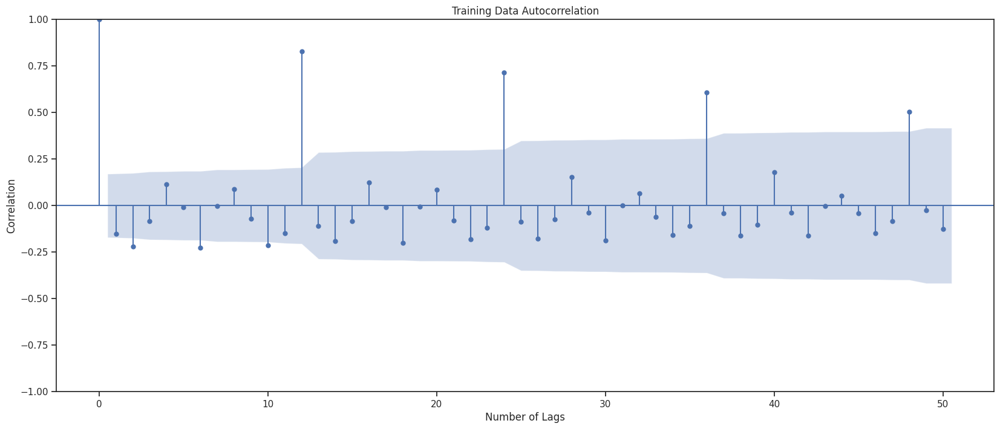

In [217]:
plot_acf(train.diff(),title='Training Data Autocorrelation',missing='drop',lags=50);
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

We can see that there is a seasonality.

In [218]:
import itertools
p = q = range(0, 4)
d= range(1,2)
D = range(0,1)
pdq = list(itertools.product(p, d, q))
PDQ = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of the parameter combinations for the Model are')
for i in range(0,len(pdq)):
    print('Model: {}{}'.format(pdq[i], PDQ[i]))

Examples of the parameter combinations for the Model are
Model: (0, 1, 0)(0, 0, 0, 12)
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (0, 1, 3)(0, 0, 3, 12)
Model: (1, 1, 0)(1, 0, 0, 12)
Model: (1, 1, 1)(1, 0, 1, 12)
Model: (1, 1, 2)(1, 0, 2, 12)
Model: (1, 1, 3)(1, 0, 3, 12)
Model: (2, 1, 0)(2, 0, 0, 12)
Model: (2, 1, 1)(2, 0, 1, 12)
Model: (2, 1, 2)(2, 0, 2, 12)
Model: (2, 1, 3)(2, 0, 3, 12)
Model: (3, 1, 0)(3, 0, 0, 12)
Model: (3, 1, 1)(3, 0, 1, 12)
Model: (3, 1, 2)(3, 0, 2, 12)
Model: (3, 1, 3)(3, 0, 3, 12)


In [219]:
SARIMA_AIC = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC

,param,seasonal,AIC


In [222]:
import statsmodels.api as sm
import pandas as pd

SARIMA_AIC = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

for param in pdq:
    for param_seasonal in PDQ:
        SARIMA_model = sm.tsa.statespace.SARIMAX(train['Sparkling_Wine_Sales'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

        results_SARIMA = SARIMA_model.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA.aic))

        # Use pd.concat instead of append
        SARIMA_AIC = pd.concat([SARIMA_AIC, pd.DataFrame([{'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}])], ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:2251.3597196862966
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:1956.2614616844508
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:1723.15336402372
SARIMA(0, 1, 0)x(0, 0, 3, 12) - AIC:4047.750993647416
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:1837.4366022456677
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:1806.9905301388262
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:1633.2108735792046
SARIMA(0, 1, 0)x(1, 0, 3, 12) - AIC:4198.7747798418895
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:1648.3776153470858
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:1647.2054158610692
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:1630.9898053920801
SARIMA(0, 1, 0)x(2, 0, 3, 12) - AIC:3534.298287309097
SARIMA(0, 1, 0)x(3, 0, 0, 12) - AIC:1467.4574095308406
SARIMA(0, 1, 0)x(3, 0, 1, 12) - AIC:1469.187105262579
SARIMA(0, 1, 0)x(3, 0, 2, 12) - AIC:1471.0594530065785
SARIMA(0, 1, 0)x(3, 0, 3, 12) - AIC:1660.0206717712902
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:2230.162907850585
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:1923.7688649566492
SARIMA(0, 1, 1)x

In [223]:
SARIMA_AIC.sort_values(by=['AIC']).head(20)

,param,seasonal,AIC
83,"(1, 1, 1)","(0, 0, 3, 12)",12.000000
115,"(1, 1, 3)","(0, 0, 3, 12)",16.000000
163,"(2, 1, 2)","(0, 0, 3, 12)",16.000000
179,"(2, 1, 3)","(0, 0, 3, 12)",743.090105
220,"(3, 1, 1)","(3, 0, 0, 12)",1387.788332
237,"(3, 1, 2)","(3, 0, 1, 12)",1388.602612
221,"(3, 1, 1)","(3, 0, 1, 12)",1388.681484
222,"(3, 1, 1)","(3, 0, 2, 12)",1389.195900
238,"(3, 1, 2)","(3, 0, 2, 12)",1389.714494
252,"(3, 1, 3)","(3, 0, 0, 12)",1391.478971


### The model is throwing errors with values before (3,1,2)(3,0,1,12). It is therefore due to this reason, we have decided on this parameter combination.

In [224]:
SARIMA_AIC.sort_values(by=['AIC']).iloc[12:,:]

,param,seasonal,AIC
204,"(3, 1, 0)","(3, 0, 0, 12)",1396.867862
205,"(3, 1, 0)","(3, 0, 1, 12)",1397.677471
206,"(3, 1, 0)","(3, 0, 2, 12)",1398.307469
188,"(2, 1, 3)","(3, 0, 0, 12)",1399.789878
190,"(2, 1, 3)","(3, 0, 2, 12)",1401.298373
...,...,...,...
99,"(1, 1, 2)","(0, 0, 3, 12)",5512.784425
87,"(1, 1, 1)","(1, 0, 3, 12)",5573.375015
35,"(0, 1, 2)","(0, 0, 3, 12)",6284.123732
51,"(0, 1, 3)","(0, 0, 3, 12)",6636.765802


In [225]:
import statsmodels.api as sm

auto_SARIMA = sm.tsa.statespace.SARIMAX(train['Sparkling_Wine_Sales'],
                                order=(3, 1, 2),
                                seasonal_order=(3, 0, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA = auto_SARIMA.fit(maxiter=1000)
print(results_auto_SARIMA.summary())

                                      SARIMAX Results                                       
Dep. Variable:                 Sparkling_Wine_Sales   No. Observations:                  132
Model:             SARIMAX(3, 1, 2)x(3, 0, [1], 12)   Log Likelihood                -684.301
Date:                              Sat, 03 May 2025   AIC                           1388.603
Time:                                      11:09:24   BIC                           1413.820
Sample:                                  01-31-1980   HQIC                          1398.781
                                       - 12-31-1990                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5433      0.416     -1.307      0.191      -1.358       0.272
ar.L2         -0.00

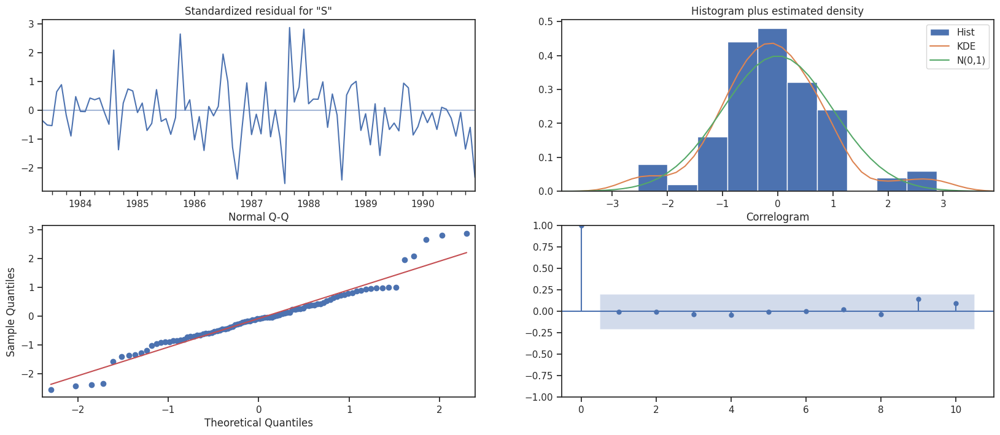

In [226]:
results_auto_SARIMA.plot_diagnostics();
plt.show()

#### Predict on the Test Set using this model and evaluate the model.

In [227]:
predicted_auto_SARIMA = results_auto_SARIMA.get_forecast(steps=len(test))

In [228]:
predicted_auto_SARIMA.predicted_mean

,predicted_mean
1991-01-31,1320.312694
1991-02-28,1298.551066
1991-03-31,1604.507693
1991-04-30,1625.979615
1991-05-31,1397.897549
1991-06-30,1237.717491
1991-07-31,1785.807696
1991-08-31,1510.196293
1991-09-30,2285.943126
1991-10-31,3290.897666


Text(0, 0.5, 'Wine Units Sold')

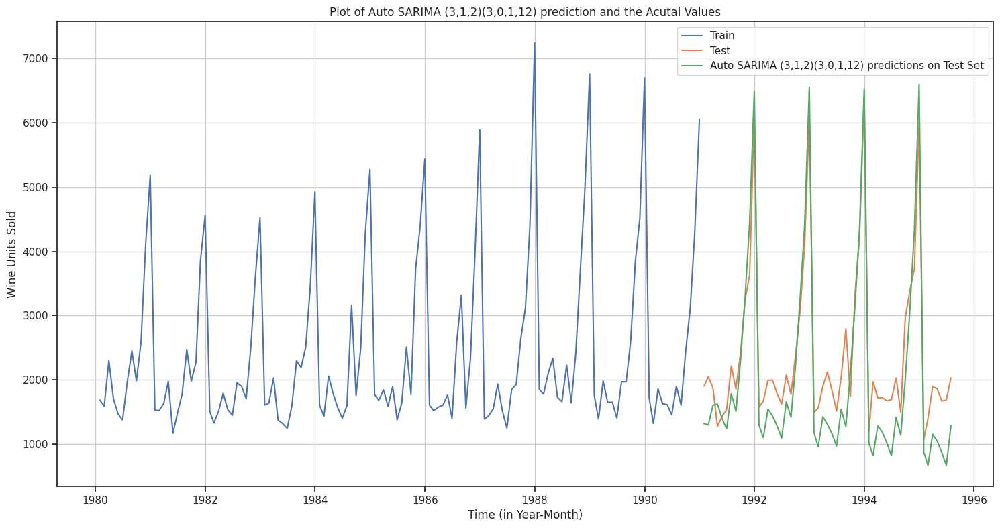

In [229]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(predicted_auto_SARIMA.predicted_mean, label='Auto SARIMA (3,1,2)(3,0,1,12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Auto SARIMA (3,1,2)(3,0,1,12) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [230]:
predicted_auto_SARIMA.summary_frame(alpha=0.05).head()

Sparkling_Wine_Sales,mean,mean_se,mean_ci_lower,mean_ci_upper
1991-01-31,1320.312694,407.837961,520.964979,2119.660409
1991-02-28,1298.551066,421.138234,473.135296,2123.966837
1991-03-31,1604.507693,421.138649,779.091109,2429.924277
1991-04-30,1625.979615,429.634063,783.912324,2468.046906
1991-05-31,1397.897549,430.101245,554.914599,2240.880500


In [232]:
rmse = mean_squared_error(test['Sparkling_Wine_Sales'],predicted_auto_SARIMA.predicted_mean)
mape = mean_absolute_percentage_error(test['Sparkling_Wine_Sales'],predicted_auto_SARIMA.predicted_mean)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 336424.589379628 
MAPE: 25.057898047024


In [233]:
temp_resultsDf = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Auto SARIMA (3,1,2)(3,0,1,12)'])


resultsDf_2 = pd.concat([resultsDf_2,temp_resultsDf])

resultsDf_2

,Test RMSE,MAPE
"Auto ARIMA (4,1,4)",1.472744e+06,39.756152
"Auto SARIMA (3,1,2)(3,0,1,12)",3.364246e+05,25.057898


## 7. Build ARIMA/SARIMA models based on the cut-off points of ACF and PACF on the training data and evaluate this model on the test data using RMSE.

## Manual ARIMA Model

Let us look at the ACF and the PACF plots once more.

### ACF plot

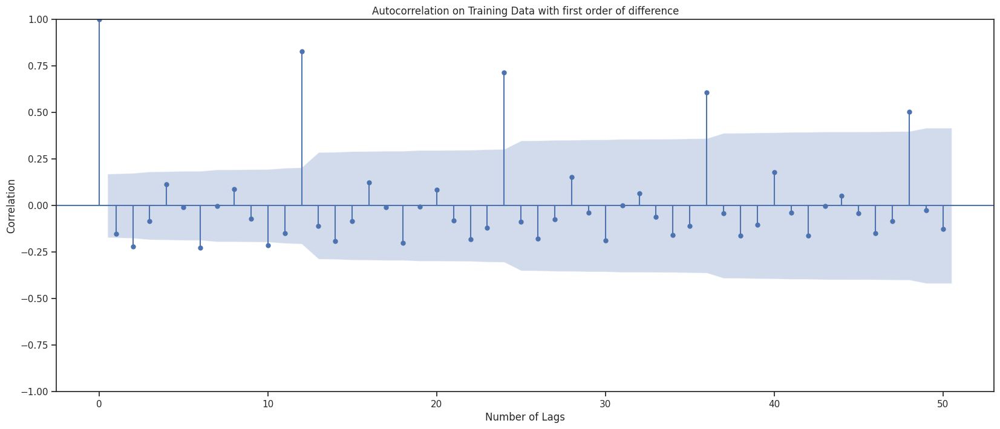

In [234]:
plot_acf(train.diff(),title='Autocorrelation on Training Data with first order of difference',missing='drop',lags=50)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

### PACF plot

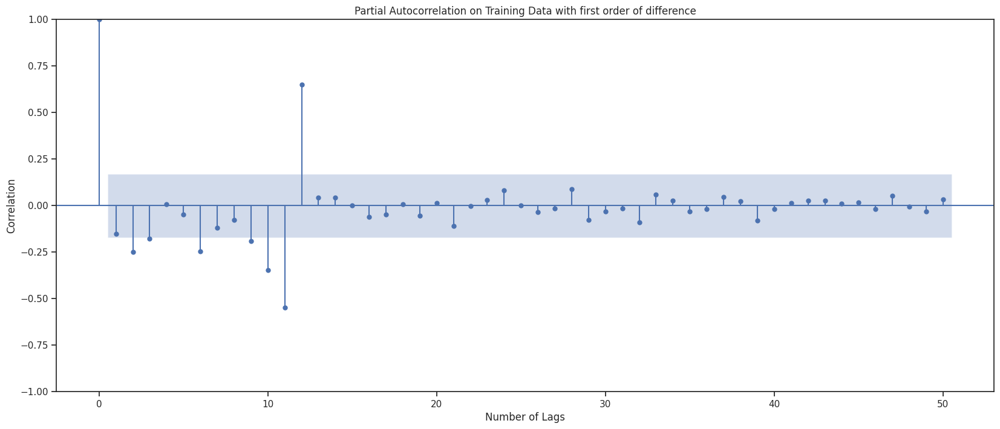

In [235]:
plot_pacf(train.diff().dropna(),title='Partial Autocorrelation on Training Data with first order of difference',lags=50,method='ywmle')
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

Here, we have taken alpha=0.05.

* The Auto-Regressive parameter in an ARIMA model is 'p' which comes from the significant lag after which the PACF plot cuts-off to 0.
* The Moving-Average parameter in an ARIMA model is 'q' which comes from the significant lag after which the ACF plot cuts-off to 0.

By looking at the above plots, we can see that first lag cuts off in both plots and hence we start from lags after lag 0. Therefore we have taken the value of p and q to be 2 and 1 respectively.

We would also build a model with p=0,q=0

In [236]:
manual_ARIMA = ARIMA(train['Sparkling_Wine_Sales'], order=(0,1,0),freq='M')

results_manual_ARIMA = manual_ARIMA.fit()

print(results_manual_ARIMA.summary())

                                SARIMAX Results                                 
Dep. Variable:     Sparkling_Wine_Sales   No. Observations:                  132
Model:                   ARIMA(0, 1, 0)   Log Likelihood               -1132.832
Date:                  Sat, 03 May 2025   AIC                           2267.663
Time:                          11:12:07   BIC                           2270.538
Sample:                      01-31-1980   HQIC                          2268.831
                           - 12-31-1990                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.885e+06   1.29e+05     14.658      0.000    1.63e+06    2.14e+06
Ljung-Box (L1) (Q):                   3.07   Jarque-Bera (JB):               198.83
Prob(Q):                       

Let us analyse the residuals from the various diagnostics plot.

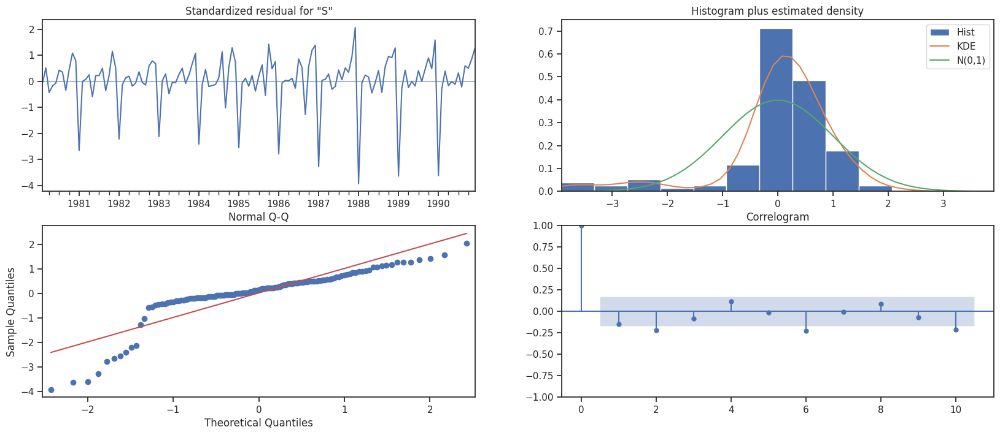

In [237]:
results_manual_ARIMA.plot_diagnostics();

#### Predict on the Test Set using this model and evaluate the model.

In [238]:
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(test))

In [239]:
predicted_manual_ARIMA

,predicted_mean
1991-01-31,6047.0
1991-02-28,6047.0
1991-03-31,6047.0
1991-04-30,6047.0
1991-05-31,6047.0
1991-06-30,6047.0
1991-07-31,6047.0
1991-08-31,6047.0
1991-09-30,6047.0
1991-10-31,6047.0


Text(0, 0.5, 'Wine Units Sold')

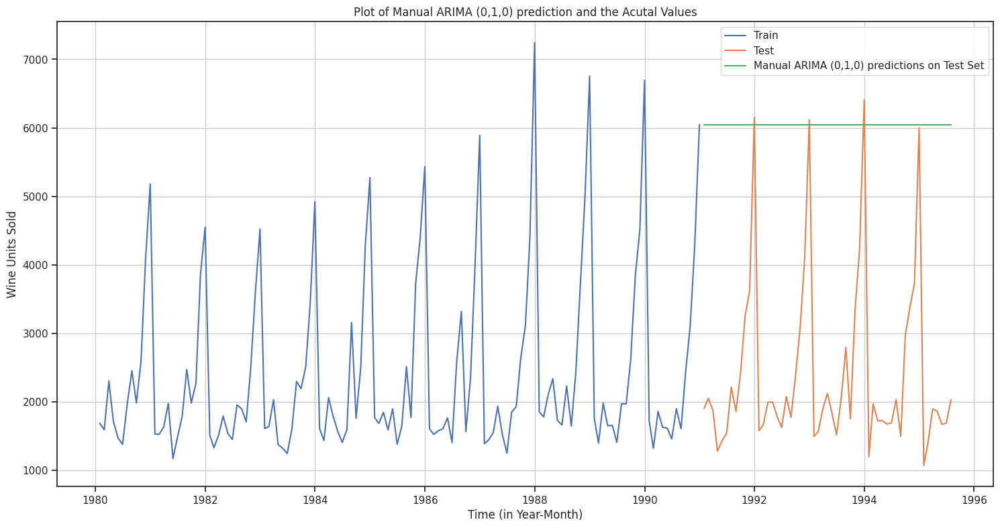

In [240]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(predicted_manual_ARIMA, label='Manual ARIMA (0,1,0) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Manual ARIMA (0,1,0) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [242]:
rmse = mean_squared_error(test['Sparkling_Wine_Sales'],predicted_manual_ARIMA)
mape = mean_absolute_percentage_error(test['Sparkling_Wine_Sales'],predicted_manual_ARIMA)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 14932654.909090908 
MAPE: 201.3276495035274


In [243]:
manual_ARIMA = ARIMA(train['Sparkling_Wine_Sales'], order=(2,1,1),freq='M')

results_manual_ARIMA = manual_ARIMA.fit()

print(results_manual_ARIMA.summary())

                                SARIMAX Results                                 
Dep. Variable:     Sparkling_Wine_Sales   No. Observations:                  132
Model:                   ARIMA(2, 1, 1)   Log Likelihood               -1112.889
Date:                  Sat, 03 May 2025   AIC                           2233.778
Time:                          11:12:45   BIC                           2245.278
Sample:                      01-31-1980   HQIC                          2238.451
                           - 12-31-1990                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5194      0.119      4.359      0.000       0.286       0.753
ar.L2         -0.1782      0.196     -0.908      0.364      -0.563       0.206
ma.L1         -0.9993      0.667    

Let us analyse the residuals from the various diagnostics plot.

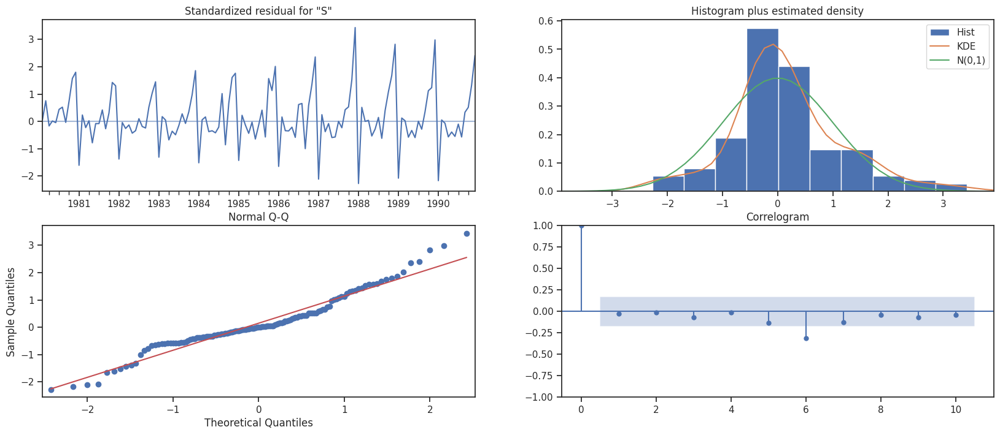

In [244]:
results_manual_ARIMA.plot_diagnostics();

#### Predict on the Test Set using this model and evaluate the model.

In [245]:
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(test))

In [246]:
predicted_manual_ARIMA

,predicted_mean
1991-01-31,3957.667329
1991-02-28,2558.511572
1991-03-31,2204.093571
1991-04-30,2269.356373
1991-05-31,2366.423266
1991-06-30,2405.213066
1991-07-31,2408.062614
1991-08-31,2402.629489
1991-09-30,2399.299398
1991-10-31,2398.537906


Text(0, 0.5, 'Wine Units Sold')

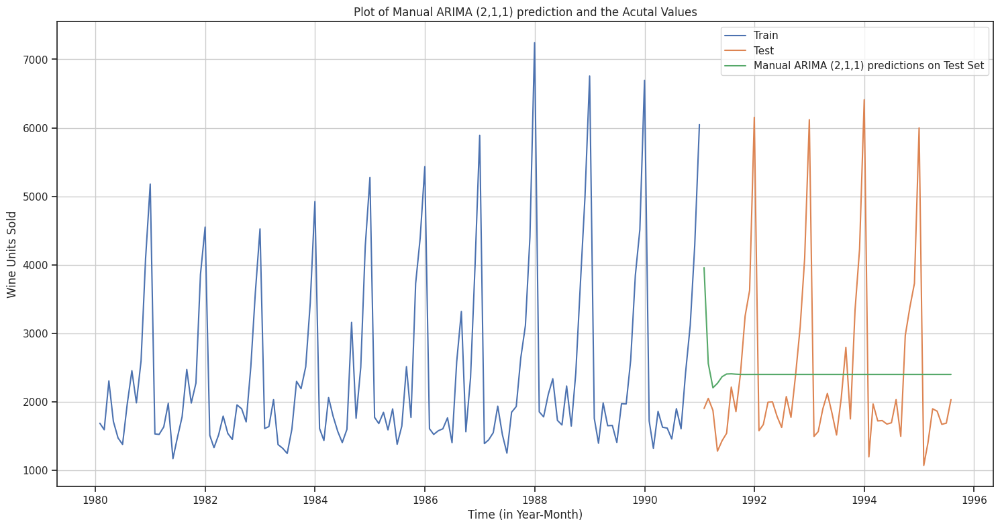

In [247]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(predicted_manual_ARIMA, label='Manual ARIMA (2,1,1) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Manual ARIMA (2,1,1) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [249]:
rmse = mean_squared_error(test['Sparkling_Wine_Sales'],predicted_manual_ARIMA)
mape = mean_absolute_percentage_error(test['Sparkling_Wine_Sales'],predicted_manual_ARIMA)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 1691876.1243400597 
MAPE: 40.22566818394865


In [250]:
temp_resultsDf = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Manual ARIMA (2,1,1)'])


resultsDf_2 = pd.concat([resultsDf_2,temp_resultsDf])

resultsDf_2

,Test RMSE,MAPE
"Auto ARIMA (4,1,4)",1.472744e+06,39.756152
"Auto SARIMA (3,1,2)(3,0,1,12)",3.364246e+05,25.057898
"Manual ARIMA (2,1,1)",1.691876e+06,40.225668


## Manual SARIMA Model

Let us look at the ACF and the PACF plots once more.

### ACF plot

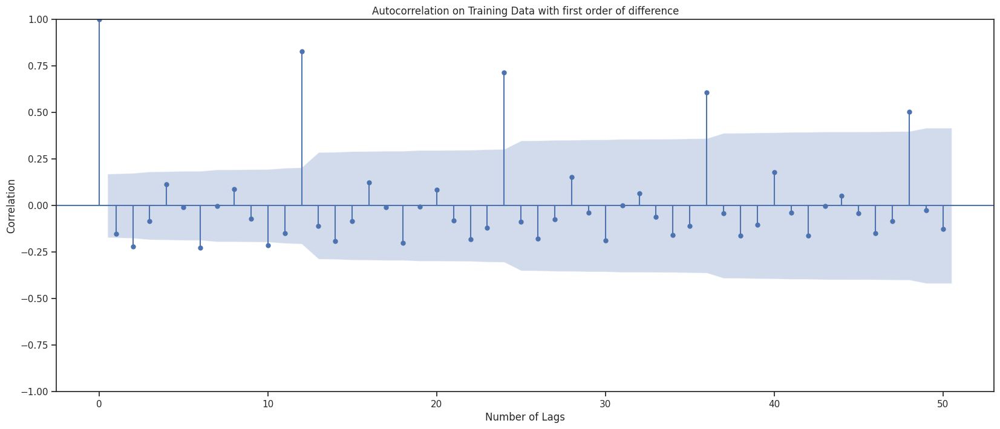

In [251]:
plot_acf(train.diff(),title='Autocorrelation on Training Data with first order of difference',missing='drop',lags=50)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

### PACF plot

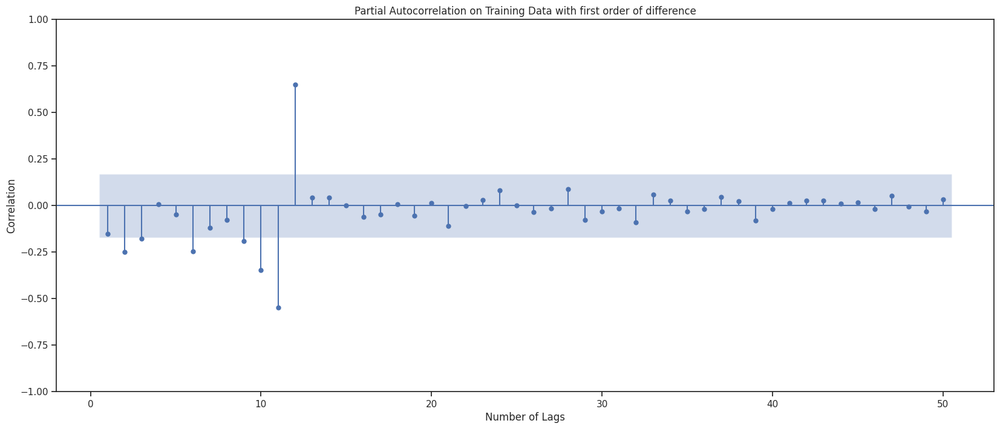

In [252]:
plot_pacf(train.diff().dropna(),title='Partial Autocorrelation on Training Data with first order of difference',lags=50,zero=False,method='ywmle')
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

We see that our ACF plot at the seasonal interval (12) does not taper off quickly. So, we go ahead and take a seasonal differencing of the original series. Before that let us look at the original series.

Text(0, 0.5, 'Units Sold')

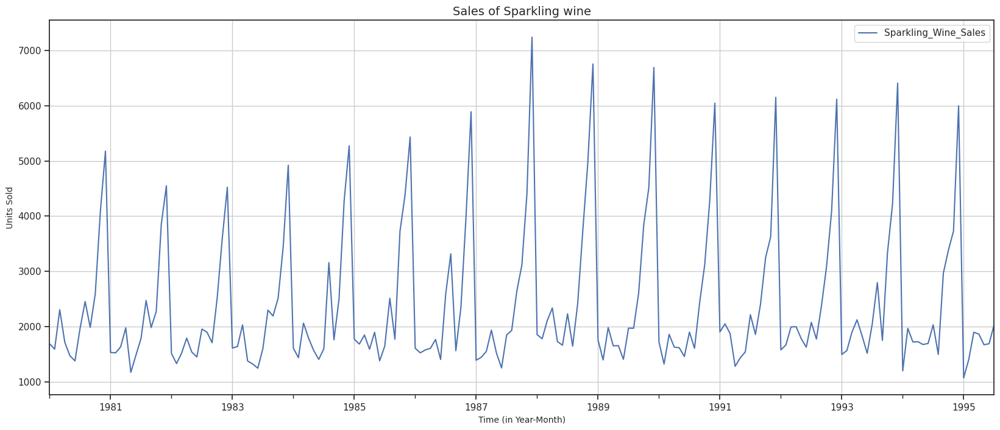

In [253]:
#Original Time Series
rcParams['figure.figsize'] = 20,8
df.plot(grid=True);
plt.title('Sales of Sparkling wine', fontsize=14)
plt.xlabel('Time (in Year-Month)',fontsize=10)
plt.ylabel('Units Sold',fontsize=10)

Text(0, 0.5, 'Wine Units Sold')

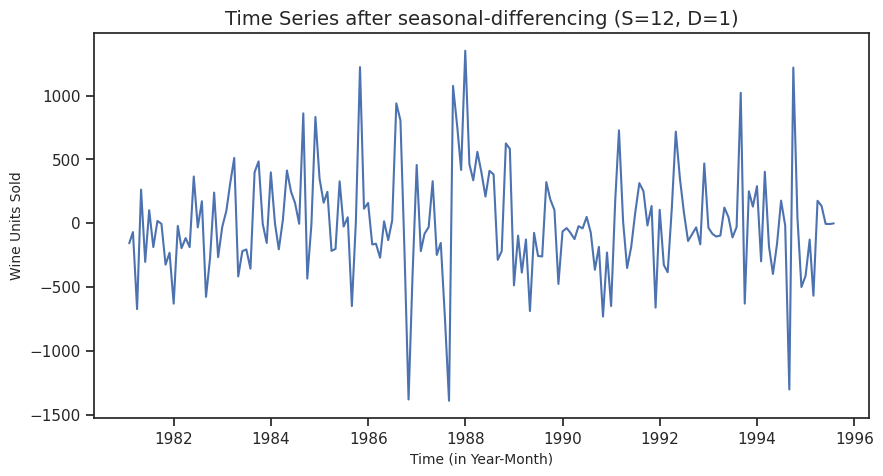

In [254]:
#Time series with seasonal differencing (S=12, D=1)
plt.figure(figsize=(10,5))
plt.plot(df['Sparkling_Wine_Sales'].diff(12).dropna())
plt.title ('Time Series after seasonal-differencing (S=12, D=1)',fontsize=14);
plt.xlabel('Time (in Year-Month)',fontsize=10)
plt.ylabel('Wine Units Sold',fontsize=10)

Text(0, 0.5, 'Wine Units Sold')

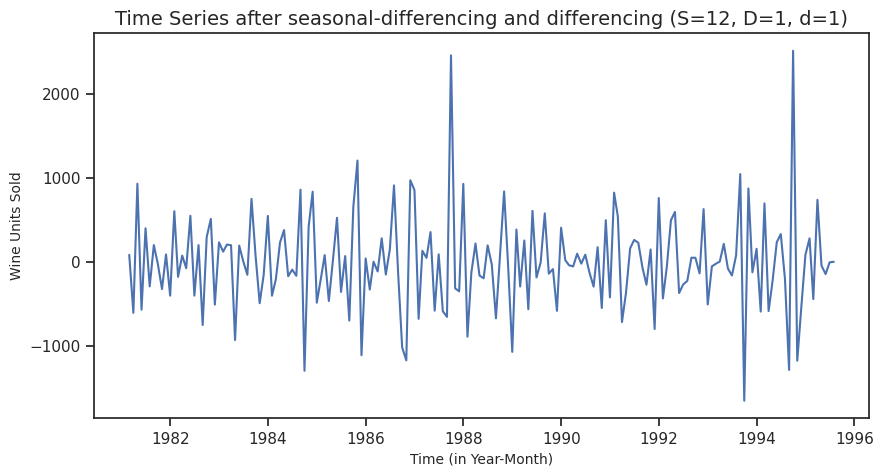

In [255]:
#Time series with seasonal differencing followed by normal differencing (S=12, D=1, d=1)
plt.figure(figsize=(10,5))
plt.plot((df['Sparkling_Wine_Sales'].diff(12).dropna()).diff().dropna())
plt.title ('Time Series after seasonal-differencing and differencing (S=12, D=1, d=1)',fontsize=14);
plt.xlabel('Time (in Year-Month)',fontsize=10)
plt.ylabel('Wine Units Sold',fontsize=10)

In [256]:
#Testing stationarity
dftest = adfuller((df['Sparkling_Wine_Sales'].diff(12).dropna()).diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

DF test statistic is -5.121
DF test p-value is 0.0001231630491568021
Number of lags used 11


Let us look at the ACF and the PACF plots once more with seasonal and normal differencing on train data

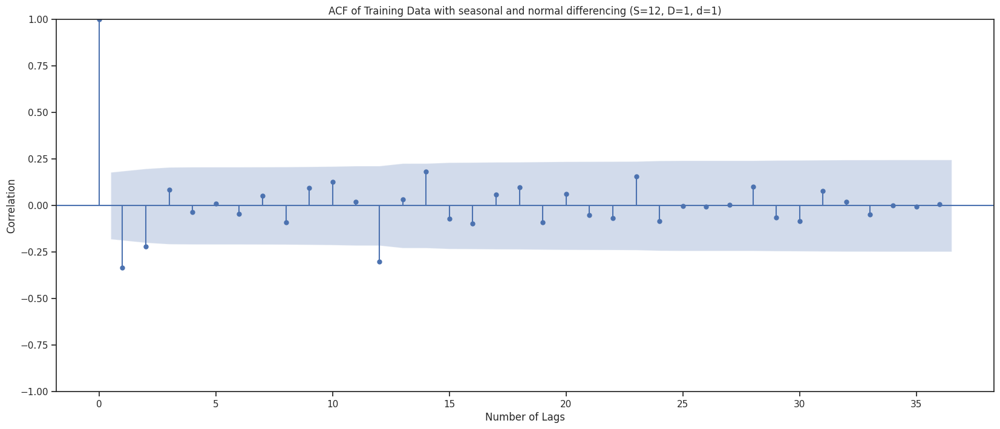

In [257]:
plot_acf((train['Sparkling_Wine_Sales'].diff(12).dropna()).diff().dropna(),title='ACF of Training Data with seasonal and normal differencing (S=12, D=1, d=1)',lags=36)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

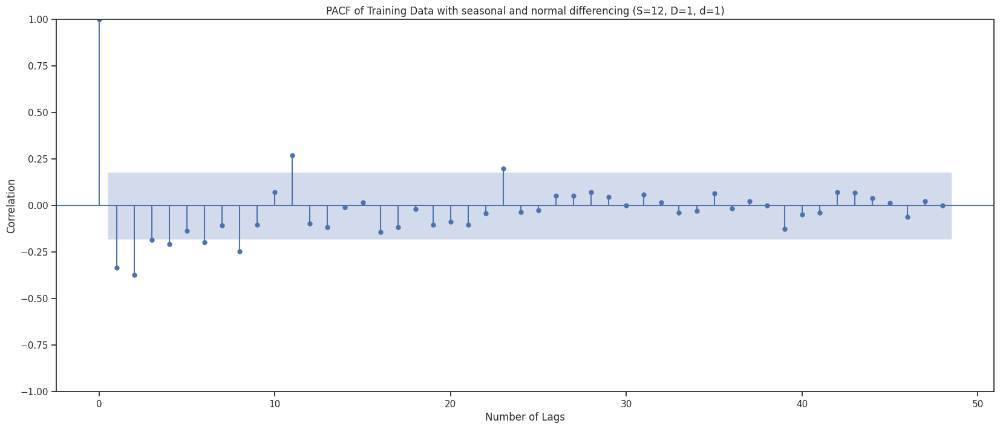

In [258]:
plot_pacf((train['Sparkling_Wine_Sales'].diff(12).dropna()).diff().dropna(),title='PACF of Training Data with seasonal and normal differencing (S=12, D=1, d=1)',lags=48)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

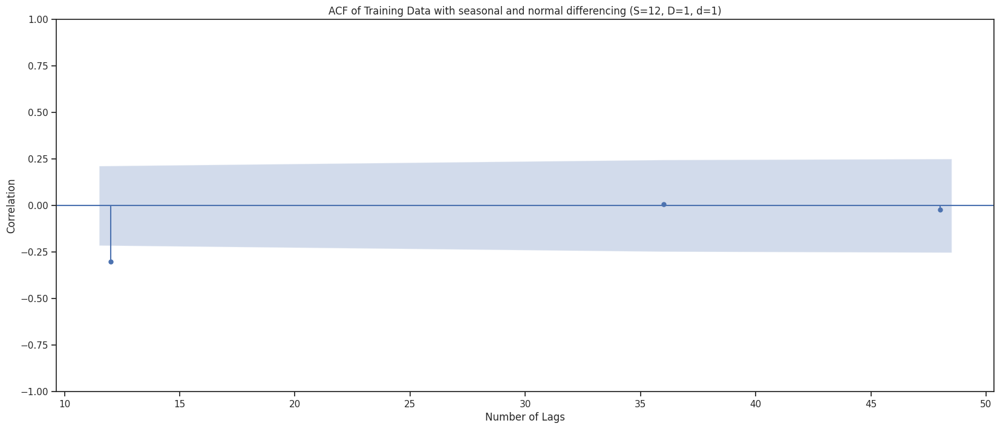

In [259]:
plot_acf((train['Sparkling_Wine_Sales'].diff(12).dropna()).diff().dropna(),title='ACF of Training Data with seasonal and normal differencing (S=12, D=1, d=1)',lags=[12.24,36,48])
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

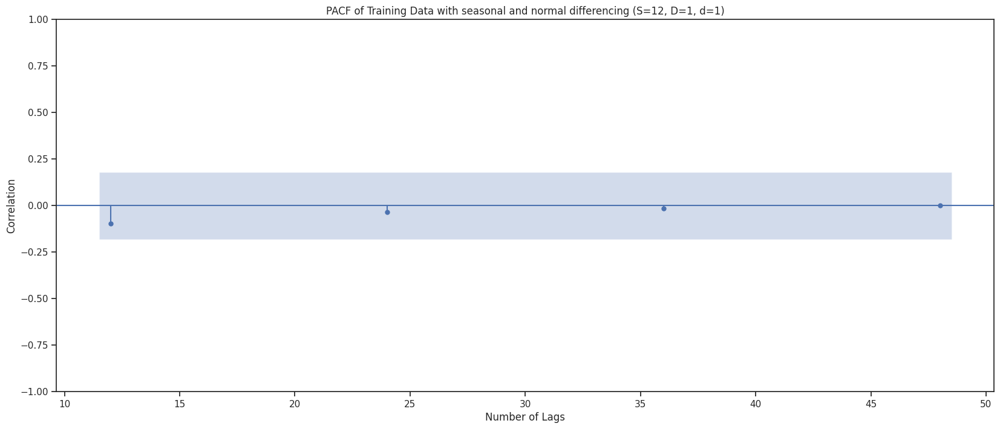

In [260]:
plot_pacf((train['Sparkling_Wine_Sales'].diff(12).dropna()).diff().dropna(),title='PACF of Training Data with seasonal and normal differencing (S=12, D=1, d=1)',lags=[12,24,36,48])
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

- Here we have taken alpha = 0.05 and seasonal period as 12.


- From the PACF plot it can be seen that till lag 4 is significant before cut-off, so AR term ‘p = 4’ is chosen. At seasonal lag of 12, it cuts off, so keep seasonal AR ‘P = 0’.


- From ACF plot, lag 1 and 2 are significant before it cuts off, so lets keep MA term ‘q = 2’ and at seasonal lag of 12, a significant lag is apparent and no seaonal lags are apparent at lags 24, 36 or afterwards, so lets keep ‘Q = 1'.


- The final selected terms for SARIMA model is (4, 1, 2)x(0, 1, 1, 12), as inferred from the ACF and PACF plots.

In [262]:
import statsmodels.api as sm

manual_SARIMA = sm.tsa.statespace.SARIMAX(train['Sparkling_Wine_Sales'],
                                order=(4,1,2),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA = manual_SARIMA.fit(maxiter=1000)
print(results_manual_SARIMA.summary())

                                      SARIMAX Results                                       
Dep. Variable:                 Sparkling_Wine_Sales   No. Observations:                  132
Model:             SARIMAX(4, 1, 2)x(0, 1, [1], 12)   Log Likelihood                -771.377
Date:                              Sat, 03 May 2025   AIC                           1558.755
Time:                                      11:14:22   BIC                           1579.910
Sample:                                  01-31-1980   HQIC                          1567.325
                                       - 12-31-1990                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1794      0.593     -0.303      0.762      -1.341       0.982
ar.L2         -0.08

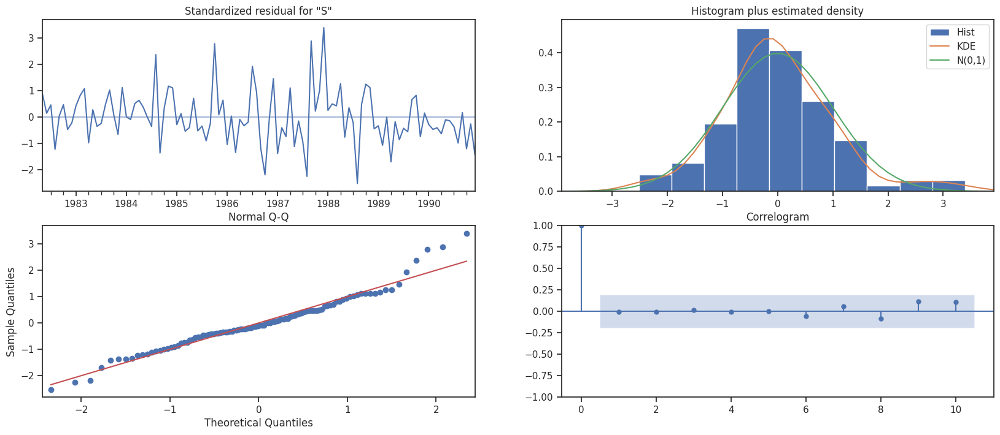

In [263]:
results_manual_SARIMA.plot_diagnostics()
plt.show()

#### Predict on the Test Set using this model and evaluate the model.

In [264]:
predicted_manual_SARIMA = results_manual_SARIMA.get_forecast(steps=len(test))

In [265]:
predicted_manual_SARIMA.predicted_mean

,predicted_mean
1991-01-31,1431.531789
1991-02-28,1348.287713
1991-03-31,1722.381255
1991-04-30,1621.897843
1991-05-31,1476.371932
1991-06-30,1255.612028
1991-07-31,1798.112901
1991-08-31,1612.942094
1991-09-30,2267.724197
1991-10-31,3183.852963


Text(0, 0.5, 'Wine Units Sold')

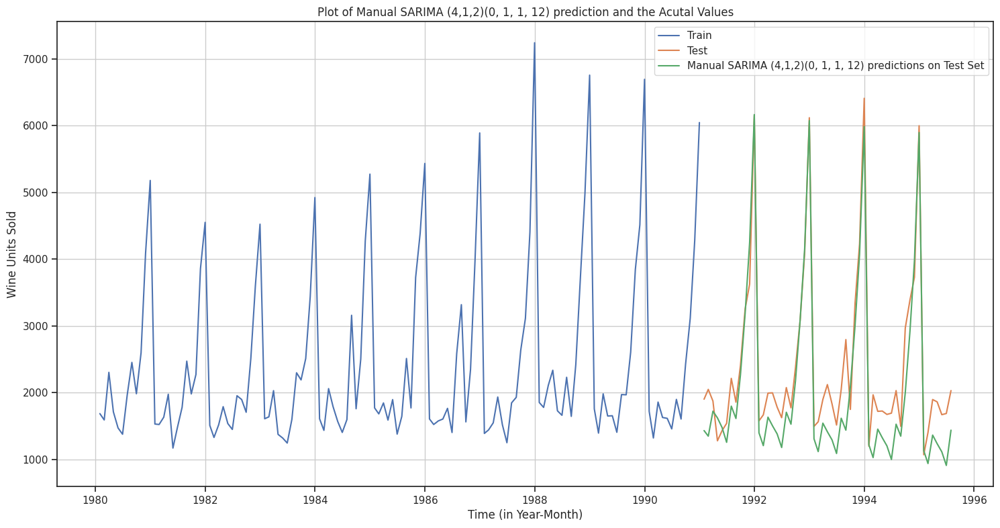

In [266]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Manual SARIMA (4,1,2)(0, 1, 1, 12) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [268]:
rmse = mean_squared_error(test['Sparkling_Wine_Sales'],predicted_manual_SARIMA.predicted_mean)
mape = mean_absolute_percentage_error(test['Sparkling_Wine_Sales'],predicted_manual_SARIMA.predicted_mean)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 219658.91381149445 
MAPE: 19.324924055784773


In [269]:
temp_resultsDf = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Manual SARIMA (4, 1, 2)(0, 1, 1, 12)'])


resultsDf_2 = pd.concat([resultsDf_2,temp_resultsDf])

resultsDf_2

,Test RMSE,MAPE
"Auto ARIMA (4,1,4)",1.472744e+06,39.756152
"Auto SARIMA (3,1,2)(3,0,1,12)",3.364246e+05,25.057898
"Manual ARIMA (2,1,1)",1.691876e+06,40.225668
"Manual SARIMA (4, 1, 2)(0, 1, 1, 12)",2.196589e+05,19.324924


## 8. Build a table (create a data frame) with all the models built along with their corresponding parameters and the respective RMSE values on the test data.

In [270]:
#Combining the tables which contained the exponential smoothing models and ARIMA/SARIMA into one
resultsDf_Final = pd.concat([resultsDf,resultsDf_2])

resultsDf_Final

,Test RMSE,MAPE
Linear Regression,1.389135e+03,NaN
Naive Model,1.493265e+07,NaN
Simple Average,1.625834e+06,NaN
2 point TMA,6.616207e+05,NaN
4 point TMA,1.337700e+06,NaN
6 point TMA,1.648470e+06,NaN
9 point TMA,1.812465e+06,NaN
"Alpha=0.6885, Beta=9.99e-05, Double Exponential Smoothing",4.029006e+06,NaN
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",2.011880e+06,NaN
"Alpha=0.111,Beta=0.0617,Gamma=0.395,Triple Exponential Smoothing",1.629787e+05,NaN


In [271]:
resultsDf_Final.sort_values(by='MAPE',ascending=True)

,Test RMSE,MAPE
"Manual SARIMA (4, 1, 2)(0, 1, 1, 12)",2.196589e+05,19.324924
"Auto SARIMA (3,1,2)(3,0,1,12)",3.364246e+05,25.057898
"Auto ARIMA (4,1,4)",1.472744e+06,39.756152
"Manual ARIMA (2,1,1)",1.691876e+06,40.225668
Linear Regression,1.389135e+03,NaN
Naive Model,1.493265e+07,NaN
Simple Average,1.625834e+06,NaN
2 point TMA,6.616207e+05,NaN
4 point TMA,1.337700e+06,NaN
6 point TMA,1.648470e+06,NaN


In [272]:
resultsDf_Final.sort_values(by='Test RMSE',ascending=True)

,Test RMSE,MAPE
Linear Regression,1.389135e+03,NaN
"Alpha=0.35,Beta=0.10,Gamma=0.20,Triple Exponential Smoothing",1.095860e+05,NaN
"Alpha=0.111,Beta=0.0617,Gamma=0.395,Triple Exponential Smoothing",1.629787e+05,NaN
"Manual SARIMA (4, 1, 2)(0, 1, 1, 12)",2.196589e+05,19.324924
"Auto SARIMA (3,1,2)(3,0,1,12)",3.364246e+05,25.057898
2 point TMA,6.616207e+05,NaN
4 point TMA,1.337700e+06,NaN
"Auto ARIMA (4,1,4)",1.472744e+06,39.756152
Simple Average,1.625834e+06,NaN
6 point TMA,1.648470e+06,NaN


## 9. Based on the model-building exercise, build the most optimum model(s) on the complete data and predict 12 months into the future with appropriate confidence intervals/bands.

From the above results we can see that Triple exponential model is the optimum model followed by Trailing moving average models. However lets take TES and Manual SARIMA and predict for the future.

Text(0, 0.5, 'Wine Units Sold')

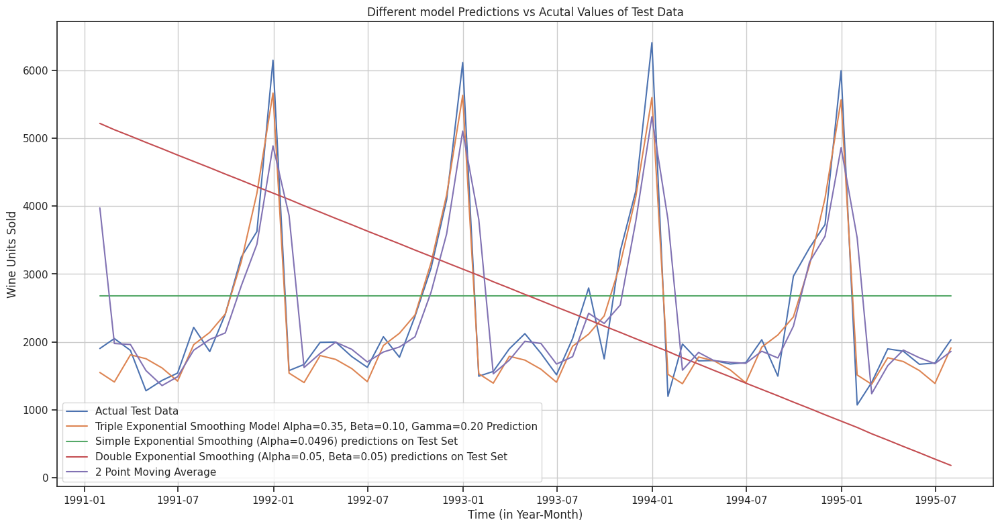

In [273]:
## Plotting on training data

plt.figure(figsize=(18,9))
plt.plot(test['Sparkling_Wine_Sales'], label='Actual Test Data')

plt.plot(TES_test['predict', 0.35,0.10,0.20], label='Triple Exponential Smoothing Model Alpha=0.35, Beta=0.10, Gamma=0.20 Prediction')

plt.plot(SES_test['predict'], label='Simple Exponential Smoothing (Alpha=0.0496) predictions on Test Set')

plt.plot(DES_test['predict'], label='Double Exponential Smoothing (Alpha=0.05, Beta=0.05) predictions on Test Set')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Moving Average')

plt.legend(loc='best')
plt.grid();
plt.title('Different model Predictions vs Acutal Values of Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

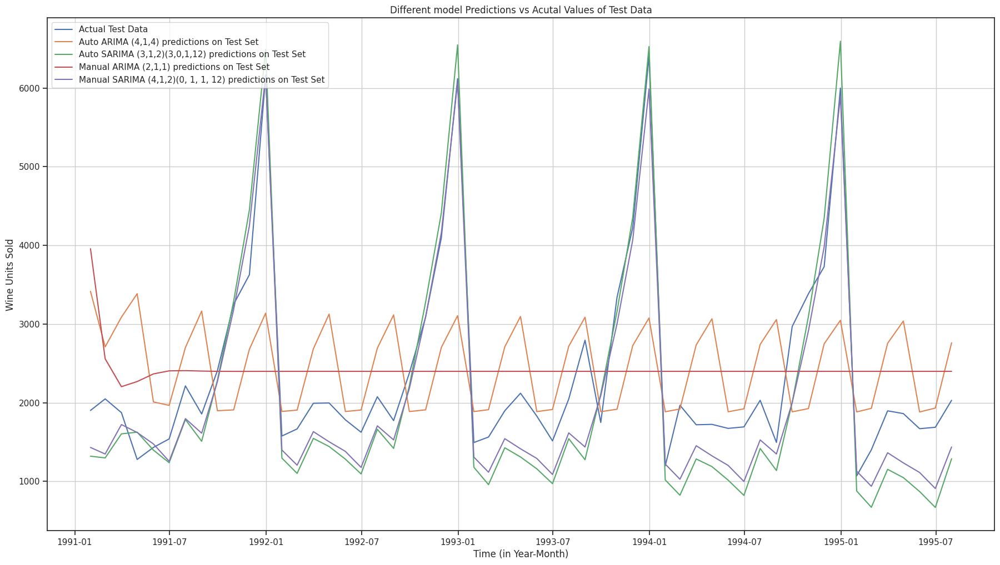

In [274]:
## Plotting on both the Training data

plt.figure(figsize=(22,12))
plt.plot(test['Sparkling_Wine_Sales'], label='Actual Test Data')

plt.plot(predicted_auto_ARIMA, label='Auto ARIMA (4,1,4) predictions on Test Set')

plt.plot(predicted_auto_SARIMA.predicted_mean, label='Auto SARIMA (3,1,2)(3,0,1,12) predictions on Test Set')

plt.plot(predicted_manual_ARIMA, label='Manual ARIMA (2,1,1) predictions on Test Set')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')


plt.legend(loc='upper left')
plt.grid();
plt.title('Different model Predictions vs Acutal Values of Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

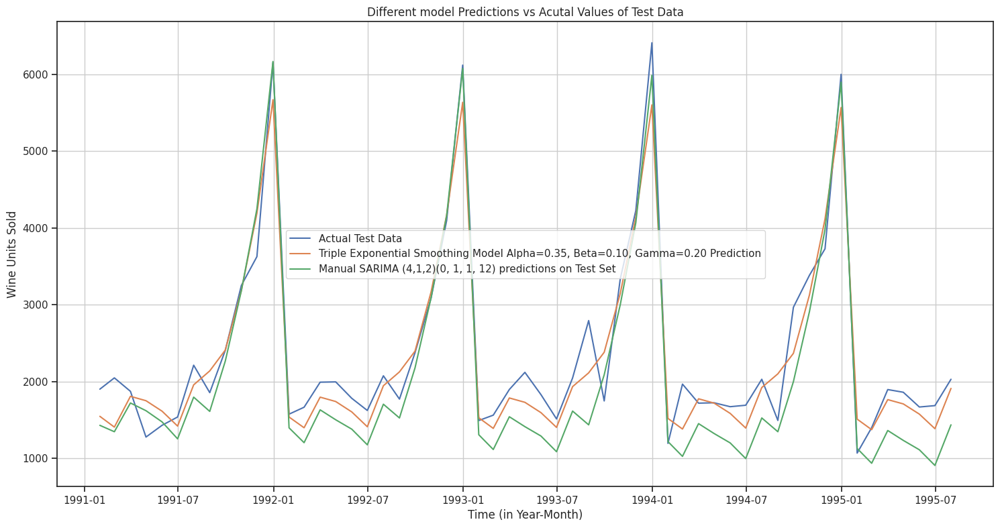

In [275]:
## Plotting on both the Training data

plt.figure(figsize=(18,9))
plt.plot(test['Sparkling_Wine_Sales'], label='Actual Test Data')

plt.plot(TES_test['predict', 0.35,0.10,0.20], label='Triple Exponential Smoothing Model Alpha=0.35, Beta=0.10, Gamma=0.20 Prediction')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Different model Predictions vs Acutal Values of Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

## Optimum Model - Triple Exponential Smoothing Model (Alpha=0.35,Beta=0.10,Gamma=0.20)

Text(0, 0.5, 'Wine Units Sold')

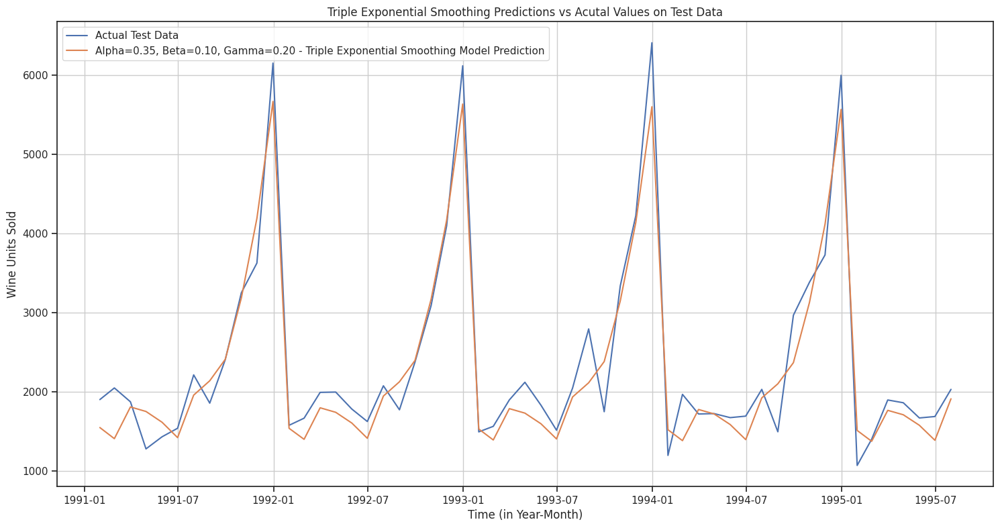

In [276]:
## Plotting on both the Training data

plt.figure(figsize=(18,9))
plt.plot(test['Sparkling_Wine_Sales'], label='Actual Test Data')

plt.plot(TES_test['predict', 0.35,0.10,0.20], label='Alpha=0.35, Beta=0.10, Gamma=0.20 - Triple Exponential Smoothing Model Prediction')

plt.legend(loc='best')
plt.grid();
plt.title('Triple Exponential Smoothing Predictions vs Acutal Values on Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

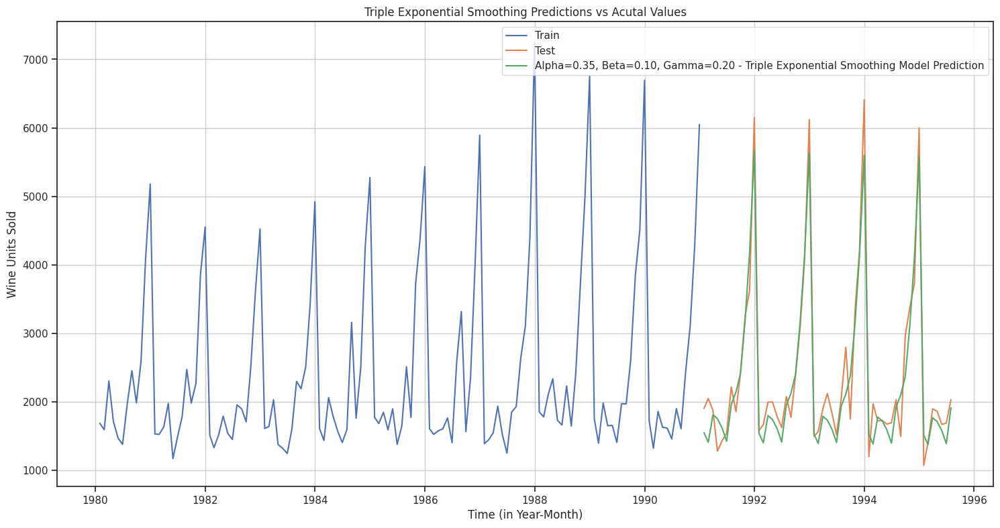

In [278]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(TES_test['predict', 0.35,0.10,0.20], label='Alpha=0.35, Beta=0.10, Gamma=0.20 - Triple Exponential Smoothing Model Prediction')

plt.legend(loc='best')
plt.grid();
plt.title('Triple Exponential Smoothing Predictions vs Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [279]:
TES_Fullmodel = ExponentialSmoothing(df['Sparkling_Wine_Sales'],trend='additive',seasonal='multiplicative',freq='M').fit(smoothing_level=0.35, smoothing_trend=0.10, smoothing_seasonal=0.20)

In [280]:
TES_Fullmodel.params

{'smoothing_level': np.float64(0.35),
 'smoothing_trend': np.float64(0.1),
 'smoothing_seasonal': np.float64(0.2),
 'damping_trend': nan,
 'initial_level': np.float64(2354.699419076268),
 'initial_trend': np.float64(-11.710277129763897),
 'initial_seasons': array([0.82703968, 0.80850536, 1.04951828, 0.94417133, 0.81994814,
        0.80505186, 1.07102615, 1.388651  , 1.18073163, 1.67037846,
        2.38517778, 3.16153763]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [282]:
RMSE_fullmodel = metrics.mean_squared_error(df['Sparkling_Wine_Sales'],TES_Fullmodel.fittedvalues)

print('RMSE:',RMSE_fullmodel)

RMSE: 139226.3780880203


In [283]:
# Getting the predictions for the 12 months into the future
prediction = TES_Fullmodel.forecast(steps=12)
print('Forecast of next 12 months')
prediction.tail(12)

Forecast of next 12 months


,0
1995-08-31,2043.554499
1995-09-30,2524.314535
1995-10-31,3362.269366
1995-11-30,4242.147675
1995-12-31,6498.255641
1996-01-31,1543.009735
1996-02-29,1807.690303
1996-03-31,2058.054824
1996-04-30,1988.083270
1996-05-31,1803.228604


Text(0, 0.5, 'Wine Units Sold')

<Figure size 1800x900 with 0 Axes>

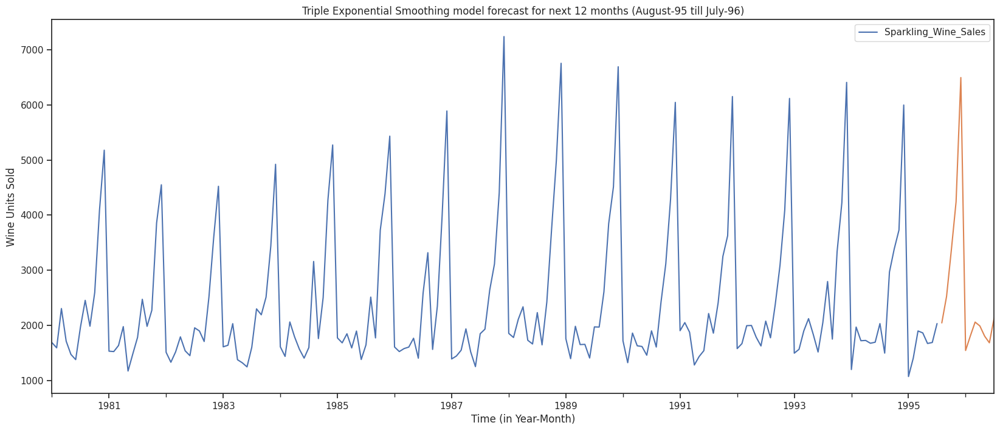

In [284]:
plt.figure(figsize=(18,9))
df.plot()
prediction.plot();
plt.title('Triple Exponential Smoothing model forecast for next 12 months (August-95 till July-96)')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [285]:
#In the below code, we have calculated the upper and lower confidence bands at 95% confidence level
#Here we are taking the multiplier to be 1.96 as we want to plot with respect to a 95% confidence intervals.
predicted_df = pd.DataFrame({'lower_ci':prediction - (1.96*np.std(TES_Fullmodel.resid,ddof=1)),
                          'prediction':prediction,
                          'upper_ci': prediction + (1.96*np.std(TES_Fullmodel.resid,ddof=1))})
predicted_df.head(12)

,lower_ci,prediction,upper_ci
1995-08-31,1310.263131,2043.554499,2776.845868
1995-09-30,1791.023166,2524.314535,3257.605903
1995-10-31,2628.977998,3362.269366,4095.560735
1995-11-30,3508.856307,4242.147675,4975.439044
1995-12-31,5764.964273,6498.255641,7231.547010
1996-01-31,809.718367,1543.009735,2276.301103
1996-02-29,1074.398934,1807.690303,2540.981671
1996-03-31,1324.763455,2058.054824,2791.346192
1996-04-30,1254.791901,1988.083270,2721.374638
1996-05-31,1069.937236,1803.228604,2536.519972


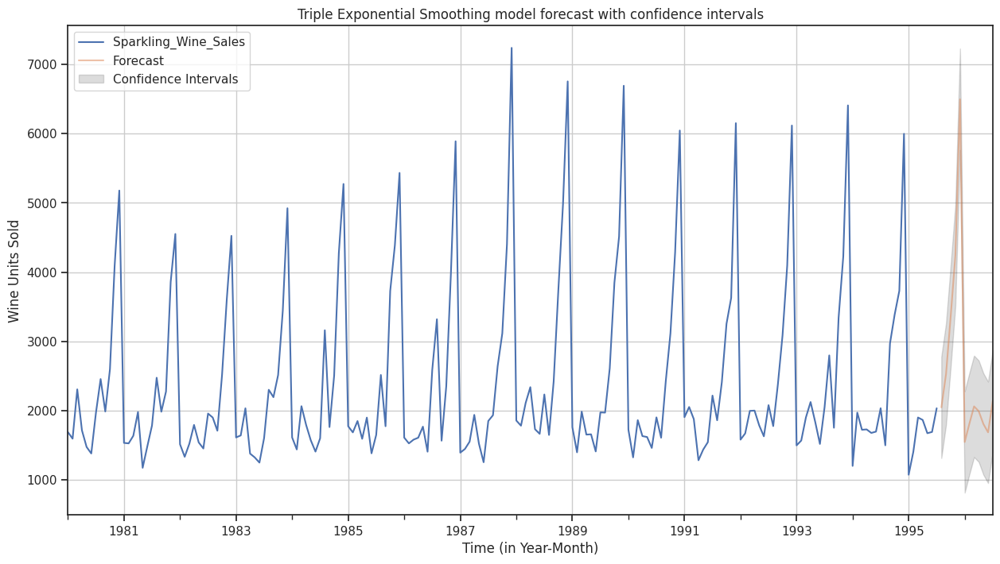

In [286]:
# plot the forecast along with the confidence band

axis = df.plot(label='Actual', figsize=(15,8))
predicted_df['prediction'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(predicted_df.index, predicted_df['lower_ci'], predicted_df['upper_ci'], color='k', alpha=.15,label='Confidence Intervals')
plt.title('Triple Exponential Smoothing model forecast with confidence intervals')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

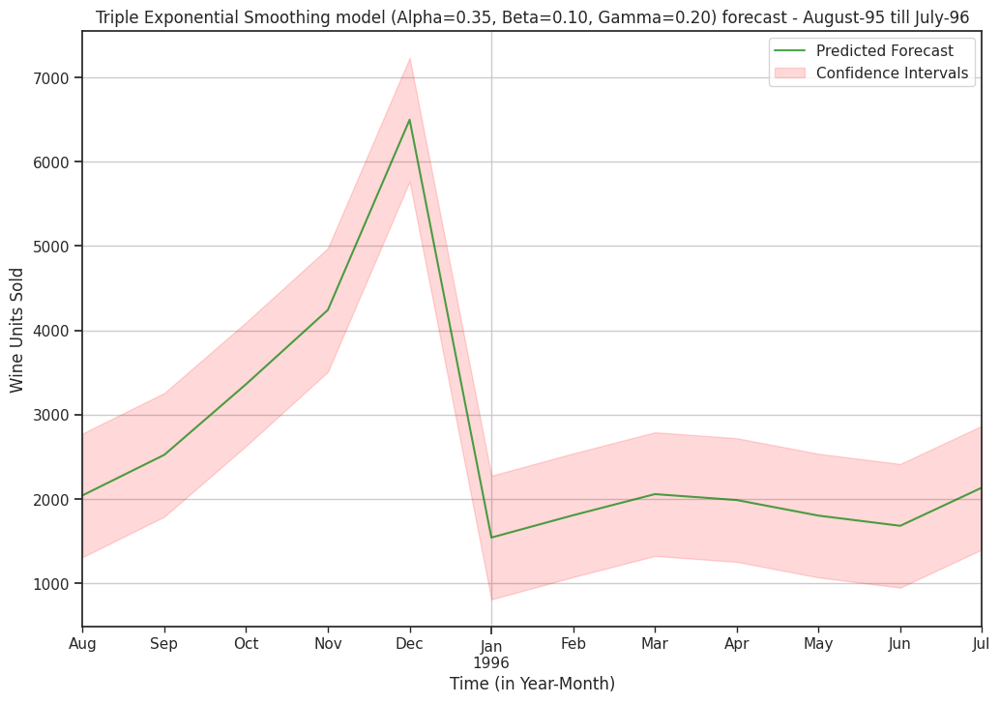

In [287]:
# plot the forecast along with the confidence band
plt.figure(figsize=(12,8))
axis = prediction.plot(color='Green', label='Predicted Forecast', alpha=0.7)
axis.fill_between(predicted_df.index, predicted_df['lower_ci'], predicted_df['upper_ci'], color='Red', alpha=.15, label='Confidence Intervals')
axis.set_title('Triple Exponential Smoothing model (Alpha=0.35, Beta=0.10, Gamma=0.20) forecast - August-95 till July-96')
axis.set_xlabel('Time (in Year-Month)')
axis.set_ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

## Optimum Model - Manual SARIMA Model (4, 1, 2)(0, 1, 1, 12)

Text(0, 0.5, 'Wine Units Sold')

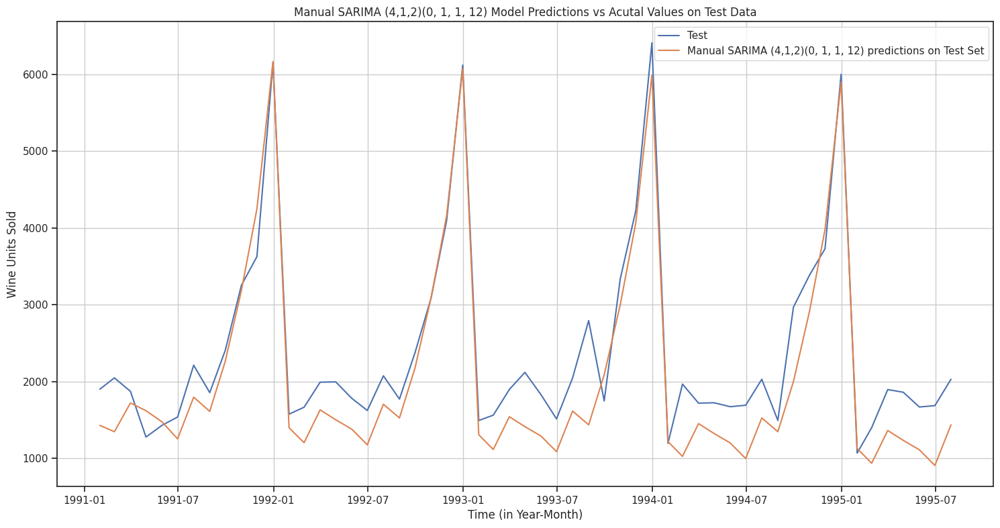

In [288]:
## Plotting on Test data

plt.figure(figsize=(18,9))
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Manual SARIMA (4,1,2)(0, 1, 1, 12) Model Predictions vs Acutal Values on Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

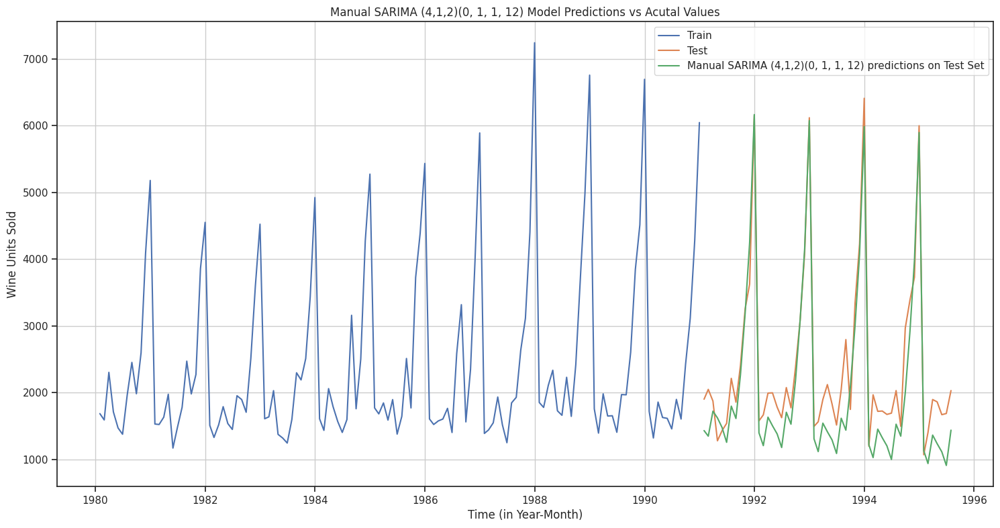

In [289]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Manual SARIMA (4,1,2)(0, 1, 1, 12) Model Predictions vs Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [290]:
Manual_Sarima_FullModel = sm.tsa.statespace.SARIMAX(df['Sparkling_Wine_Sales'],
                                order= (4, 1, 2),
                                seasonal_order= (0, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_fullmodel_manual_sarima = Manual_Sarima_FullModel.fit(maxiter=1000)
print(results_fullmodel_manual_sarima.summary())

                                      SARIMAX Results                                       
Dep. Variable:                 Sparkling_Wine_Sales   No. Observations:                  187
Model:             SARIMAX(4, 1, 2)x(0, 1, [1], 12)   Log Likelihood               -1171.945
Date:                              Sat, 03 May 2025   AIC                           2359.889
Time:                                      11:16:23   BIC                           2384.441
Sample:                                  01-31-1980   HQIC                          2369.859
                                       - 07-31-1995                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6275      0.517      1.213      0.225      -0.386       1.641
ar.L2         -0.15

In [291]:
predicted_manual_sarima_full_data = results_fullmodel_manual_sarima.get_forecast(steps=12)
predicted_manual_sarima_full_data.summary_frame(alpha=0.05).head()

Sparkling_Wine_Sales,mean,mean_se,mean_ci_lower,mean_ci_upper
1995-08-31,1850.816007,381.838467,1102.426364,2599.205651
1995-09-30,2396.195965,387.330991,1637.041173,3155.350758
1995-10-31,3227.083527,387.332108,2467.926545,3986.240509
1995-11-30,3898.042701,389.054298,3135.510290,4660.575113
1995-12-31,6099.973552,389.124420,5337.303704,6862.643401


In [292]:
predicted_manual_sarima_df = predicted_manual_sarima_full_data.summary_frame(alpha=0.05)
predicted_manual_sarima_df

Sparkling_Wine_Sales,mean,mean_se,mean_ci_lower,mean_ci_upper
1995-08-31,1850.816007,381.838467,1102.426364,2599.205651
1995-09-30,2396.195965,387.330991,1637.041173,3155.350758
1995-10-31,3227.083527,387.332108,2467.926545,3986.240509
1995-11-30,3898.042701,389.054298,3135.510290,4660.575113
1995-12-31,6099.973552,389.124420,5337.303704,6862.643401
1996-01-31,1231.642798,389.124421,468.972946,1994.312649
1996-02-29,1559.209321,389.811782,795.192269,2323.226374
1996-03-31,1801.348180,390.841297,1035.313314,2567.383045
1996-04-30,1780.038228,392.386622,1010.974581,2549.101874
1996-05-31,1627.831197,394.277575,855.061351,2400.601043


In [294]:
rmse_manual_sarima_full = metrics.mean_squared_error(df['Sparkling_Wine_Sales'],results_fullmodel_manual_sarima.fittedvalues)

rmse_manual_sarima_full

333515.89742823783

In [295]:
# Getting the predictions for the 12 months into the future
prediction_manual_sarima_full = results_fullmodel_manual_sarima.forecast(steps=12)
prediction_manual_sarima_full.tail(12)

,predicted_mean
1995-08-31,1850.816007
1995-09-30,2396.195965
1995-10-31,3227.083527
1995-11-30,3898.042701
1995-12-31,6099.973552
1996-01-31,1231.642798
1996-02-29,1559.209321
1996-03-31,1801.348180
1996-04-30,1780.038228
1996-05-31,1627.831197


Text(0, 0.5, 'Wine Units Sold')

<Figure size 1800x900 with 0 Axes>

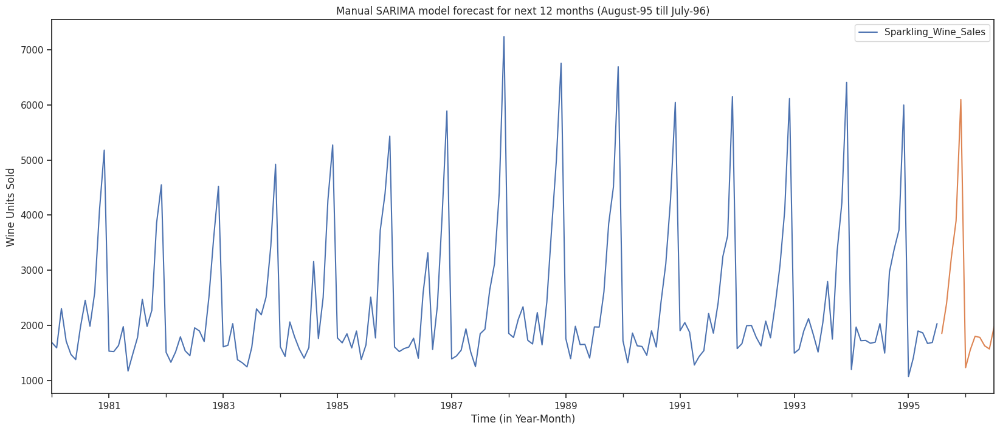

In [296]:
plt.figure(figsize=(18,9))
df.plot()
prediction_manual_sarima_full.plot();
plt.title('Manual SARIMA model forecast for next 12 months (August-95 till July-96)')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

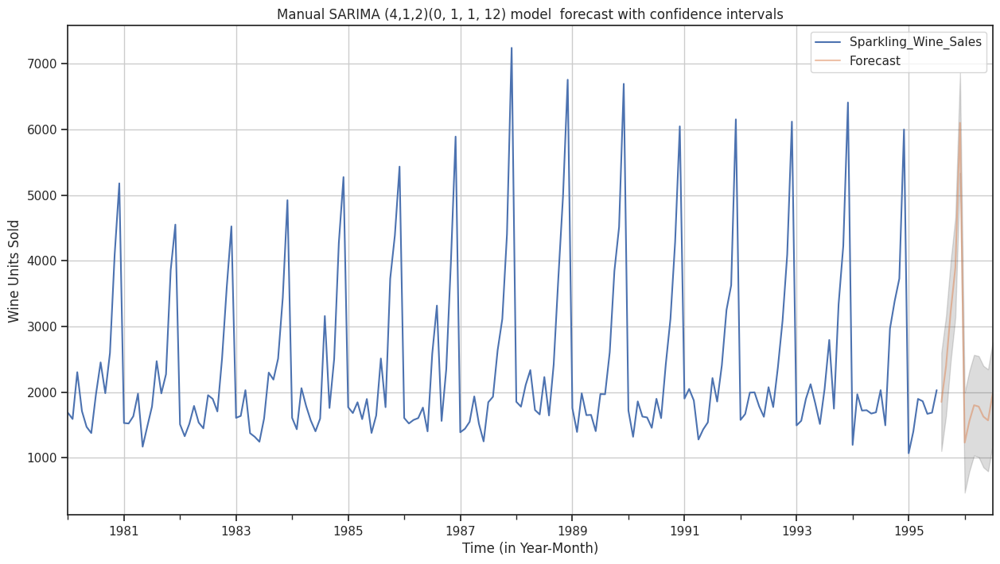

In [297]:
# plot the forecast along with the confidence band

axis = df.plot(label='Actual', figsize=(15,8))
predicted_manual_sarima_df['mean'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(predicted_manual_sarima_df.index, predicted_manual_sarima_df['mean_ci_lower'], predicted_manual_sarima_df['mean_ci_upper'], color='k', alpha=.15)
plt.title('Manual SARIMA (4,1,2)(0, 1, 1, 12) model  forecast with confidence intervals')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

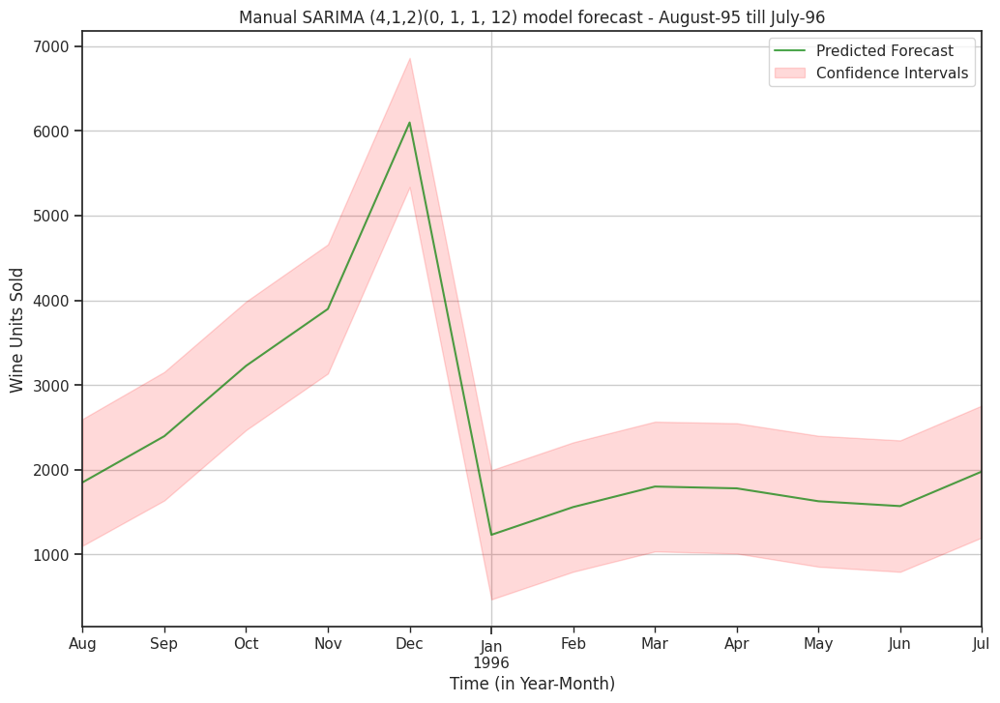

In [298]:
# plot the forecast along with the confidence band
plt.figure(figsize=(12,8))
axis = predicted_manual_sarima_df['mean'].plot(color='Green', label='Predicted Forecast', alpha=0.7)
axis.fill_between(predicted_manual_sarima_df.index, predicted_manual_sarima_df['mean_ci_lower'], predicted_manual_sarima_df['mean_ci_upper'], color='Red', alpha=.15, label='Confidence Intervals')
axis.set_title('Manual SARIMA (4,1,2)(0, 1, 1, 12) model forecast - August-95 till July-96')
axis.set_xlabel('Time (in Year-Month)')
axis.set_ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

## 10. Comment on the model thus built and report your findings and suggest the measures that the company should be taking for future sales.

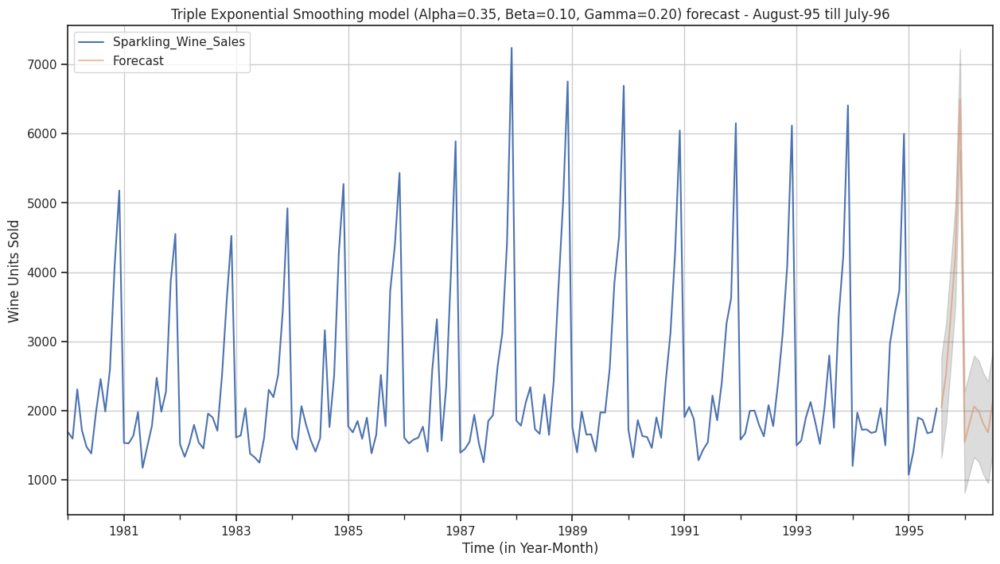

In [299]:
# plot the forecast along with the confidence band

axis = df.plot(label='Actual', figsize=(15,8))
predicted_df['prediction'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(predicted_df.index, predicted_df['lower_ci'], predicted_df['upper_ci'], color='k', alpha=.15)
plt.title('Triple Exponential Smoothing model (Alpha=0.35, Beta=0.10, Gamma=0.20) forecast - August-95 till July-96')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

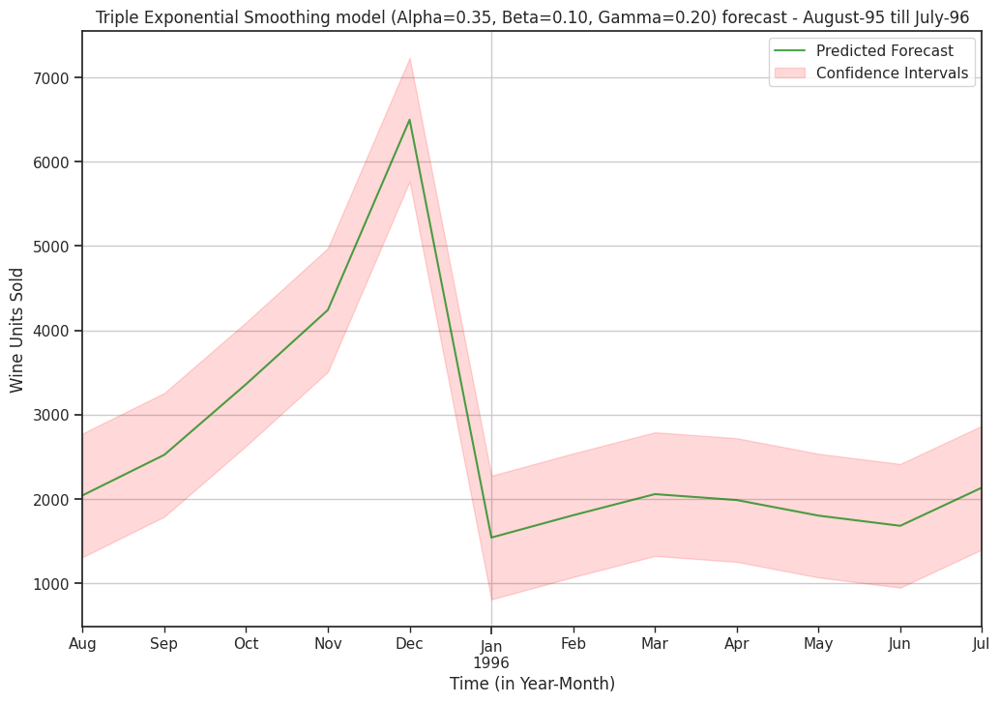

In [300]:
# plot the forecast along with the confidence band
plt.figure(figsize=(12,8))
axis = prediction.plot(color='Green', label='Predicted Forecast', alpha=0.7)
axis.fill_between(predicted_df.index, predicted_df['lower_ci'], predicted_df['upper_ci'], color='Red', alpha=.15, label='Confidence Intervals')
axis.set_title('Triple Exponential Smoothing model (Alpha=0.35, Beta=0.10, Gamma=0.20) forecast - August-95 till July-96')
axis.set_xlabel('Time (in Year-Month)')
axis.set_ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

In [301]:
TES_Fullmodel.forecast(steps=12)

,0
1995-08-31,2043.554499
1995-09-30,2524.314535
1995-10-31,3362.269366
1995-11-30,4242.147675
1995-12-31,6498.255641
1996-01-31,1543.009735
1996-02-29,1807.690303
1996-03-31,2058.054824
1996-04-30,1988.083270
1996-05-31,1803.228604


In [302]:
TES_Fullmodel.forecast(steps=12).describe()

,0
count,12.000000
mean,2640.707106
std,1442.074541
min,1543.009735
25%,1806.574878
50%,2050.804661
75%,2733.803243
max,6498.255641


In [303]:
#Calculating the percentage of sales in the last 4 months
(2527+3363+4240+6487)/TES_Fullmodel.forecast(steps=12).sum()

np.float64(0.5243860619531557)

We needed to construct an optimum model to forecast the sparkling wine sales for the next 12 months. The model information, insights and recommendations are as follows.  

Model Insights:
    
•	The time series in consideration exhibits a little rising trend and stable seasonality. When comparing the various models, we can see that Triple Exponential Smoothing and SARIMA models frequently deliver the greatest results. This is due to the fact that these models are excellent at predicting time series that demonstrate trend and seasonality.
•	We examine the root mean squared value of the forecast model to assess its performance (RMSE). The model with the lowest RMSE value and characteristics that match the test data is regarded as being a superior model.
•	We observed that SARIMA and the Triple Exponential Smoothing model had the lowest RMSE and the characteristics that most closely fit test data. As a result, they are regarded as the best models for forecasting.
Historical Insights:
•	The sparkling wine sales have remained stable throughout time. Sparkling wine sales peaked in 1988 and fell to their present low position in 1995 (as we have data for only first 7 months).
•	The monthly sales trajectory appears to be exactly the opposite of the yearly plot, with a progressive increase towards the end of each year. January has the lowest wine sales, while December has the highest. From January to August, sales increase gradually, and then they quickly increase after that.
•	The average monthly sales of sparkling wine are 2402 bottles. More than 50% of the sold units of sparkling wine fall between 1605 and 2549. 1070 units were sold as the lowest and 7242 units as the most. Only 25% of monthly sales that were recorded were for more than 2549 units.
•	Around 60 to 70 percent of the units sold are fewer than 2500, and 80% of the units sold are less than 4000. Only 20% of sales involved more than 3000 items. Therefore, it is clear that the bulk of sales were in the range of 1000 to 3000 units.

Forecast Insights:
    
•	Based on the forecast made by the Triple Exponential Smoothing model previously presented, the following insights are offered.
•	The forecast calls for average sale of 2639 units, up 237 units from the historical average of 2402 units. Thus, we might observe an increase in average sales of 10%.
•	The prediction is for a minimum sales volume of 1540 units, which is 470 units more than the minimum sales volume of 1070 units in the past. Consequently, a 43% increase in minimum sales is seen.
•	The projection estimates a maximum sales volume of 6487 units, which is 755 units fewer than the largest sales volume recorded in the past, which was 7242 units. Consequently, a 10% decrease in maximum sales is visible.
•	In comparison to the historical standard deviation of 1295 recorded in the past, the forecast's standard deviation is 1439 units, or 144 units higher. It's gone up by 11%. This is also anticipated because historical data tends to have less volatility than future data.
•	We can see from the prediction that the months of October, November, and December have increased sales. December is often when the sales are at their highest. There is a startling decline in sales in January following December. The months after January appear to witness a gradual improvement in sales until October, when it jumps sharply.

Recommendations:
    
•	Records show that the months of September, October, November, and December account for 50% of the total sales forecast. Many festivities take place in these months, and many people travel during this time. One of the most popular types of wine used during festive and event celebrations is sparkling wine.
•	Wine sales often climb in the final two months of the year as people hurry to buy holiday beverages. For forthcoming occasions like Thanksgiving, Christmas, and New Year's, people typically stock up. The majority of individuals also buy in bulk for holiday gatherings and gift-giving.
•	Many individuals choose wine as their go-to gift when it comes to occasions like parties and gift-giving. Sales of sparkling wine rise just before the winter holidays as more collectors purchase these wines as presents or look for vintages to serve at holiday gatherings.
•	The festival seasons may vary depending on where you are geographically, however the most of the celebrations take place in the last four months.
	In these months, promotional offers might be implemented to lower costs and significantly boost revenue.
	To increase sales, we must take advantage of all holiday events and set prices appropriately.
	Many individuals order in bulk to prepare for upcoming festivities, which may result in a high shipping expenditure. Businesses may provide significant discounts or free shipping beyond a certain threshold at these times.
	Giving customers gifts to improve their user experience is one of the greatest marketing strategies to deploy. In order to attract more consumers and increase sales, the company might provide free gifts on orders with significant sales.
	To target various client demographics, the proper marketing campaigns must be run
	Numerous ecommerce campaigns and competitions may be performed to broaden the product's audience and enhance sales.
•	The period from January to June is one of the key challenges for sparkling wine sales.
	To identify the elements affecting sales, in-depth market research must be conducted.
	Due to the fact that sparkling wines are typically used while celebrating, a market-friendly version of the existing product might be introduced by the company, helping to make up for the drop in sales. Long-term, this may bring in additional clients.
•	There are other key elements that might be driving the sales, despite the present model's ability to closely track the historical sales trend.
	The forecast might be improved by doing in-depth market research on the factors that influence sales and incorporating that information into the model for projection.
